#still_normal:静止Normal状态
首先是gyr经过矫正(矫正的方法就是通过till_normal的数据均值来做差)

acc: 相对来说信号平稳

gyr: 信号平稳，而且在0.01的幅度内震荡（噪声）

senser的左右方向为x方向，上下为y方向，前后为z方向

**暂时还不清楚磁场信号（mag）怎样利用**

In [15]:
%pylab inline


pylab.rcParams['figure.figsize'] = (14.0, 10.0)

import numpy as np
import matplotlib.pyplot as plt

# Get the IMU signals from a file
def getSigs(fileName):
    fin = open(fileName)

    lines = fin.readlines()
    fin.close()
    
    res = []
    for str in lines:
        tmp = str.split()
        tmp = map(eval, tmp)
        res.append(tmp)

    res_array = np.array(res)
    res_array = res_array[10:, :]
    #correctBias(res_array)
    
    return res_array


# Get labels corresponding sig
def getLabels(fileName):
    fin = open(fileName)
    lines = fin.readlines()
    fin.close()
    #print lines
    
    endpoint_label_list = []
    for line in lines:
        str_list = line.split(' ')
        int_list = map(int, str_list)
        endpoint_label_list.append(int_list)
    
    return endpoint_label_list



def extractSig(sigfilePath, labelfilePath):
    
    sig = getSigs(sigfilePath)
    endpoint_label_list = getLabels(labelfilePath)
    
    
    ## test
    true_label = []
    for tmp in endpoint_label_list:
        L = np.ones(tmp[1]-tmp[0]+1)*tmp[2]
        true_label.extend(L)
    
    return sig, np.array(true_label)



def getFilePath(fileName):
    dataDir = '../data/'
    labelDir = '../label/'
    
    sigFilePath = dataDir + fileName
    ind = fileName.find('.')
    
    if ind > -1:
        labelFilePath = labelDir + fileName[:ind] + '.label'
    else:
        logging.warning("wrong labelfilePath")
    
    return sigFilePath, labelFilePath




def correctBias(array):
    #still_array = getSigs('../data/still_normal.txt')
    
    
    # TODO, the parameters may need be adjusted when in different posture
    # The bias of gyr_x, gyr_y, gyr_z, statistics from still_normal.txt
    gyr_bias = np.array([-0.01568079, 0.02071555, 0.0186753 ])
    array[:, 3:6] = array[:, 3:6] - gyr_bias
    

def correctBias_accEnergy(acc_energy, gyr_energy, interval=30):
    # gyr has been unbiased
    T_still_gyr_energy = 0.01
    
    acc_energy_avg = np.mean(acc_energy[:10])
    #acc_energy_avg = 1.0
    N = len(acc_energy)
    acc_energy_correctBias = np.zeros(N)
    
    for i in range(0, N, interval):
        acc_energy_seg = acc_energy[i:i+interval]
        gyr_energy_seg = gyr_energy[i:i+interval]
        # Still
        if sum(gyr_energy_seg >= T_still_gyr_energy) == 0:
            acc_energy_avg = np.mean(acc_energy_seg)
        
        acc_energy_correctBias[i:i+interval] = np.sqrt((acc_energy_seg - acc_energy_avg)**2)
        
    return acc_energy_correctBias
    
def correctBias_gyr(gyr_xyz, gyr_energy, interval=30):
    T_still_gyr_energy = 0.04
    
    gyr_x = gyr_xyz[:,0]
    gyr_y = gyr_xyz[:,1]
    gyr_z = gyr_xyz[:,2]
    
    N = len(gyr_energy)
    
    gyr_x_avg = -0.01568079
    gyr_y_avg = 0.02071555  
    gyr_z_avg = 0.0186753
    
    for i in range(0, N, interval):
        gyr_energy_seg = gyr_energy[i:i+interval]
        if sum(gyr_energy_seg >= T_still_gyr_energy) == 0:
            gyr_x_avg = np.mean(gyr_x[i:i+interval])
            gyr_y_avg = np.mean(gyr_y[i:i+interval])
            gyr_z_avg = np.mean(gyr_z[i:i+interval])
        gyr_x[i:i+interval] -= gyr_x_avg
        gyr_y[i:i+interval] -= gyr_y_avg
        gyr_z[i:i+interval] -= gyr_z_avg
            
    
# Calculate the 
def energyXYZ(array):
    energy_acc = np.sqrt(np.sum(array[:,0:3]**2, 1))
    energy_gyr = np.sqrt(np.sum(array[:,3:6]**2, 1))
    energy_mag = np.sqrt(np.sum(array[:,6:]**2, 1))
    tmp = np.array([energy_acc, energy_gyr, energy_mag])
    return np.transpose(tmp)


def plotSigs(array, title_str):
    
    #f, ax = plt.subplots(3)
    f, ax = plt.subplots(2)

    ax[0].plot(array[:, 0], 'b', label='acc-x')
    ax[0].plot(array[:, 1], 'g', label='acc-y')
    ax[0].plot(array[:, 2], 'r', label='acc-z')
    ax[0].legend()

    ax[1].plot(array[:, 3], 'b', label='gyr-x')
    ax[1].plot(array[:, 4], 'g', label='gyr-y')
    ax[1].plot(array[:, 5], 'r', label='gyr-z')
    ax[1].legend()

    #ax[2].plot(array[:, 6], 'b', label='mag-x')
    #ax[2].plot(array[:, 7], 'g', label='mag-y')
    #ax[2].plot(array[:, 8], 'r', label='mag-z')
    #ax[2].legend()
    plt.xlabel('time')
    ax[0].set_title(title_str)
    plt.show()
    


def calZeroCrossRate(array):
    t1 = array[:-1]
    t2 = array[1:]
    zeroCrossRate = np.sum((t1*t2)<0)
    return zeroCrossRate

def calZeroCrossRate_xyz(array_xyz):
    zeroCrossRate_x = calZeroCrossRate(array_xyz[:,0])
    zeroCrossRate_y = calZeroCrossRate(array_xyz[:,1])
    zeroCrossRate_z = calZeroCrossRate(array_xyz[:,2])
    zeroCrossRate_xyz = [zeroCrossRate_x, zeroCrossRate_y, zeroCrossRate_z]
    return np.array(zeroCrossRate_xyz)
    
    
    
    

def plotEnergy3(energy_array, title_str):
    f, ax = plt.subplots(2)
    ax[0].plot(energy_array[:,0], 'b', label='unbiased acc energy')
    ax[1].plot(energy_array[:,1], 'r', label='unbiased gyr energy')
    ax[0].legend()
    ax[1].legend()
    plt.xlabel('time')
    ax[0].set_title(title_str)
    
    
    

    
    
def calEntrophy(gyr_energy):
    gyr_energy_norm = gyr_energy/sum(gyr_energy)
    entropy = -sum(gyr_energy_norm * np.log(gyr_energy_norm))
    return entropy






def calmanFilter(z, R=0.05**2):
    N = len(z)
    
    Q = 1e-5
    
    xhat = np.zeros(N)
    P = np.zeros(N)
    xhatminus = np.zeros(N)
    Pminus = np.zeros(N)
    K = np.zeros(N)
    
    xhat[0] = z[0]
    P[0] = 1.0
    
    
    for k in range(1, N):
        # time update
        xhatminus[k] = xhat[k-1]  #X(k|k-1) = AX(k-1|k-1) + BU(k) + W(k),A=1,BU(k) = 0
        Pminus[k] = P[k-1]+Q      #P(k|k-1) = AP(k-1|k-1)A' + Q(k) ,A=1

        # measurement update
        K[k] = Pminus[k]/( Pminus[k]+R ) #Kg(k)=P(k|k-1)H'/[HP(k|k-1)H' + R],H=1
        xhat[k] = xhatminus[k]+K[k]*(z[k]-xhatminus[k]) #X(k|k) = X(k|k-1) + Kg(k)[Z(k) - HX(k|k-1)], H=1
        P[k] = (1-K[k])*Pminus[k] #P(k|k) = (1 - Kg(k)H)P(k|k-1), H=1
    
    return xhat



# 根据事件的时间长度和整个事件的能量熵来同时来检测是否有震动
# 为什么这边只根据gyr energy来检测震动，因为，gyr energy在震动时是一个山峰，而acc energy则因为有1g 的bias
# 时一种震荡，暂时较难检测
def detectVibration(gyr_energy, gyr_energy_filter, acc_energy, acc_energy_filter):
    
    # Energy uppper threshold
    T_upper = 0.02
    
    energy_max = max(gyr_energy)
    
    # Energy lower threshold
    #T_lower = 0.03
    T_lower = energy_max/2
    
    N = len(gyr_energy)
    start_ind = -1
    end_ind = N-1
    
    max_period = 0
    num_period = 0
    
    
    
    for i in range(N):
        if start_ind == -1 and gyr_energy[i] >= T_upper:
            start_ind = i
        elif start_ind != -1 and (gyr_energy[i] < T_lower or i == N-1):
            end_ind = i
            tmp = end_ind - start_ind
            
            num_period += 1
            if tmp > max_period:
                max_period = tmp
                
                
            start_ind = -1
            
    entrophy_gyr = calEntrophy(gyr_energy)
    
    
    entrophy_acc = calEntrophy(acc_energy)
    #print num_period,
    
    
    #print "vibration: ", max_period, "entrophy gyr:", entrophy_gyr, "entrophy acc:", entrophy_acc
    
    T_period = 10
    T_entrophy = 2.8
    
    gyr_energy_filter_max = max(gyr_energy_filter)
    acc_energy_filter_max = max(acc_energy_filter)
    
    
    
    # 熵很小，表示能量很集中
    if (max_period < T_period and (entrophy_gyr < T_entrophy or entrophy_acc < T_entrophy)): 
        return True
    else:
       return False

 
def extractFeatures(acc_energy_seg, gyr_energy_seg):
    acc_min = min(acc_energy_seg)
    acc_max = max(acc_energy_seg)
    acc_avg = np.mean(acc_energy_seg)
    acc_std = np.std(acc_energy_seg)
    acc_entrophy = calEntrophy(acc_energy_seg)
    
    gyr_min = min(gyr_energy_seg)
    gyr_max = max(gyr_energy_seg)
    gyr_avg = np.mean(gyr_energy_seg)
    gyr_std = np.std(gyr_energy_seg)
    gyr_entrophy = calEntrophy(gyr_energy_seg)
    
    features = np.array([acc_min, acc_max, acc_avg, acc_std, acc_entrophy, gyr_min, gyr_max, gyr_avg,\
                        gyr_std, gyr_entrophy])
    return features
    
    
# classify vibration using trained model
def classifyVibreation(acc_energy, gyr_energy):
    features_mean = [0.000952000973704 , 0.194286318888 , 0.0385421548696 , 0.0469895260649 , 2.7227848987 , \
                     0.00269014390511 , 0.199455724819 , 0.0472600002731 , 0.0501533674823 , 2.77176581178]
    
    features_std = [0.00173738012652 , 0.218467389142 , 0.0586856225518 , 0.0582037726523 , 0.4353989121 ,\
                    0.00280160435942 , 0.181247415458 , 0.0569260882929 , 0.0526250891454 , 0.430318042765]
    
    coefs = [-0.901028005951 , 0.240717631089 , 0.215008926282 , 0.400052482044 , -0.240335062946 ,\
             -0.456934238853 , 0.69209487438 , -1.61818759692 , -0.598541043596 , -0.437675523147 ]
    
    intercept = -0.81884858
    
    features_mean = np.array(features_mean)
    features_std = np.array(features_std)
    coefs = np.array(coefs)
    
    
    features = extractFeatures(acc_energy, gyr_energy)
    features_norm = (features - features_mean)/features_std
    
    res = sum(features_norm * coefs) + intercept
    if res >= 0:
        return True
    else:
        return False

        

def classifyMoving(acc_energy, gyr_energy):
    features_mean = [0.000952000973704 , 0.194286318888 , 0.0385421548696 , 0.0469895260649 , 2.7227848987 , \
                     0.00269014390511 , 0.199455724819 , 0.0472600002731 , 0.0501533674823 , 2.77176581178]
    
    features_std = [0.00173738012652 , 0.218467389142 , 0.0586856225518 , 0.0582037726523 , 0.4353989121 ,\
                    0.00280160435942 , 0.181247415458 , 0.0569260882929 , 0.0526250891454 , 0.430318042765]
    
    coefs = [0.0350485903458 , 0.157850144083 , -0.585336685673 , -0.0734565873069 , 0.890674885505 ,\
             1.14754770319 , -1.01126030485 , 1.57410758289 , 0.147070224476 , 0.421546997494]
    
    intercept = 0.35973679
    
    features_mean = np.array(features_mean)
    features_std = np.array(features_std)
    coefs = np.array(coefs)
    
    
    features = extractFeatures(acc_energy, gyr_energy)
    features_norm = (features - features_mean)/features_std
    
    res = sum(features_norm * coefs) + intercept
    if res > 0:
        return True
    else:
        return False
    
    
    
def classifyState(energy_array, array):
    energy_acc = energy_array[:, 0]
    energy_gyr = energy_array[:, 1]
    
    energy_acc_filter = calmanFilter(energy_acc)
    
    array_acc = array[:, 0:3]
    array_gyr = array[:, 3:6]
    
    
    N = len(energy_gyr)
    
    energy_gyr_filter = calmanFilter(energy_gyr)
    
    
    # 30 points per second
    interval = 30
    states = []
    
    #print "seg energy sum"
    for i in range(0, N, interval):
        energy_acc_seg = energy_acc[i : i+interval]
        energy_gyr_seg = energy_gyr[i : i+interval]
        
        
        array_gyr_seg = array_gyr[i : i+interval, :]
        #print array_gyr_seg.shape
        
        energy_gyr_filter_seg = energy_gyr_filter[i : i+interval]
        energy_acc_fliter_seg = energy_acc_filter[i : i+interval]
        
        zeroCrossRate_gyr = calZeroCrossRate_xyz(array_gyr_seg)
        
        energy_gyr_seg_sum = sum(energy_gyr_seg)
         
        
        isRotatingPotential = False
        isRotatingPotential = (sum(zeroCrossRate_gyr == 0)>=1)
        
        
        acc_seg_max = np.max(energy_acc_seg)
        gyr_seg_max = np.max(energy_gyr_seg)
        
        
        
        
        # Threshold for ACC
        # 会随着传感器的变化而变化
        T_acc_energy_slow = 0.02
        
        ## Threshold for Gyr
        # 会随着传感器变化
        T_gyr_energy_slow = 0.01
        
        
        # 有统计依据
        T_gyr_energy_sum_rotate_lower = 1.5
        T_gyr_energy_sum_rotate_upper = 12
        T_gyr_energy_sum_vibration = 3
        T_gyr_energy_sum_acc = 0.25
        
        
        default_state = 0
        if gyr_seg_max > T_gyr_energy_slow or acc_seg_max > T_acc_energy_slow:
            # Having Rotation components
            if ((isRotatingPotential == True and energy_gyr_seg_sum > T_gyr_energy_sum_rotate_lower) or\
                energy_gyr_seg_sum >= T_gyr_energy_sum_rotate_upper):
                default_state += 2
        
            isVibrationPotential = detectVibration(energy_gyr_seg, energy_gyr_filter_seg, energy_acc_seg,\
                                      energy_acc_fliter_seg)
        
            if default_state == 0 and isVibrationPotential == True and\
                    energy_gyr_seg_sum <= T_gyr_energy_sum_vibration:# and \
                    #classifyVibreation(energy_acc_seg, energy_gyr_seg) == True:
                default_state = -1
                    
            elif (default_state == 0 and energy_gyr_seg_sum > T_gyr_energy_sum_acc): #or\
                #(default_state == 2 and acc_seg_max > T_acc_energy_slow):
                default_state += 1
                #if classifyMoving(energy_acc_seg, energy_gyr_seg):
                #    default_state += 1
                #else:
                #    default_state = -1
            
        
        states.append(default_state)
        
        
    
    states = np.array(states)
    
    states2 = np.zeros(0)
    for j in range(len(states)):
        states2 = np.concatenate((states2, np.ones(interval)*states[j]))
    return states2


 
def plot_true_predict_labels(true_label, predict_label):
    true_label[true_label == -1] = 0.5
    predict_label[predict_label == -1] = 0.5
    
    plt.plot(true_label, 'r', label='True state')
    plt.plot(predict_label, 'b', label='predict state')
    plt.legend()
    plt.title("0:Still  -1:Vibration   1:Moving   2:Rotating")
    plt.ylim([-1,3])
    plt.show()


def test(fileName):
    sigFilePath, labelFilePath = getFilePath(fileName)
    #res_array = getSigs(fileName)
    res_array, true_label = extractSig(sigFilePath, labelFilePath)
    
    
    
    
    energy_array = energyXYZ(res_array)
    #correct gyr bias
    correctBias_gyr(res_array[:,3:6], energy_array[:,1])
    # res_array have been changed, so compute again
    energy_array = energyXYZ(res_array)
    
    # unbiased acc energy
    energy_array[:,0] = correctBias_accEnergy(energy_array[:,0], energy_array[:,1])
    
    plotSigs(res_array, fileName)
    
    
    predict_label = classifyState(energy_array, res_array)
    
    pylab.rcParams['figure.figsize'] = (14.0, 4.0)
    plot_true_predict_labels(true_label, predict_label)
    pylab.rcParams['figure.figsize'] = (14.0, 10.0)
    
    plotEnergy3(energy_array, fileName + '-Energy')
    
  
    
    

    
    
    


Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


0.0198083005006


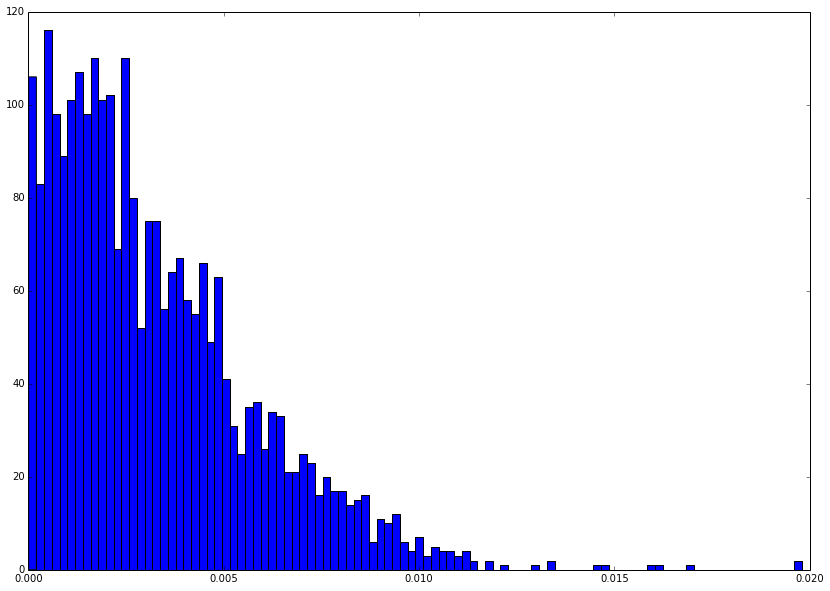

In [3038]:
if __name__=='__main__':
    dir = '../data/'
    still_fileNames = ['still_normal.txt', 'still_leftDown.txt', 'still_rightDown.txt', 'still_frontDown.txt',\
                 'still_backDown.txt', 'still_leftDownLean.txt', 'still_rightDownLean.txt',\
                 'still_frontDownLean.txt', 'still_backDownLean.txt']
    #fileName = dir + 'still_normal.txt'
    
    #test(fileName)
    res = np.zeros(0)
    for fileName in still_fileNames:
        res_array = getSigs(dir + fileName)
    
        energy_array = energyXYZ(res_array)
        energy_acc_correctBias = correctBias_accEnergy(energy_array[:,0], energy_array[:,1])
        
        res = np.concatenate((res, energy_acc_correctBias))
    print max(res)
    
    #plt.plot(res)
    #plt.show()
    plt.hist(res, 100)

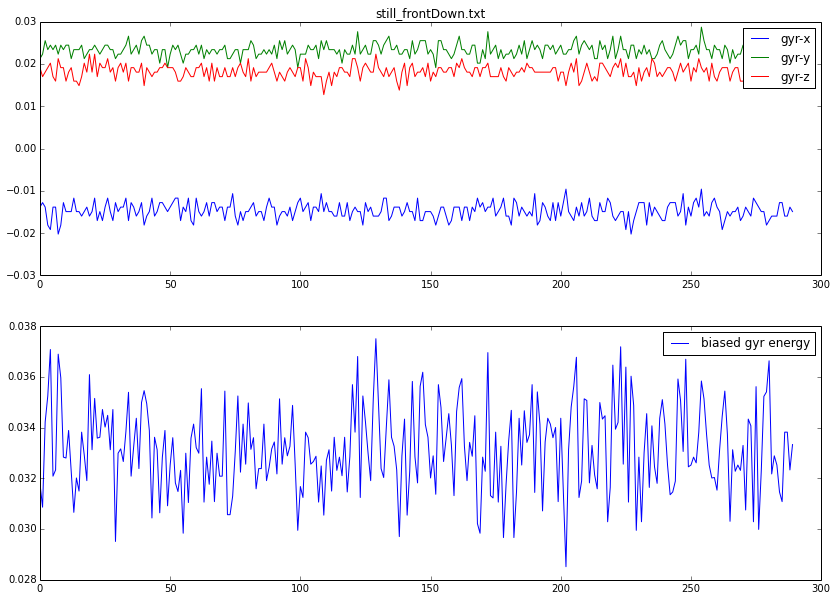

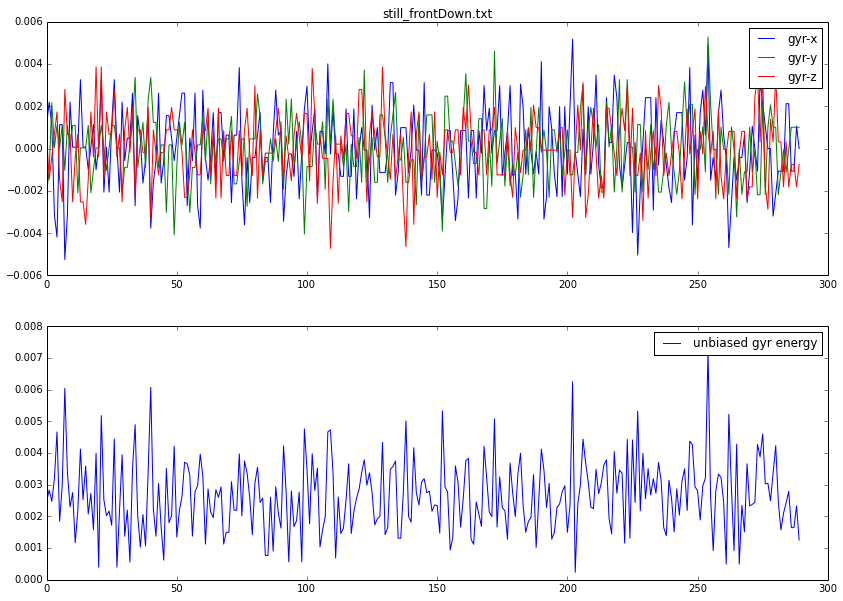

In [10]:
def test3(fileName):
    sigFilePath, labelFilePath = getFilePath(fileName)
    #res_array = getSigs(fileName)
    res_array, true_label = extractSig(sigFilePath, labelFilePath)
    
    energy_array = energyXYZ(res_array)
    fig, ax = plt.subplots(2)
    ax[0].plot(res_array[:,3], label = 'gyr-x')
    ax[0].plot(res_array[:,4], label = 'gyr-y')
    ax[0].plot(res_array[:,5], label = 'gyr-z')
    ax[0].legend()
    
    ax[1].plot(energy_array[:,1], label = 'biased gyr energy')
    ax[1].legend()
    ax[0].set_title(fileName)
    plt.show()
    
    correctBias_gyr(res_array[:,3:6], energy_array[:,1])
    # res_array have been changed, so compute again
    energy_array = energyXYZ(res_array)
    
    # unbiased acc energy
    energy_array[:,0] = correctBias_accEnergy(energy_array[:,0], energy_array[:,1])
    
    fig2, ax2 = plt.subplots(2)
    ax2[0].plot(res_array[:,3], label = 'gyr-x')
    ax2[0].plot(res_array[:,4], label = 'gyr-y')
    ax2[0].plot(res_array[:,5], label = 'gyr-z')
    ax2[0].legend()
    
    ax2[1].plot(energy_array[:,1], label = 'unbiased gyr energy')
    ax2[1].legend()
    ax2[0].set_title(fileName)
    plt.show()
    
    
    
if __name__ == '__main__':
    test3('still_frontDown.txt');
    
    

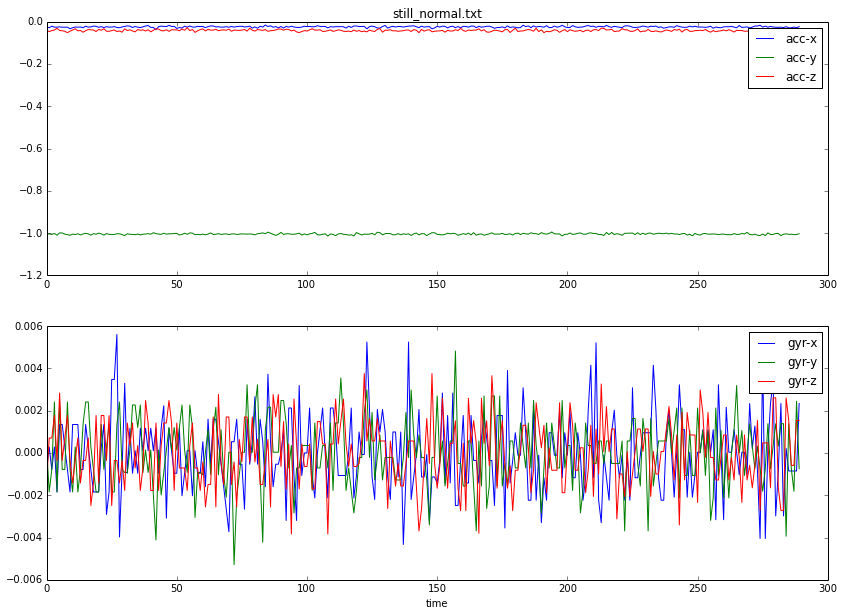

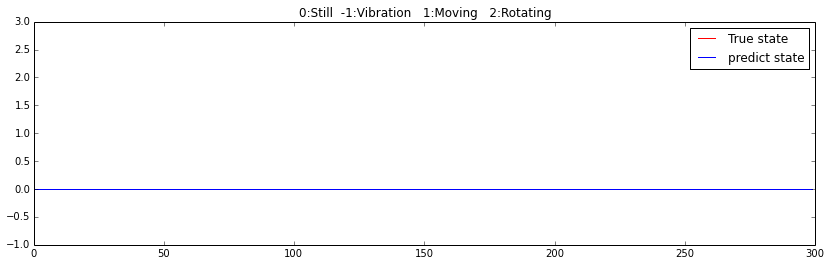

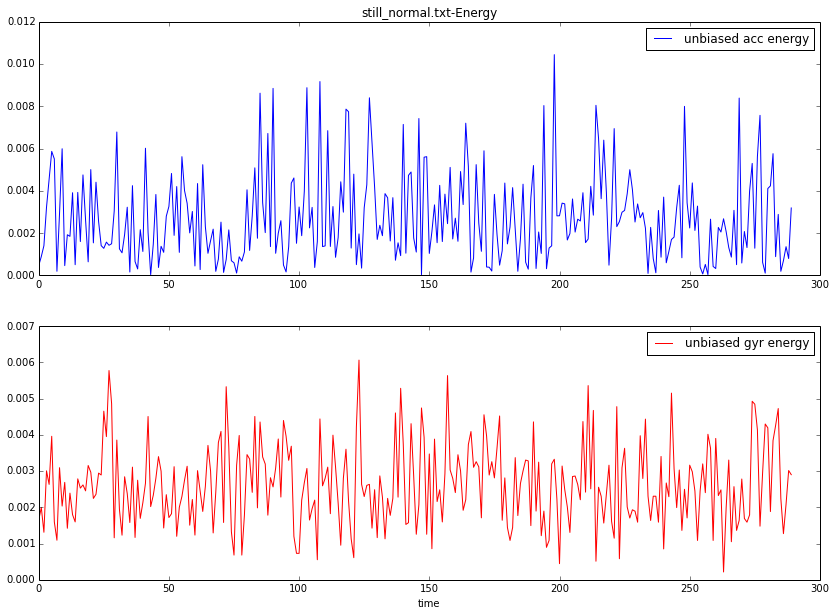

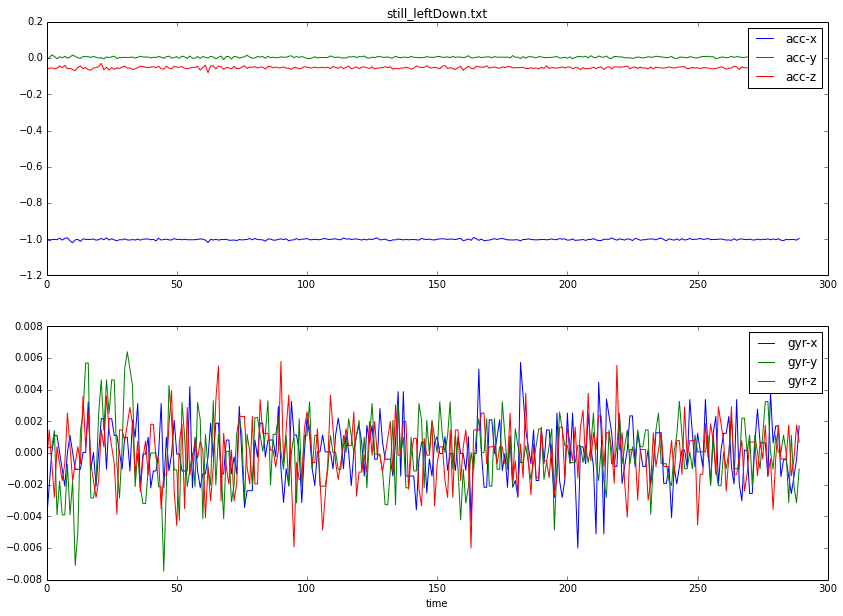

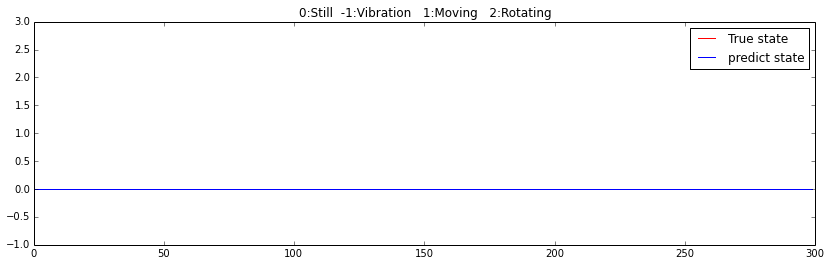

...

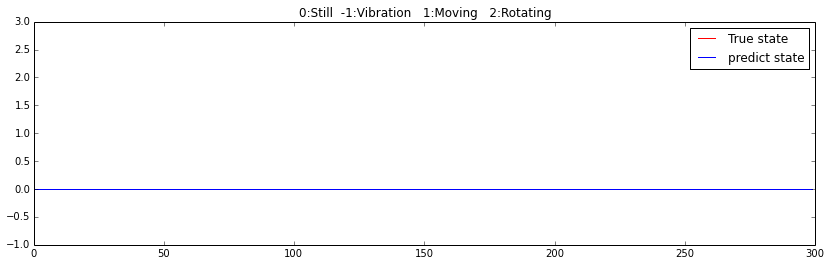

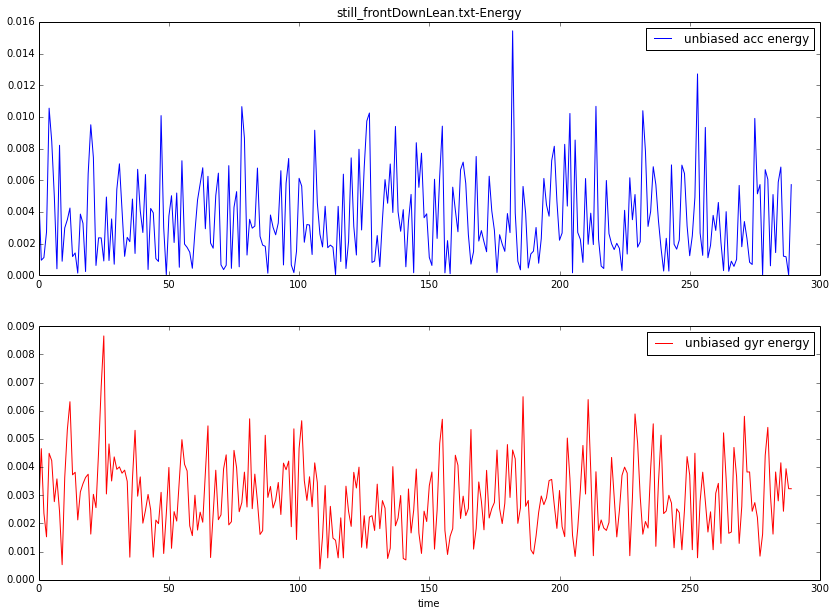

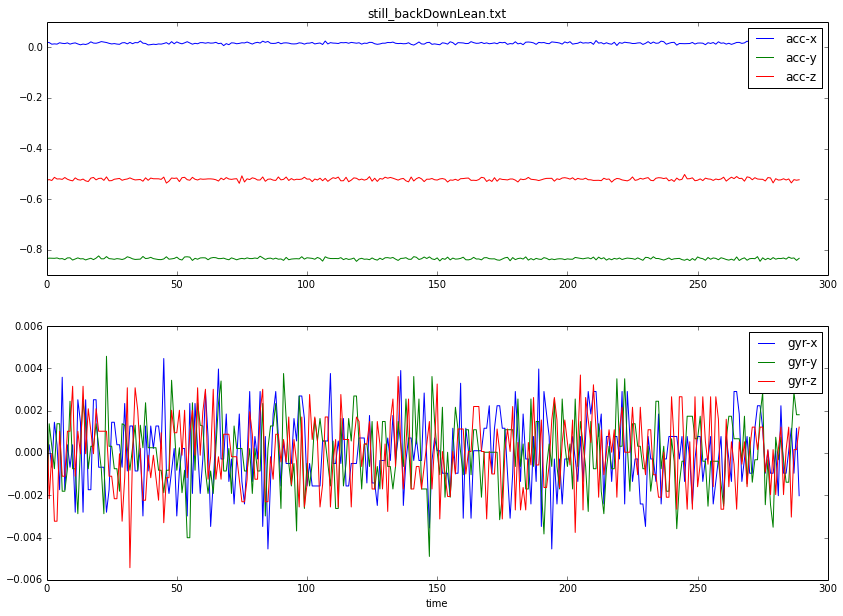

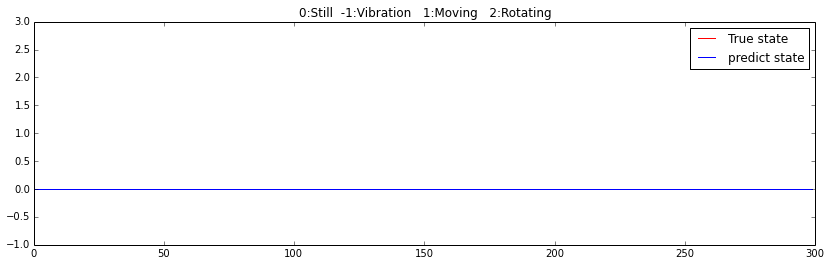

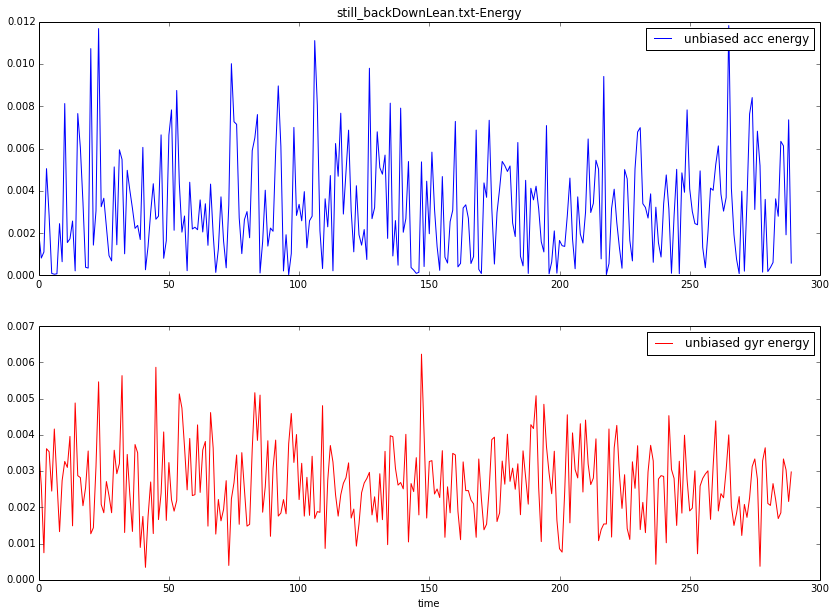

In [3039]:
if __name__=='__main__':
    dir = '../data/'
    still_fileNames = ['still_normal.txt', 'still_leftDown.txt', 'still_rightDown.txt', 'still_frontDown.txt',\
                 'still_backDown.txt', 'still_leftDownLean.txt', 'still_rightDownLean.txt',\
                 'still_frontDownLean.txt', 'still_backDownLean.txt']
    
    for fileName in still_fileNames:
        #fileName = dir + fileName
    
        test(fileName)

#motion_xMove_uniform: 沿着x匀速移动

* 首先acc跟still_normal 很像
* 理论上来说gyr信号也应该跟still_normal类似，但是gyr-y有0.1的震荡(相对x,z振幅更大)，应该是在是在移动过程中绕y轴的旋转很难控制（x,z轴式贴地的）
* 从energy的角度来看，acc-energy有0.1幅度的震荡，比静止（0.03）下要大一些
* 匀速移动跟匀速低俗旋转较难区分（这个差别可能可以区分，就是gyr信号在直线移动时是在0上下震荡的，但是匀速低速旋转时则是在0上方或者0下方震荡）

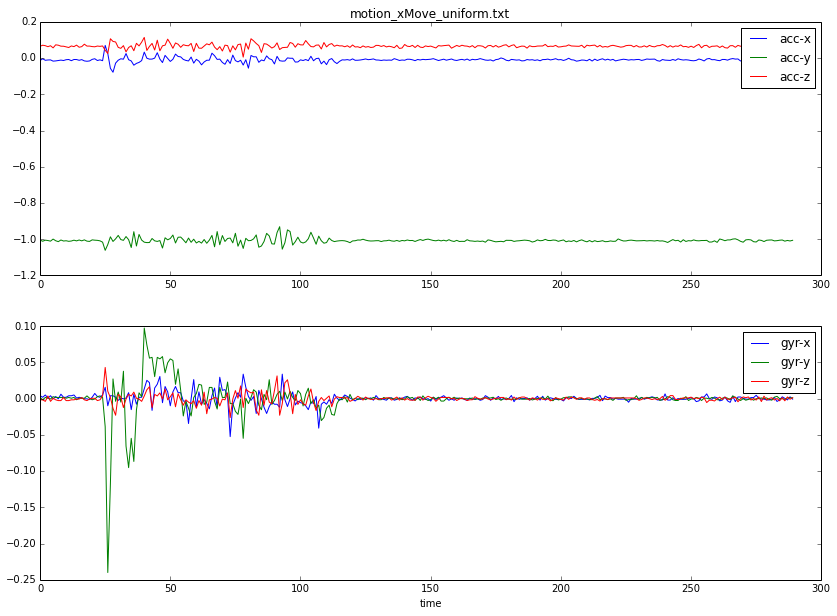

vibration:  2 entrophy gyr: 2.06607223601 entrophy acc: 2.7352331106
vibration:  5 entrophy gyr: 3.19973184052 entrophy acc: 3.06010505515
vibration:  2 entrophy gyr: 3.27676664804 entrophy acc: 3.12641336036
vibration:  5 entrophy gyr: 3.23142704862 entrophy acc: 2.94036035455


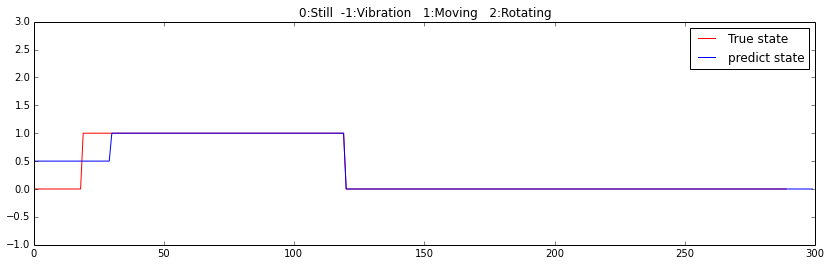

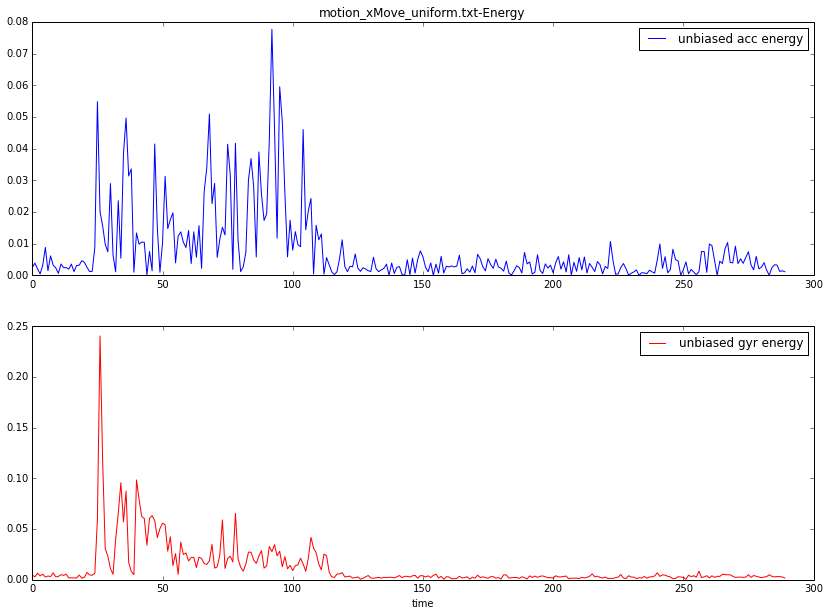

In [3040]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_xMove_uniform.txt'
    
    test(fileName)
    
    
    

* 沿着x慢匀速运动，当运动很慢时，就比较难用能量阈值的方法来进行识别

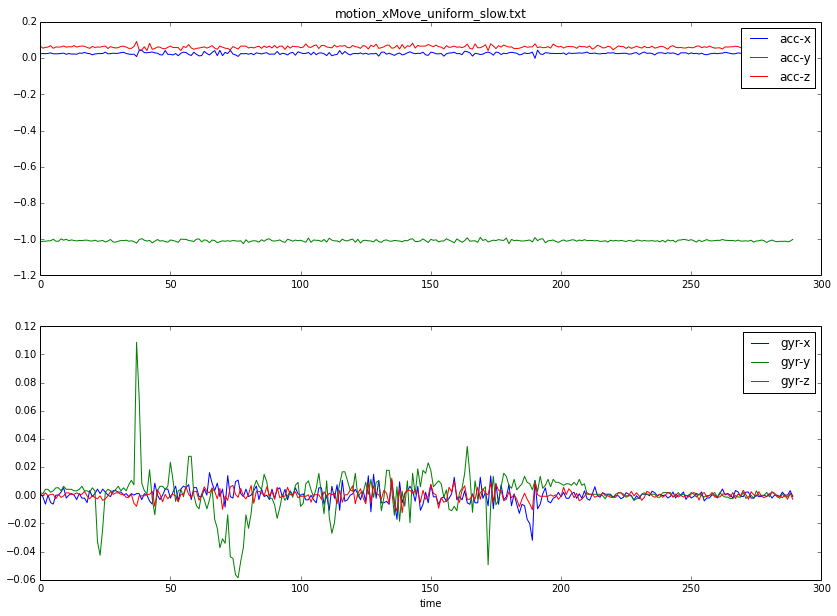

vibration:  3 entrophy gyr: 2.99410584986 entrophy acc: 3.08039428687
vibration:  2 entrophy gyr: 2.82585073315 entrophy acc: 2.9783291908
vibration:  6 entrophy gyr: 3.13440839842 entrophy acc: 3.01946062484
vibration:  2 entrophy gyr: 3.23509939495 entrophy acc: 3.10509731557
vibration:  3 entrophy gyr: 3.30928040989 entrophy acc: 3.08482159423
vibration:  1 entrophy gyr: 3.23395452497 entrophy acc: 3.01006469152
vibration:  3 entrophy gyr: 3.30936430024 entrophy acc: 3.00963662898


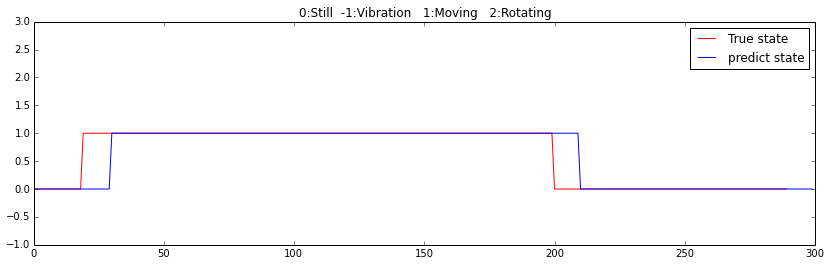

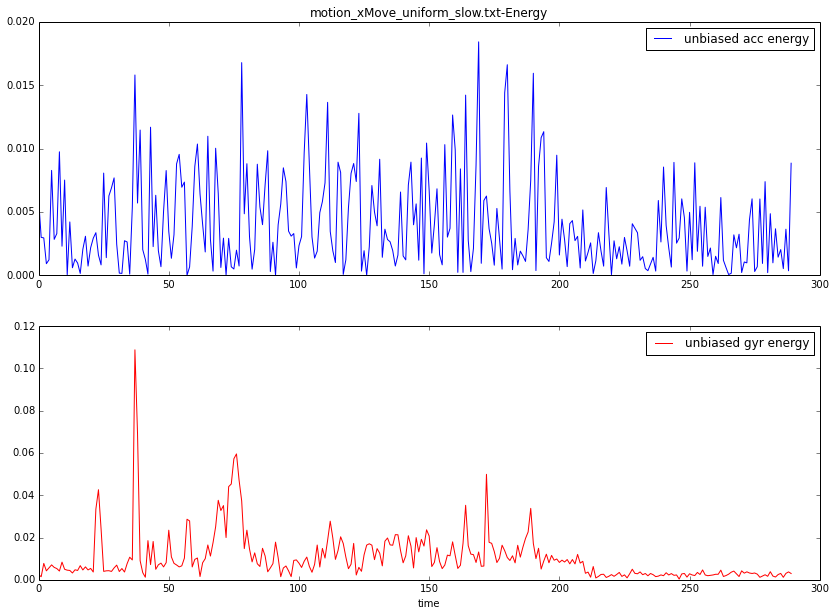

In [3041]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_xMove_uniform_slow.txt'
    
    test(fileName)
    

#motion_yMove_uniform: 沿着y轴匀速移动

* gyr三轴都波动较大，这里采集数据的过程中，三轴都很难控制

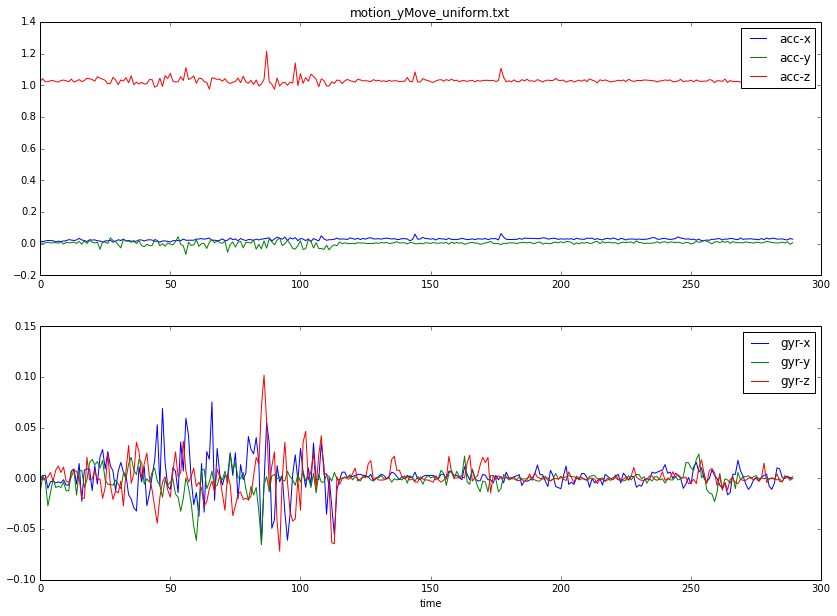

vibration:  3 entrophy gyr: 3.29079015865 entrophy acc: 3.06818468073
vibration:  4 entrophy gyr: 3.26665326751 entrophy acc: 3.0876955808
vibration:  4 entrophy gyr: 3.22829479096 entrophy acc: 2.79052569333
vibration:  3 entrophy gyr: 3.09774931358 entrophy acc: 2.99010908167
vibration:  1 entrophy gyr: 3.0834859669 entrophy acc: 2.7607218849
vibration:  4 entrophy gyr: 3.14855386997 entrophy acc: 2.60035852234
vibration:  0 entrophy gyr: 3.22231696617 entrophy acc: 3.11739557484
vibration:  0 entrophy gyr: 3.27318985426 entrophy acc: 3.1046225518
vibration:  3 entrophy gyr: 3.26060726392 entrophy acc: 3.14055454774
vibration:  0 entrophy gyr: 2.79183478466 entrophy acc: 2.6971018368


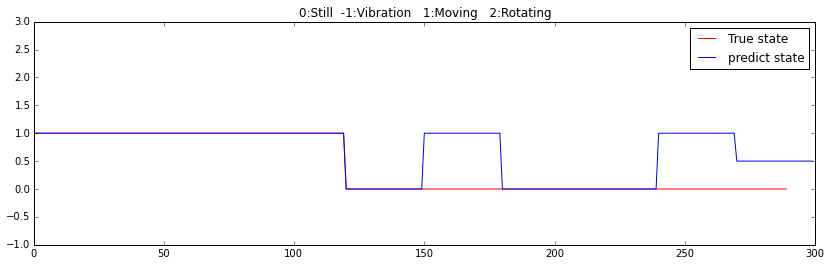

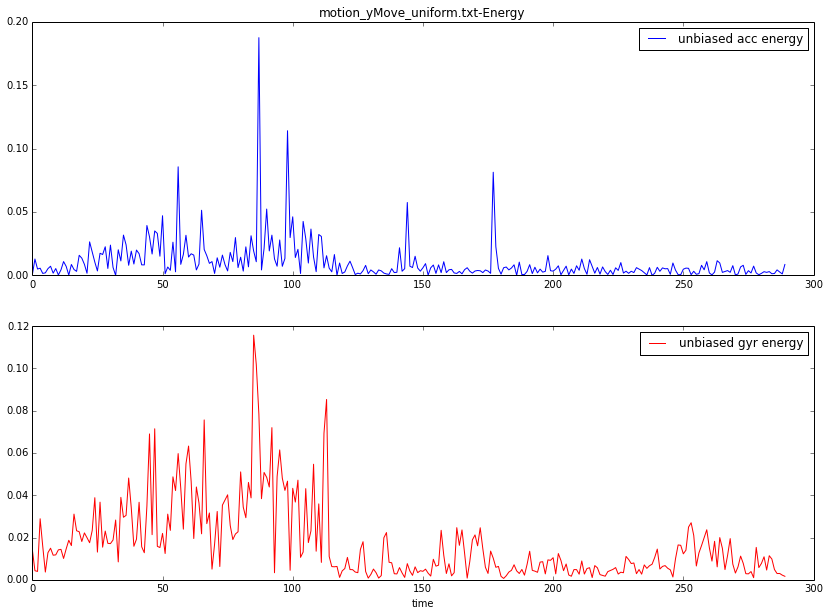

In [3042]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_yMove_uniform.txt'
    
    test(fileName)
    
    

# 沿着y轴低匀速移动

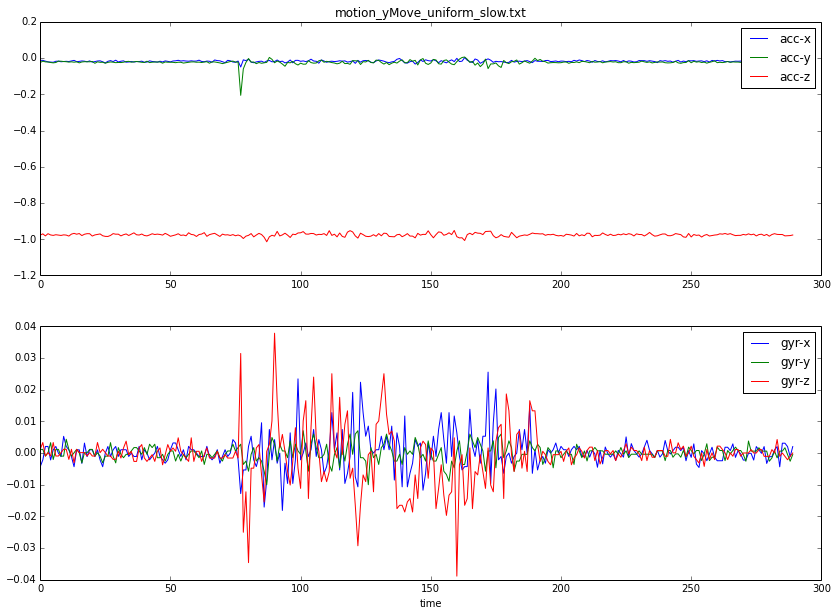

vibration:  2 entrophy gyr: 2.88840975816 entrophy acc: 2.8989776803
vibration:  1 entrophy gyr: 3.21790557245 entrophy acc: 3.11025392041
vibration:  2 entrophy gyr: 3.29527131486 entrophy acc: 3.15725039956
vibration:  2 entrophy gyr: 3.27718738119 entrophy acc: 3.04350765004
vibration:  3 entrophy gyr: 3.12576902061 entrophy acc: 3.12499363568


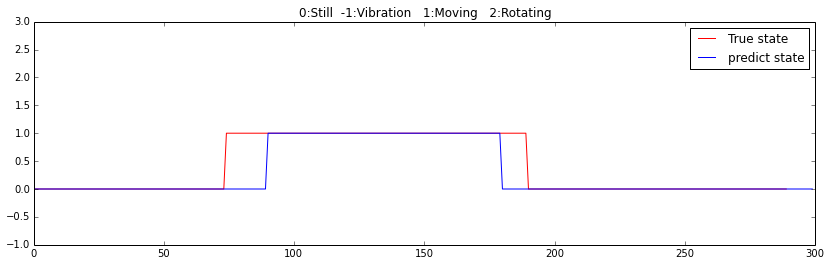

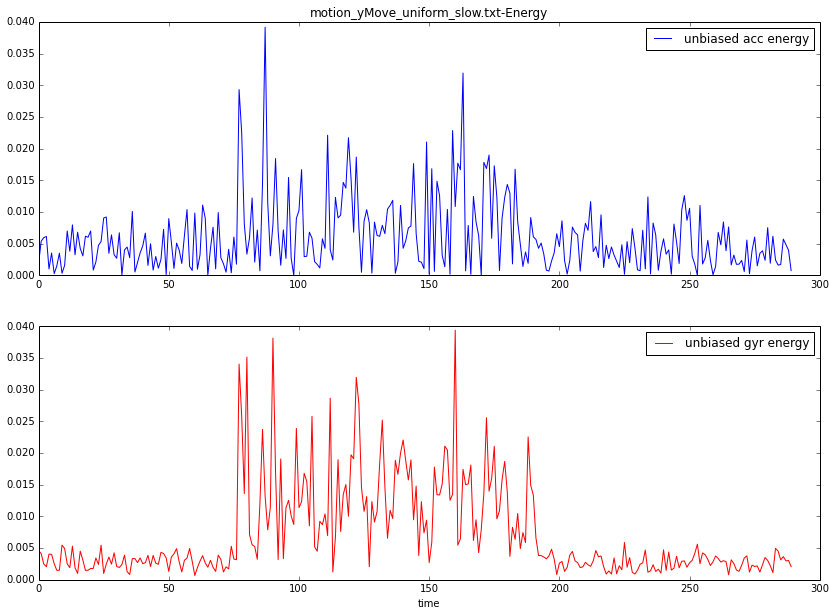

In [3043]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_yMove_uniform_slow.txt'
    
    test(fileName)
    
    

#motion_zMove_uniform: 沿着z轴匀速移动

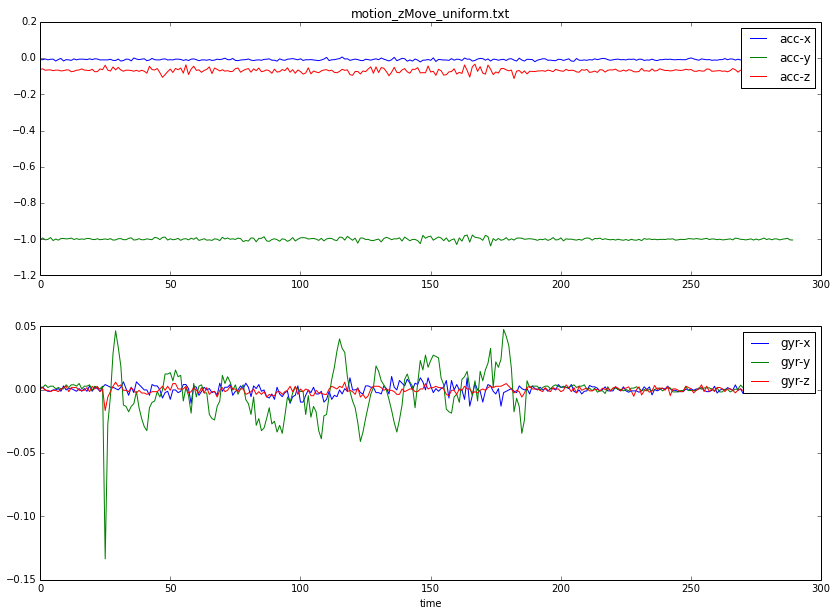

vibration:  1 entrophy gyr: 2.25218345309 entrophy acc: 3.21398938859
vibration:  3 entrophy gyr: 3.26103924662 entrophy acc: 3.1834002241
vibration:  5 entrophy gyr: 3.15914468651 entrophy acc: 3.15064002187
vibration:  5 entrophy gyr: 3.2320854031 entrophy acc: 3.15139624189
vibration:  4 entrophy gyr: 3.19921120404 entrophy acc: 3.02687860601
vibration:  4 entrophy gyr: 3.22804887111 entrophy acc: 3.11607336548
vibration:  2 entrophy gyr: 2.94421946001 entrophy acc: 3.12112598178


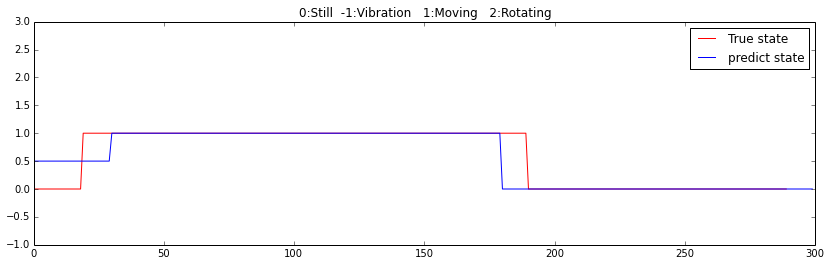

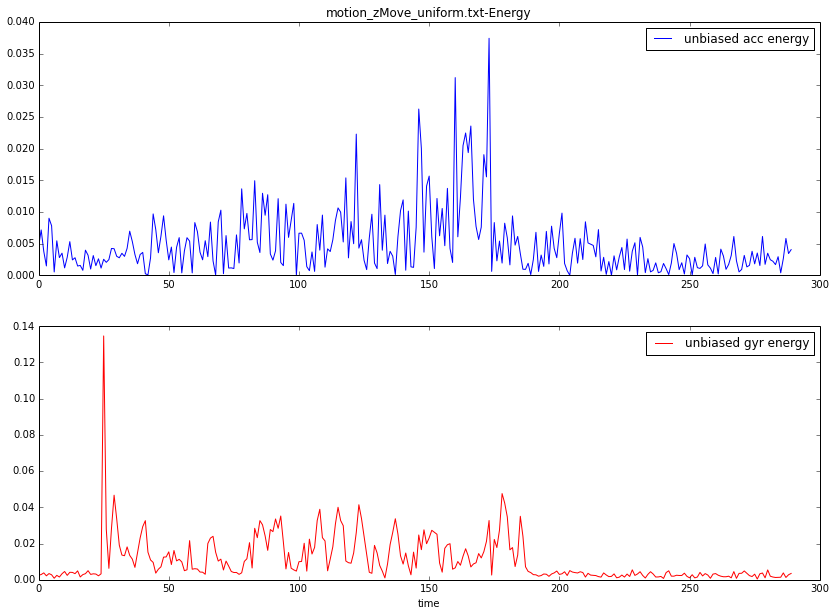

In [3044]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_zMove_uniform.txt'
    
    test(fileName)
    

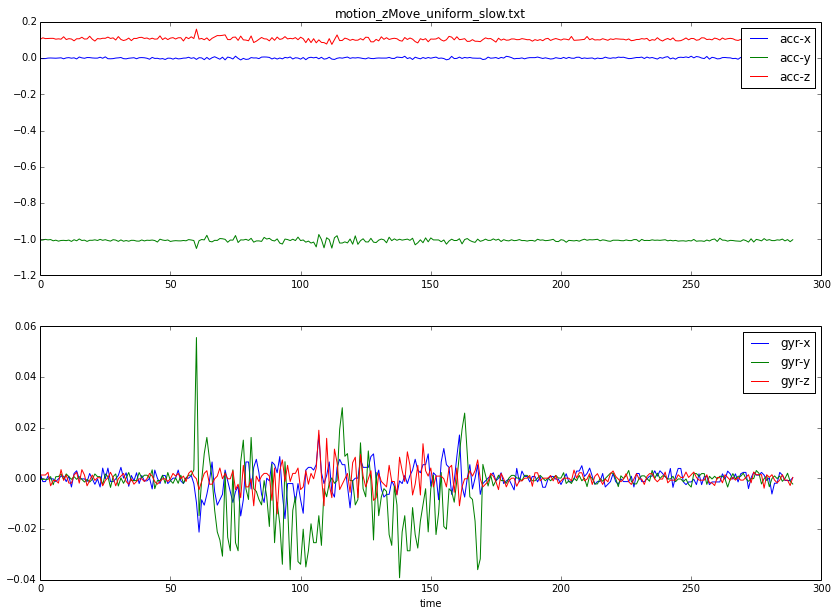

vibration:  2 entrophy gyr: 3.24206021526 entrophy acc: 2.86468986286
vibration:  10 entrophy gyr: 3.30157171124 entrophy acc: 3.06070284242
vibration:  2 entrophy gyr: 3.26426659772 entrophy acc: 3.16052452114
vibration:  3 entrophy gyr: 3.10556669135 entrophy acc: 3.10600928493


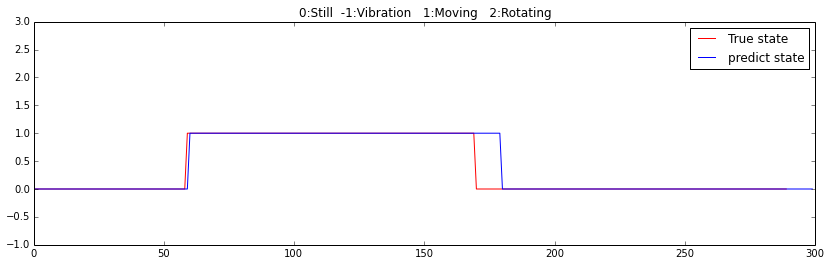

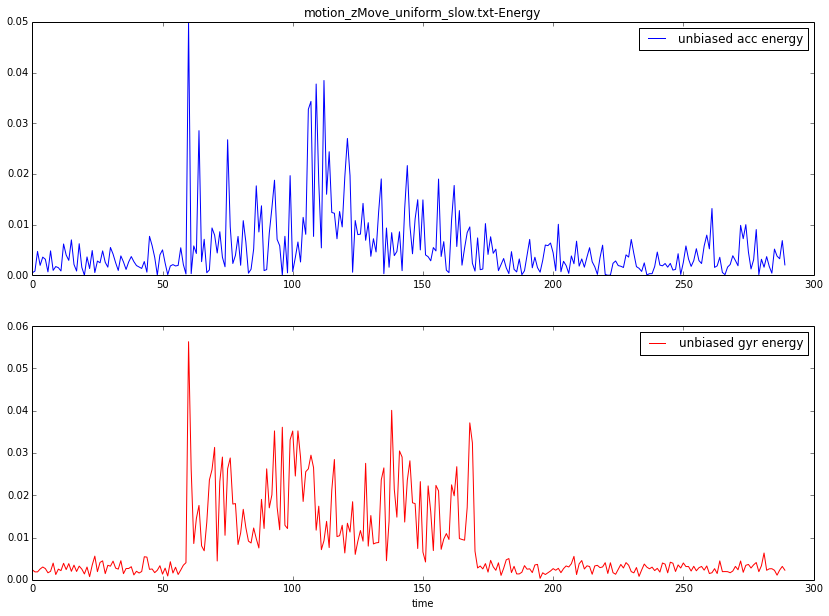

In [3045]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_zMove_uniform_slow.txt'
    
    test(fileName)
    
    

#motion_xyz_Move_uniform1.txt: 任意几个轴匀速直线移动

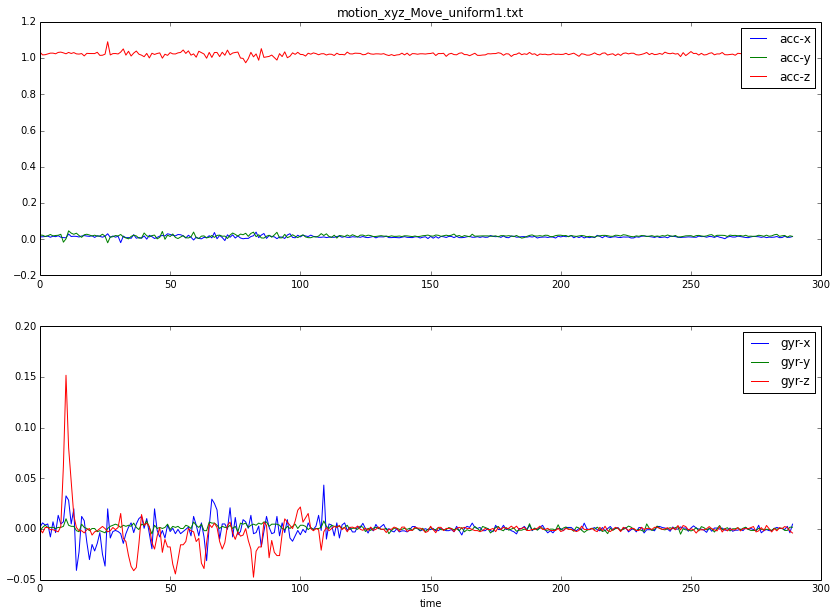

vibration:  3 entrophy gyr: 2.86523701061 entrophy acc: 2.68194540594
vibration:  4 entrophy gyr: 3.22884771299 entrophy acc: 3.04334087829
vibration:  3 entrophy gyr: 3.26105263306 entrophy acc: 3.13045414864
vibration:  3 entrophy gyr: 3.14310918309 entrophy acc: 3.02862341277


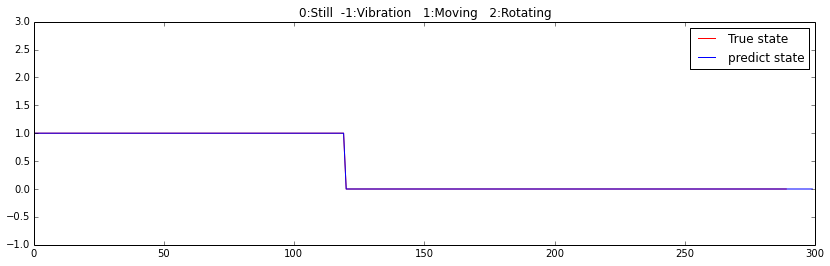

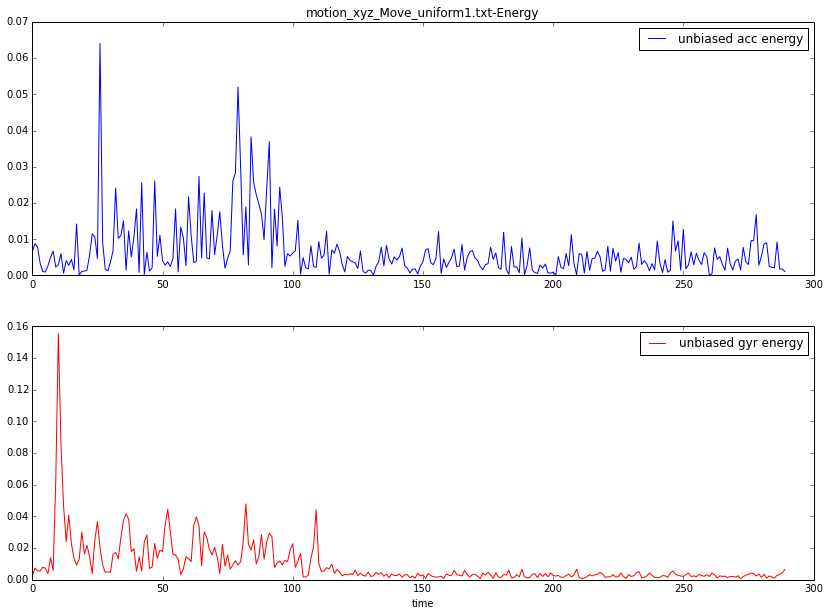

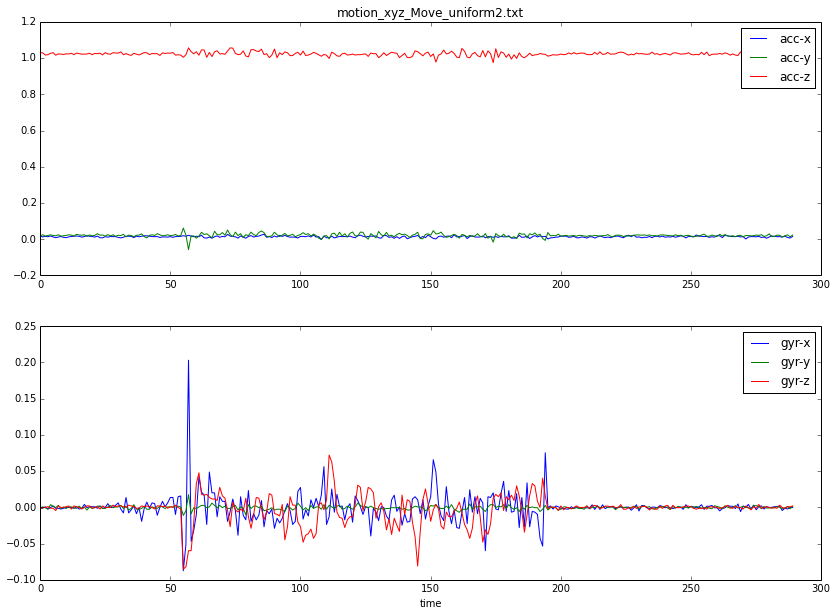

vibration:  1 entrophy gyr: 2.49080726983 entrophy acc: 2.98647246159
vibration:  2 entrophy gyr: 3.28313061874 entrophy acc: 3.1486734493
vibration:  5 entrophy gyr: 3.27117694246 entrophy acc: 3.1384147232
vibration:  3 entrophy gyr: 3.24565902825 entrophy acc: 3.04612575746
vibration:  3 entrophy gyr: 3.26575818324 entrophy acc: 3.05927646601
vibration:  3 entrophy gyr: 2.85630125633 entrophy acc: 3.03455541142


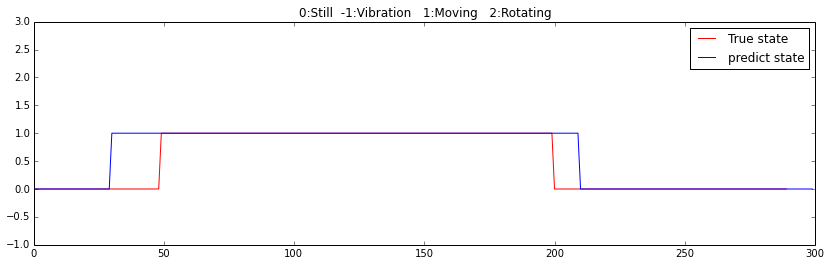

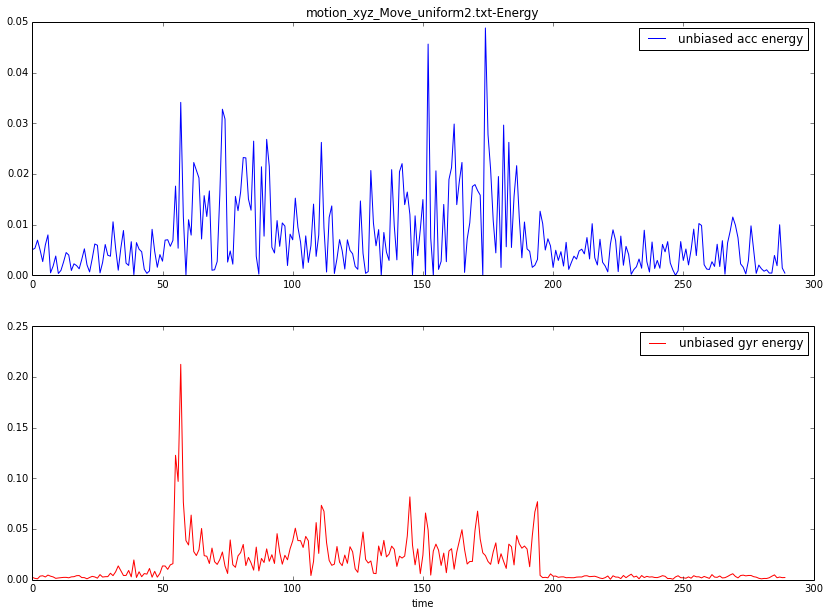

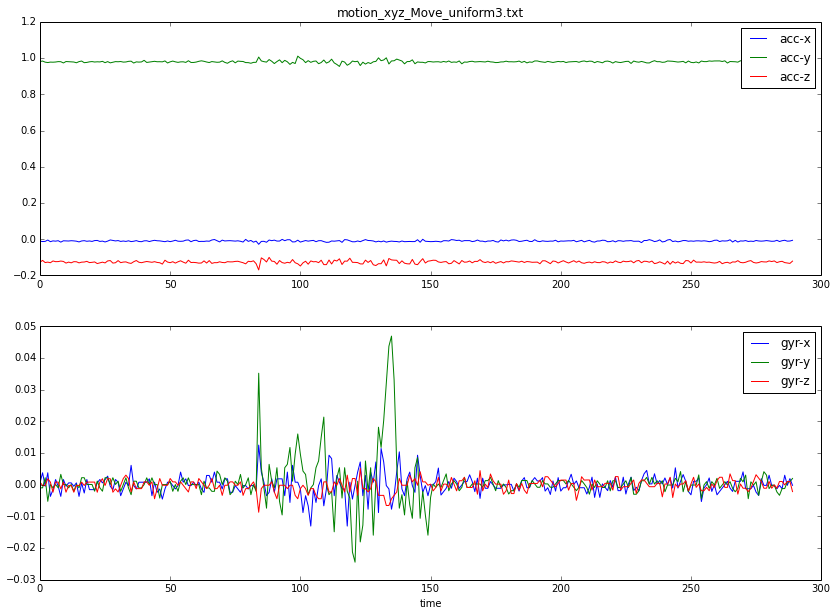

vibration:  1 entrophy gyr: 2.90275373304 entrophy acc: 2.90123605845
vibration:  1 entrophy gyr: 3.26328529937 entrophy acc: 3.12826887636
vibration:  5 entrophy gyr: 3.16442349841 entrophy acc: 3.08379210343


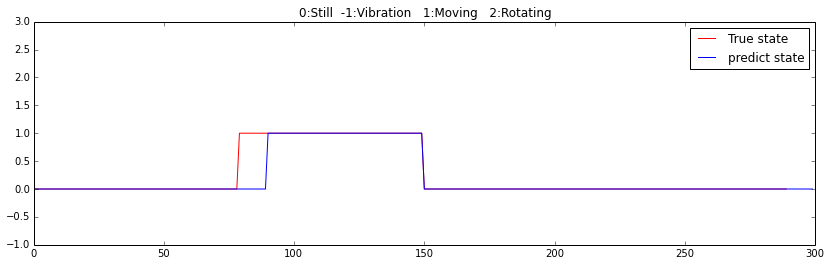

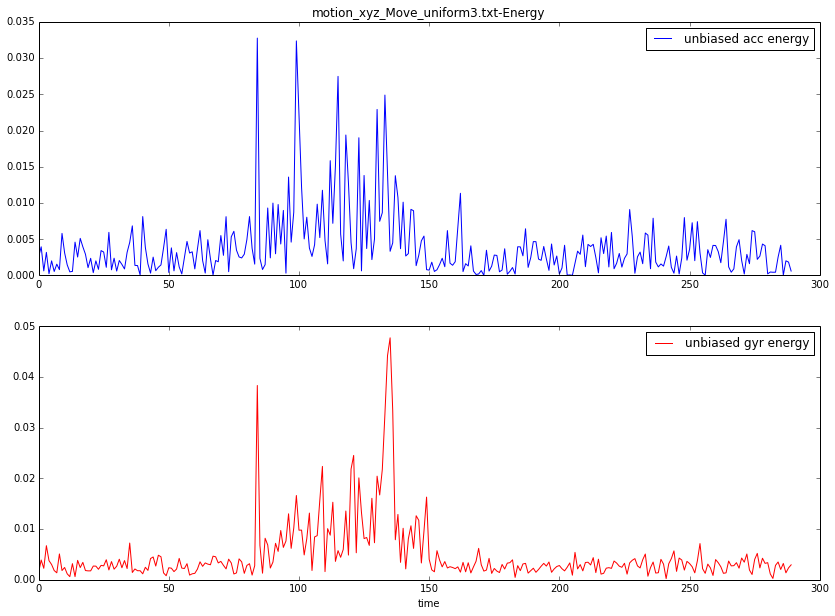

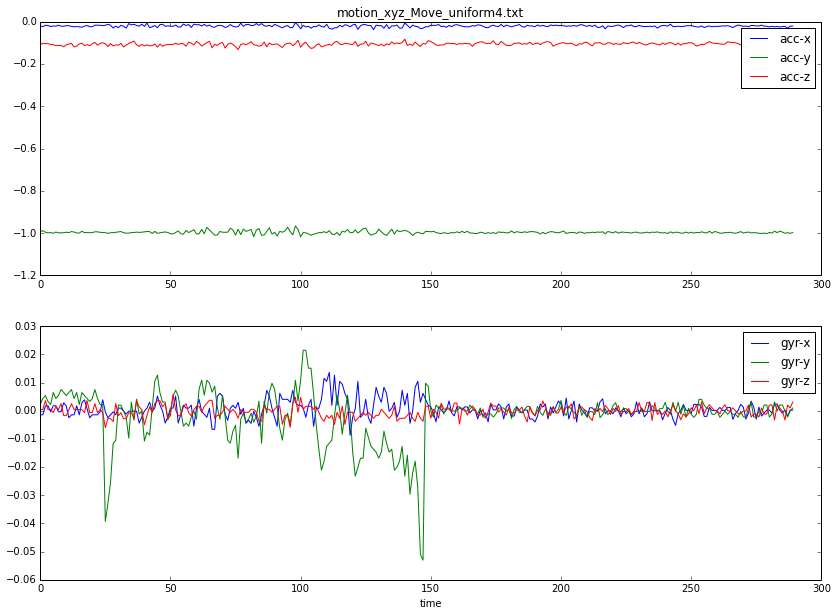

vibration:  3 entrophy gyr: 3.06185055657 entrophy acc: 3.07702039355
vibration:  0 entrophy gyr: 3.25402883992 entrophy acc: 3.073164996
vibration:  0 entrophy gyr: 3.28675566018 entrophy acc: 3.21520405773
vibration:  4 entrophy gyr: 3.29479253816 entrophy acc: 2.97821818244
vibration:  4 entrophy gyr: 3.28727869542 entrophy acc: 3.15263510231


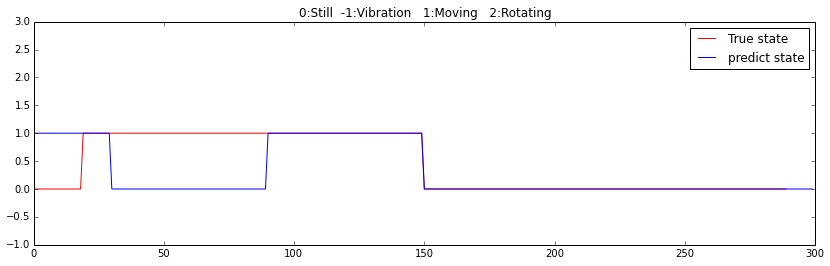

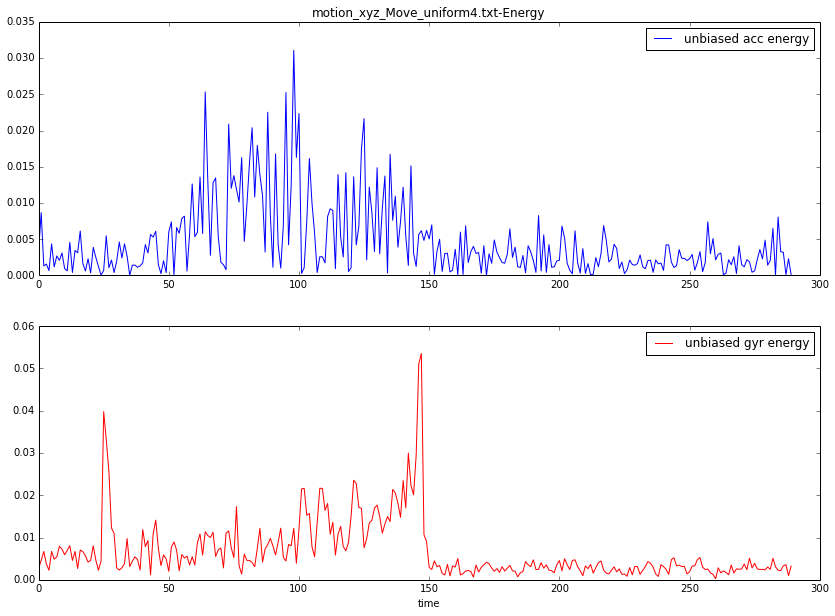

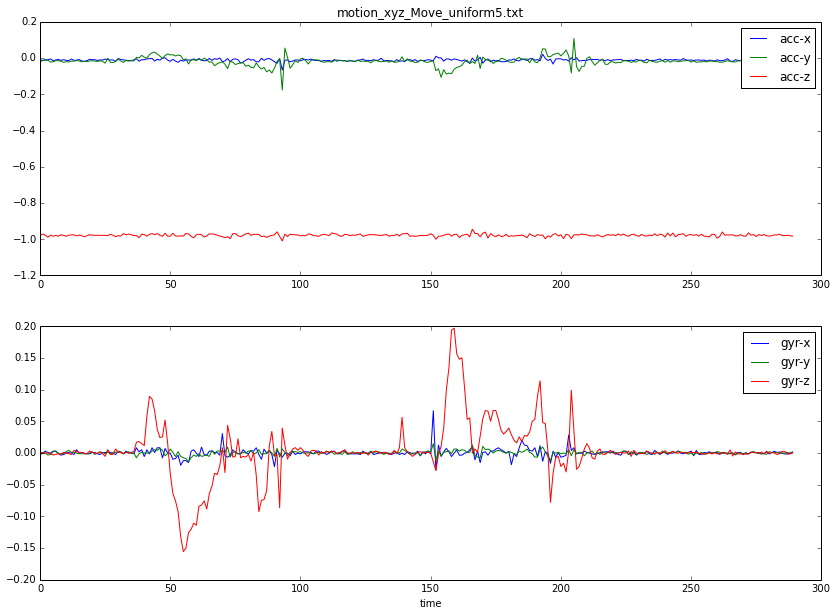

vibration:  7 entrophy gyr: 2.96041899663 entrophy acc: 3.17316755295
vibration:  6 entrophy gyr: 3.0980905423 entrophy acc: 3.21855205725
vibration:  1 entrophy gyr: 2.66177130389 entrophy acc: 2.86405387325
vibration:  1 entrophy gyr: 2.67745842808 entrophy acc: 3.03306322709
vibration:  9 entrophy gyr: 3.10431880327 entrophy acc: 3.09483387217
vibration:  3 entrophy gyr: 3.16255012477 entrophy acc: 3.01595868093
vibration:  0 entrophy gyr: 3.21977614725 entrophy acc: 3.17616541102


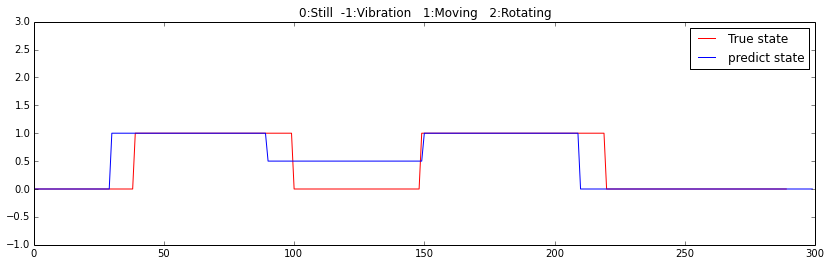

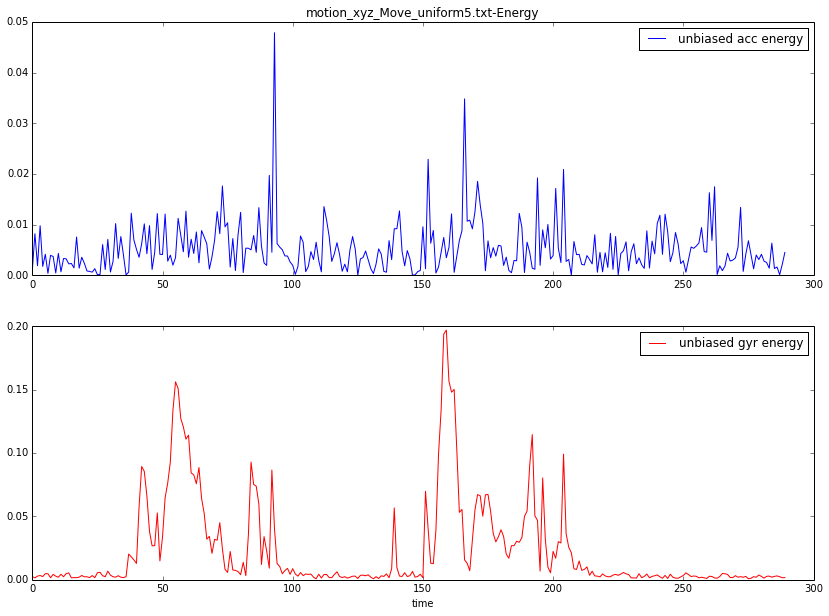

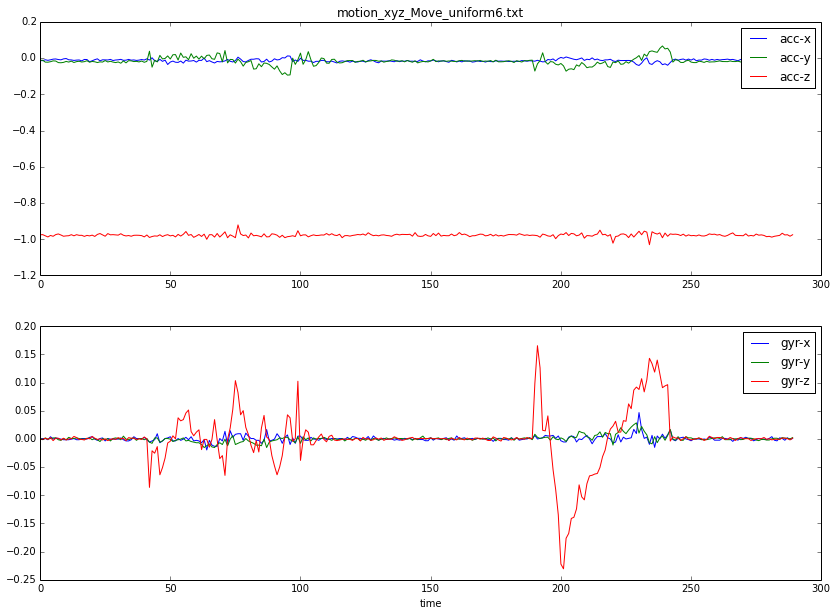

vibration:  3 entrophy gyr: 2.84723013813 entrophy acc: 2.95496068194
vibration:  4 entrophy gyr: 3.19692143007 entrophy acc: 3.03139170598
vibration:  2 entrophy gyr: 2.76712811789 entrophy acc: 2.96479339689
vibration:  8 entrophy gyr: 2.8705181717 entrophy acc: 3.0431055732
vibration:  12 entrophy gyr: 3.23605880903 entrophy acc: 2.9787100221
vibration:  2 entrophy gyr: 2.20318949014 entrophy acc: 3.21001625426


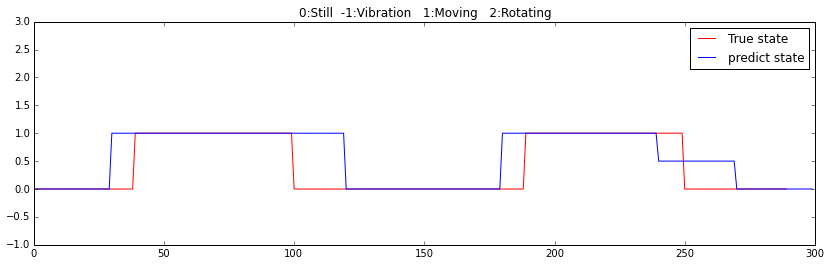

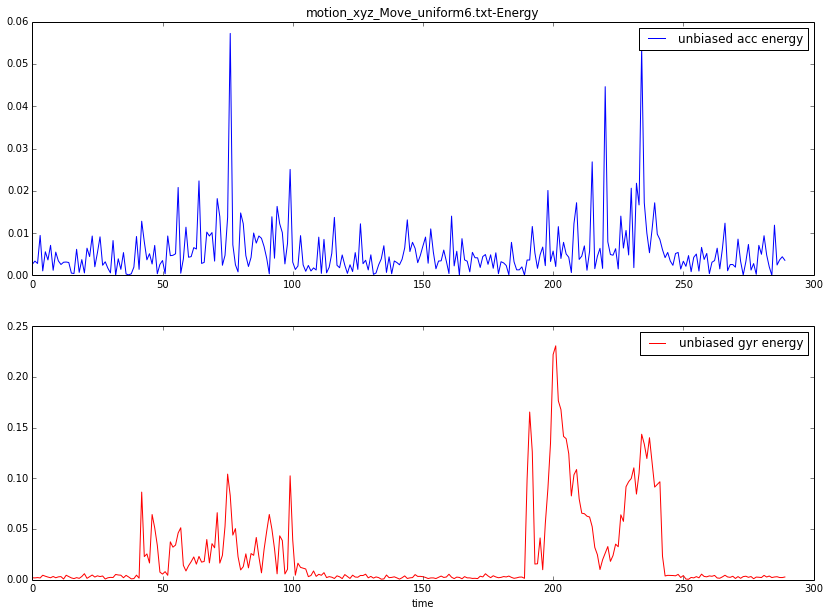

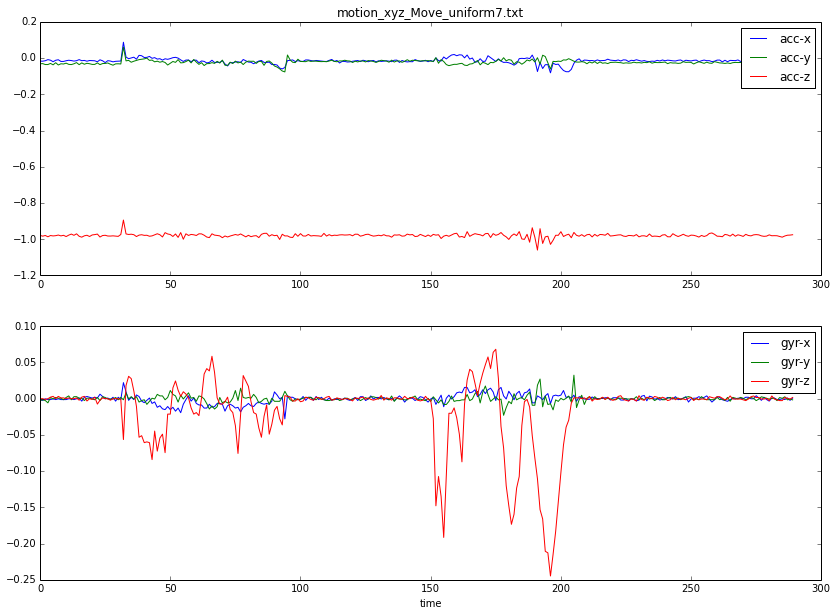

vibration:  11 entrophy gyr: 3.16039092729 entrophy acc: 2.88183423094
vibration:  5 entrophy gyr: 3.25242587455 entrophy acc: 3.13131300786
vibration:  3 entrophy gyr: 2.82415796854 entrophy acc: 2.98686117128
vibration:  6 entrophy gyr: 3.12584051958 entrophy acc: 3.14312528411
vibration:  9 entrophy gyr: 3.04521019665 entrophy acc: 2.88853378826


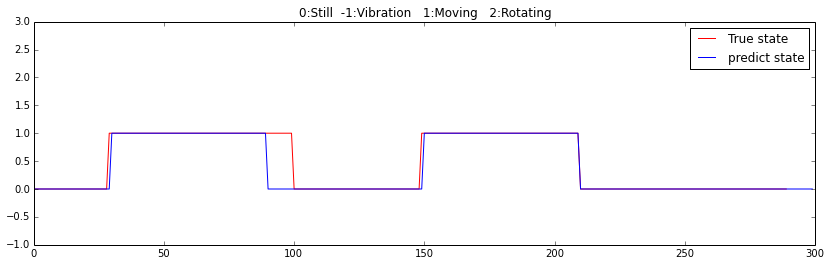

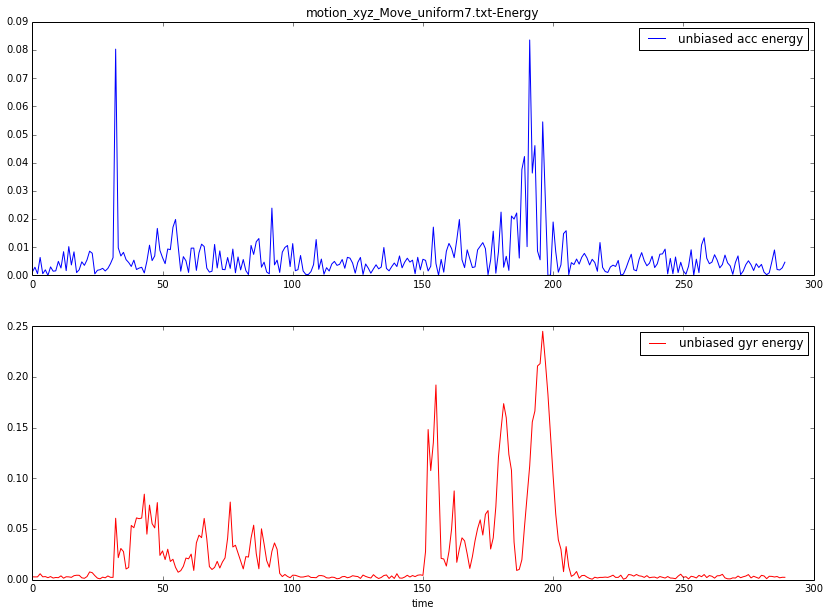

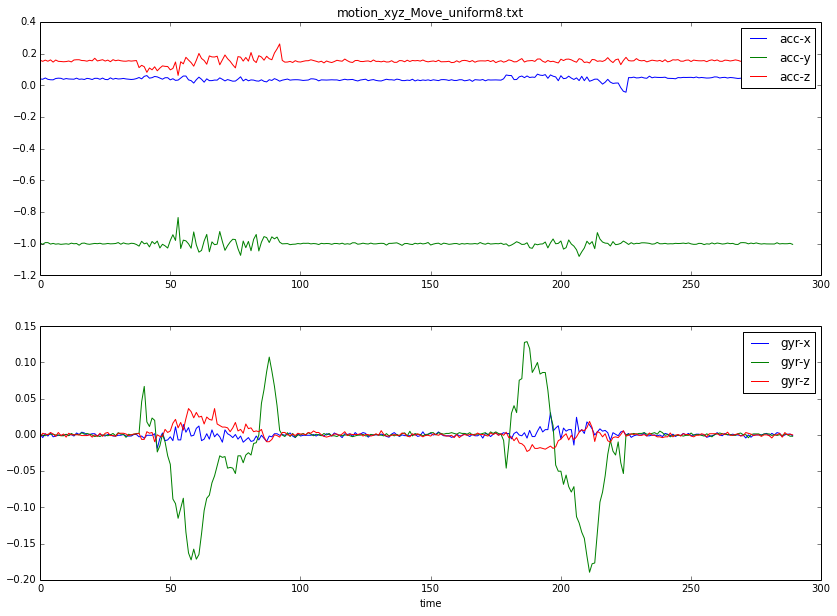

vibration:  8 entrophy gyr: 2.79833736296 entrophy acc: 2.69383633291
vibration:  5 entrophy gyr: 3.18711602799 entrophy acc: 3.17787013169
vibration:  2 entrophy gyr: 2.51487096343 entrophy acc: 2.77433505911
vibration:  0 entrophy gyr: 2.79283238809 entrophy acc: 3.1384689688
vibration:  12 entrophy gyr: 3.29435929536 entrophy acc: 2.97219486545
vibration:  5 entrophy gyr: 2.56843250237 entrophy acc: 2.77344419416


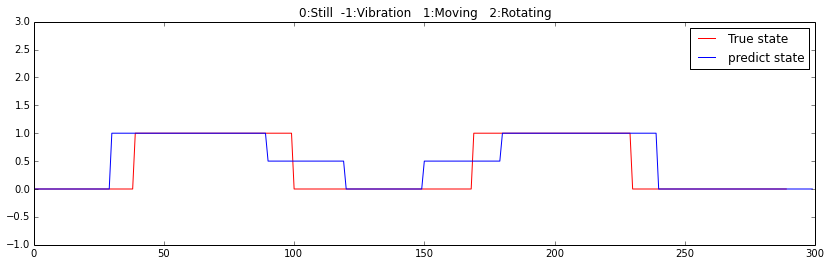

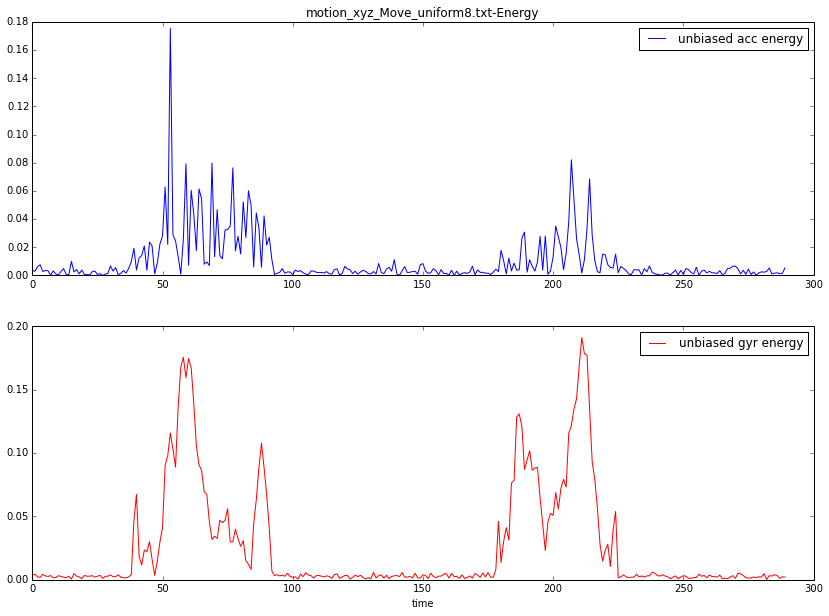

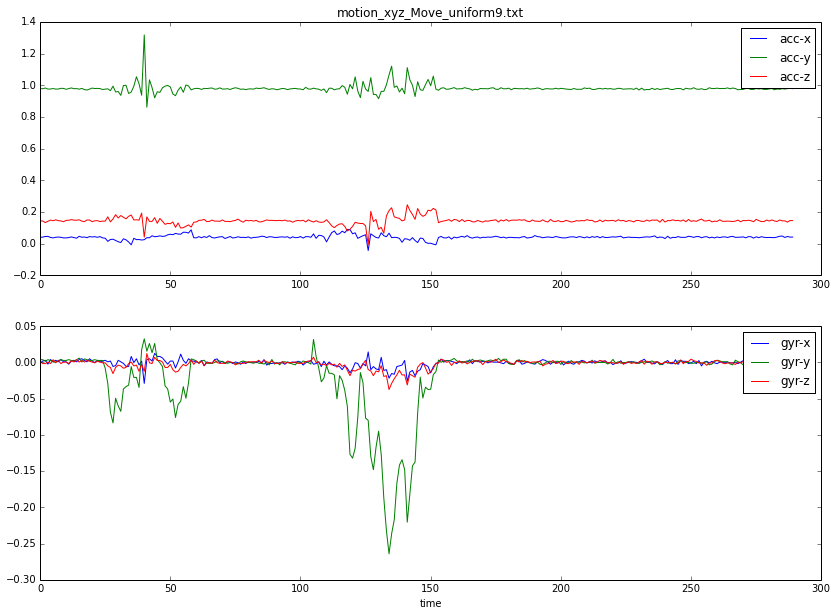

vibration:  3 entrophy gyr: 2.58813936841 entrophy acc: 2.87031750271
vibration:  5 entrophy gyr: 3.22015132545 entrophy acc: 2.7695151288
vibration:  1 entrophy gyr: 2.6493620885 entrophy acc: 2.77570895485
vibration:  13 entrophy gyr: 3.2458542403 entrophy acc: 3.05220490763
vibration:  1 entrophy gyr: 2.96240772658 entrophy acc: 2.39275100033


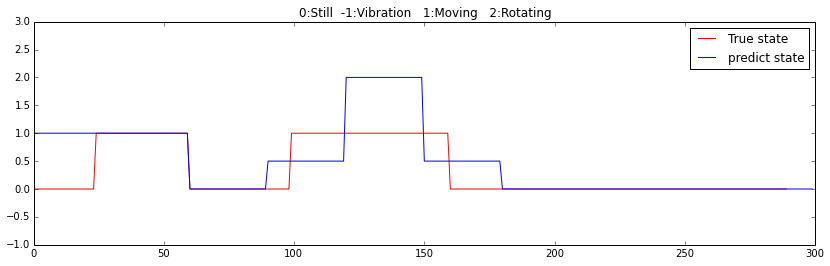

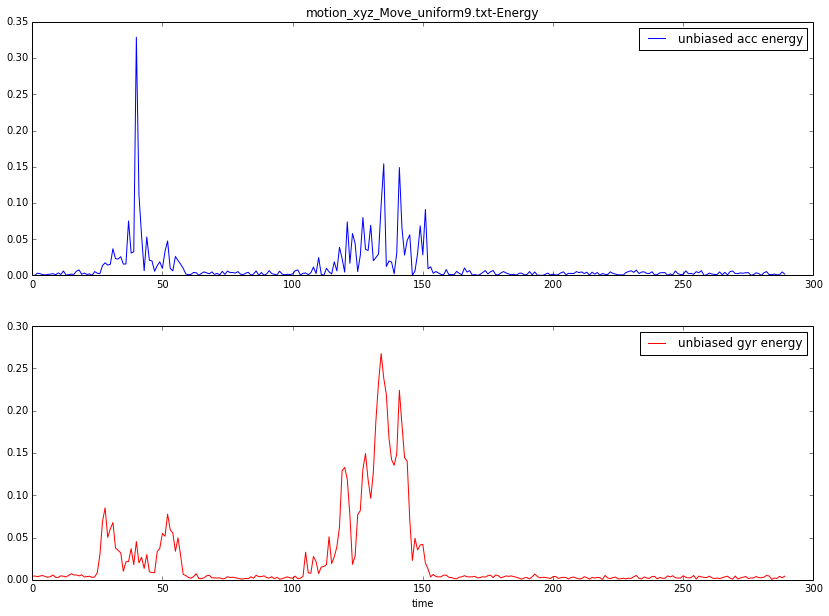

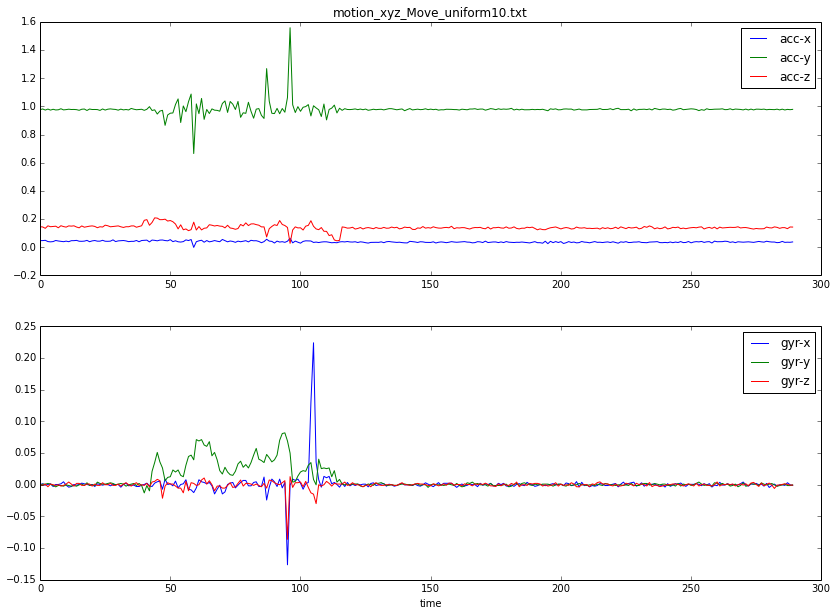

vibration:  5 entrophy gyr: 3.01563614394 entrophy acc: 2.44172078414
vibration:  9 entrophy gyr: 3.31895456157 entrophy acc: 2.91717221933
vibration:  2 entrophy gyr: 2.88649167373 entrophy acc: 2.27978617972


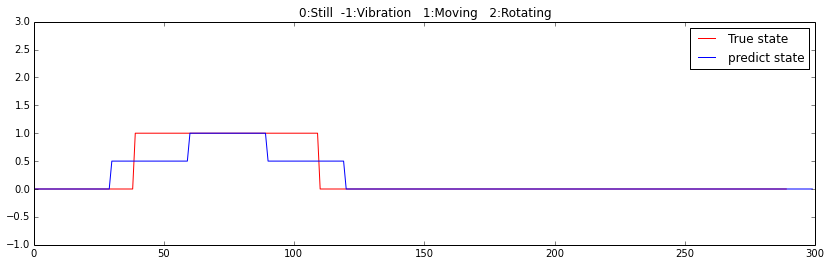

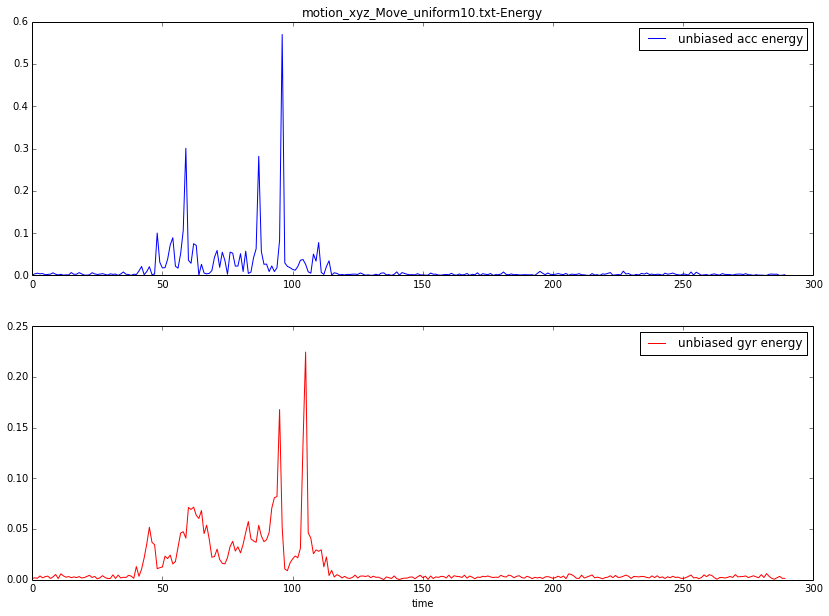

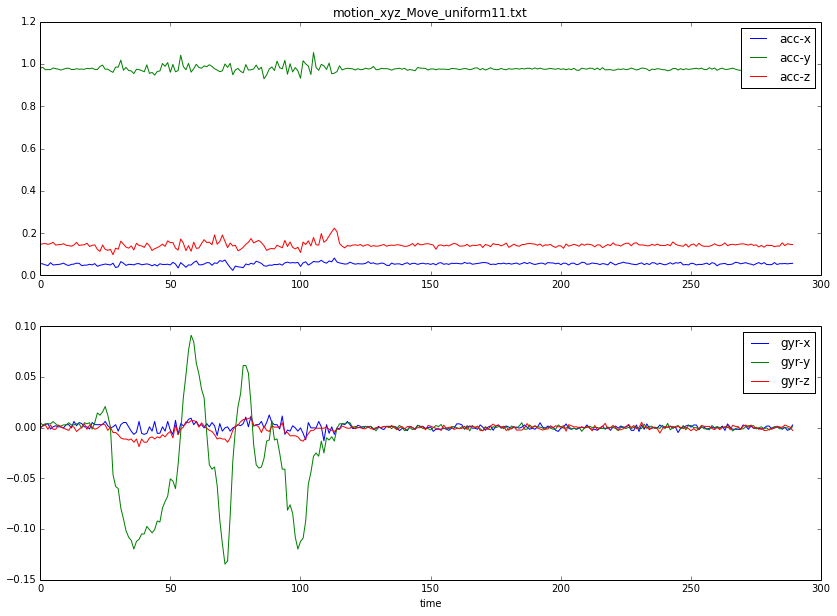

vibration:  1 entrophy gyr: 2.90080815509 entrophy acc: 3.02738219986
vibration:  20 entrophy gyr: 3.3324169944 entrophy acc: 3.14051648839
vibration:  5 entrophy gyr: 3.16417452421 entrophy acc: 3.03089644608
vibration:  9 entrophy gyr: 2.98479980075 entrophy acc: 2.95457862875


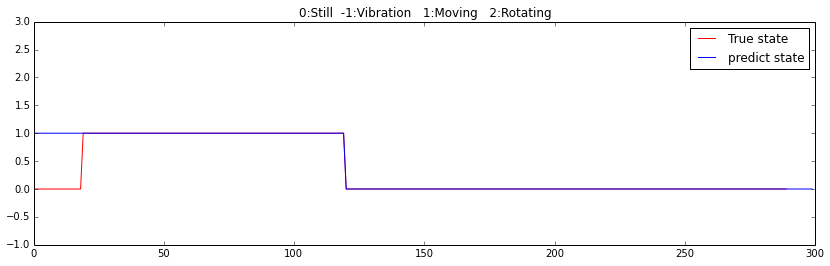

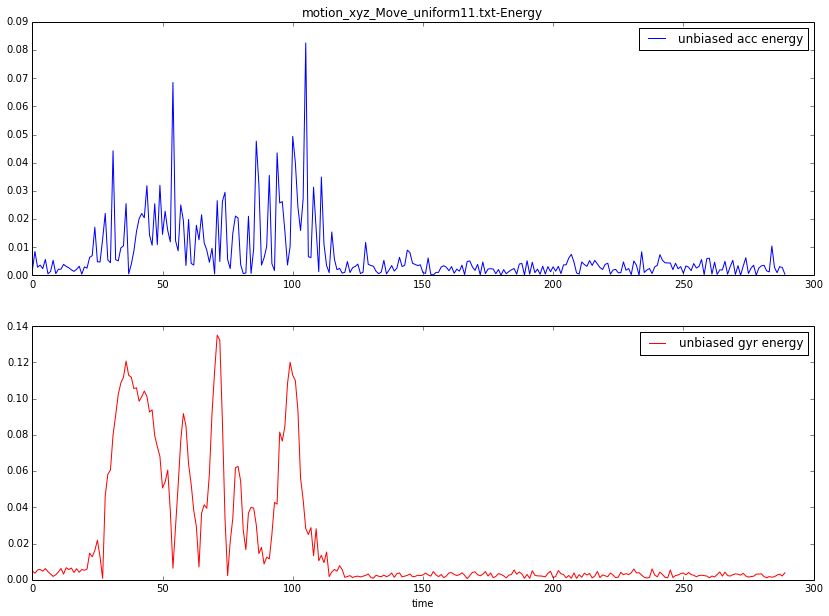

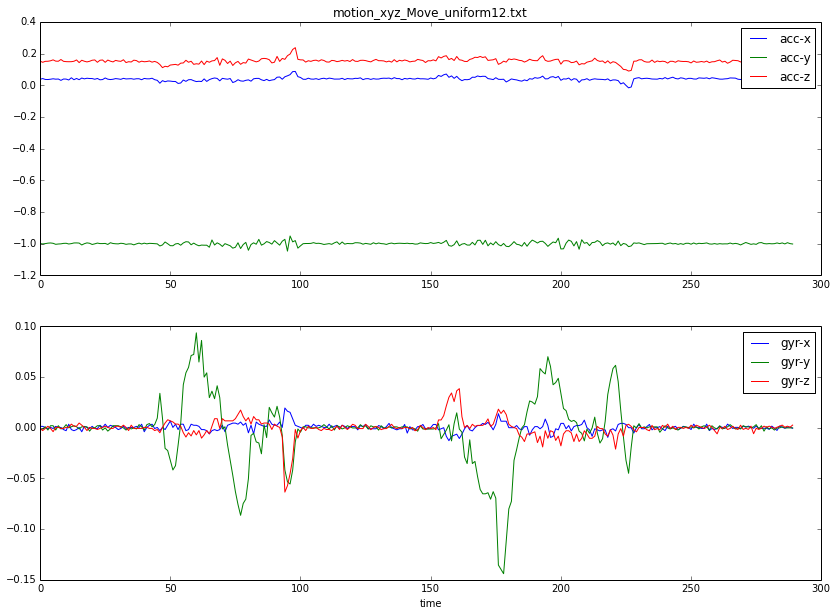

vibration:  4 entrophy gyr: 2.80295897956 entrophy acc: 3.07705793977
vibration:  8 entrophy gyr: 3.17333880254 entrophy acc: 3.05793184862
vibration:  4 entrophy gyr: 2.49688951207 entrophy acc: 2.68884812959
vibration:  3 entrophy gyr: 3.07969085348 entrophy acc: 3.15761592693
vibration:  8 entrophy gyr: 3.18927379685 entrophy acc: 3.1401682
vibration:  5 entrophy gyr: 2.90011749971 entrophy acc: 3.01714275382


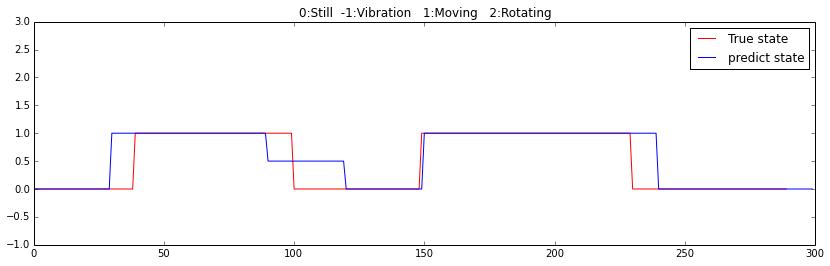

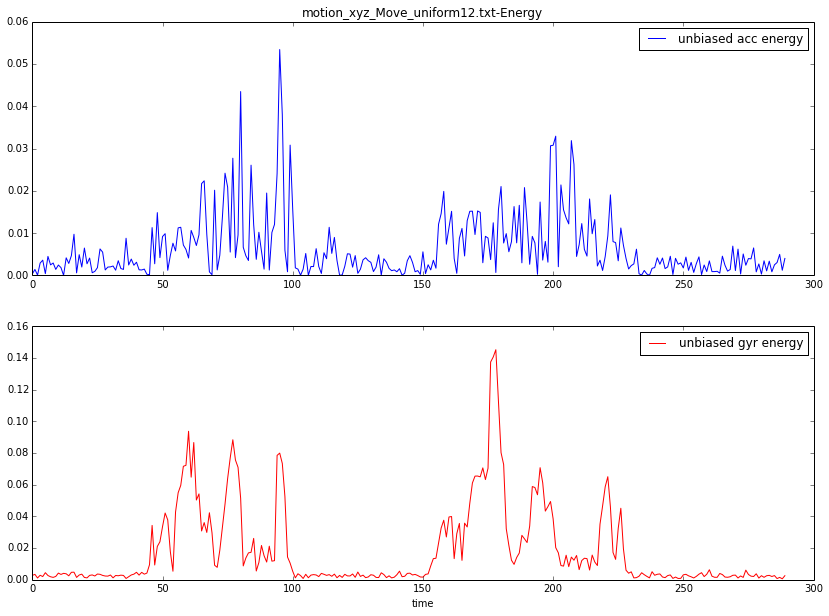

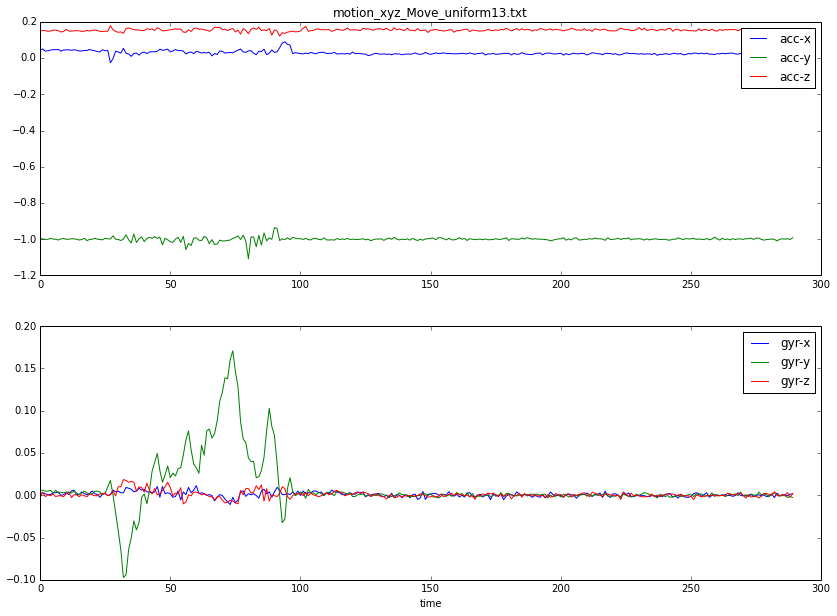

vibration:  0 entrophy gyr: 3.23970941463 entrophy acc: 3.03804458423
vibration:  6 entrophy gyr: 3.25116044766 entrophy acc: 3.00267679455
vibration:  10 entrophy gyr: 3.26288061479 entrophy acc: 2.93331857728
vibration:  2 entrophy gyr: 2.84771319169 entrophy acc: 2.52342819156


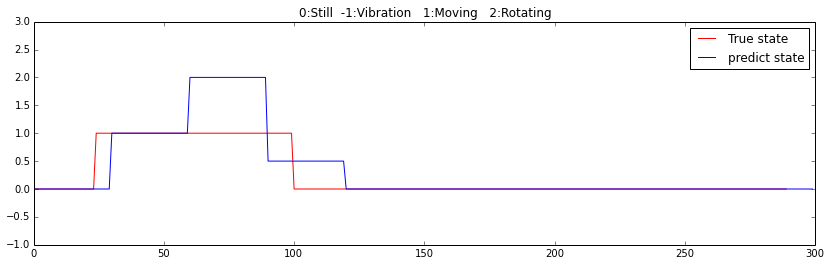

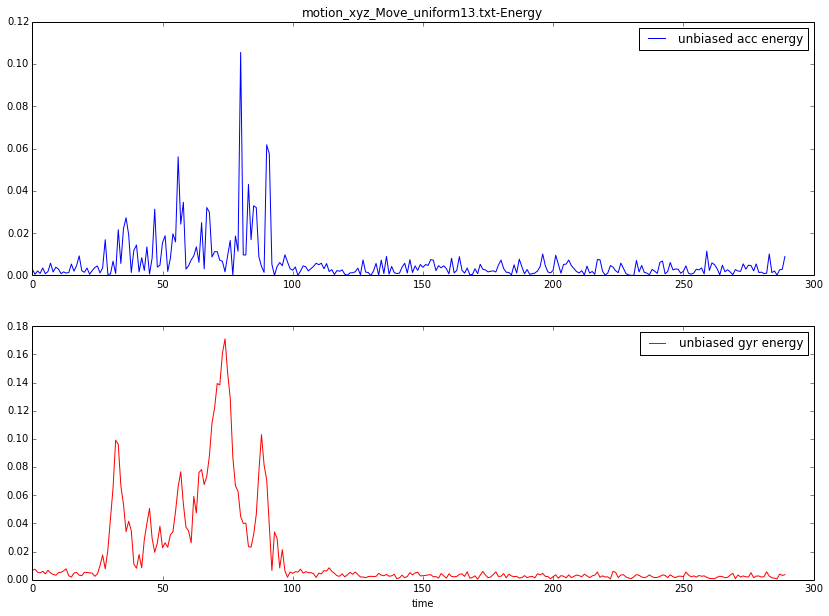

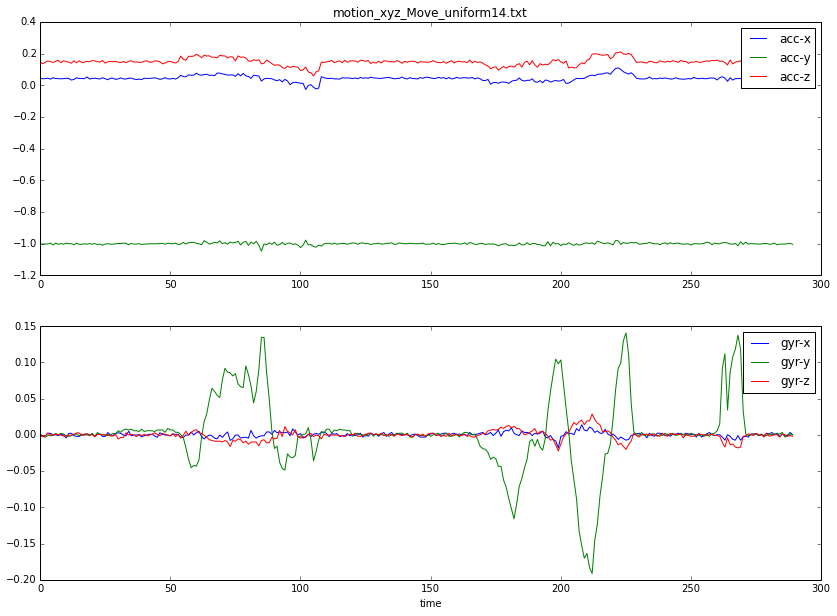

vibration:  2 entrophy gyr: 3.05520698842 entrophy acc: 3.11762988489
vibration:  7 entrophy gyr: 3.2814554338 entrophy acc: 3.040523667
vibration:  7 entrophy gyr: 3.06456966356 entrophy acc: 2.92311025951
vibration:  4 entrophy gyr: 2.74239190901 entrophy acc: 3.19127074657
vibration:  4 entrophy gyr: 3.13868790827 entrophy acc: 3.18484397377
vibration:  5 entrophy gyr: 2.7946355481 entrophy acc: 3.04271410606
vibration:  4 entrophy gyr: 2.38384998441 entrophy acc: 3.08729601456
vibration:  1 entrophy gyr: 2.41073617026 entrophy acc: 2.71036948828


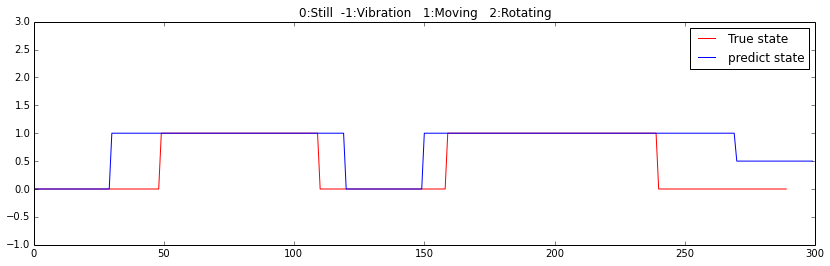

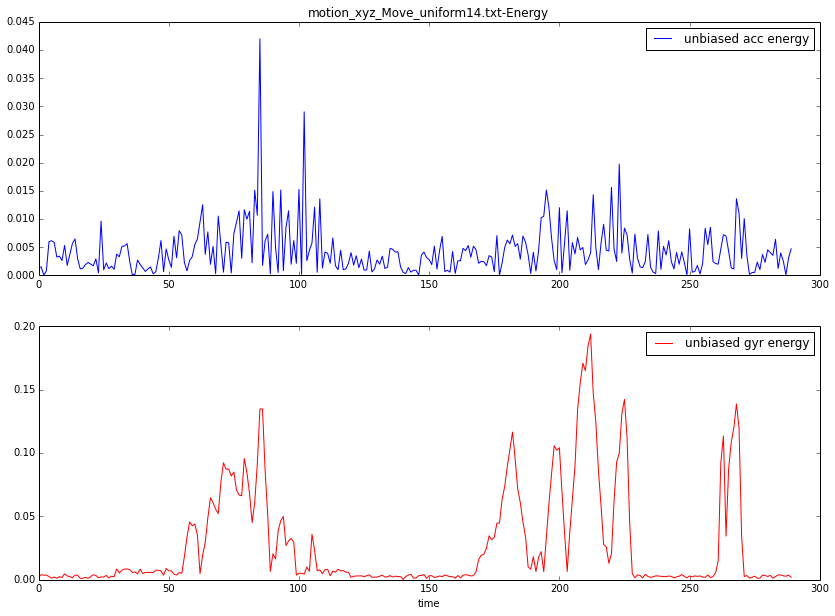

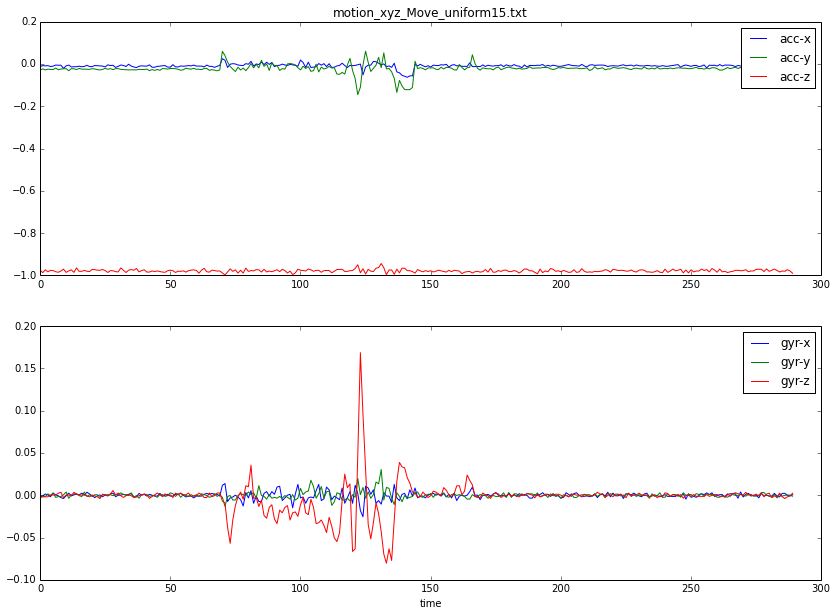

vibration:  4 entrophy gyr: 2.99813004149 entrophy acc: 3.08912653625
vibration:  5 entrophy gyr: 3.29353662208 entrophy acc: 3.10869415074
vibration:  3 entrophy gyr: 3.05353251562 entrophy acc: 3.10528569285
vibration:  3 entrophy gyr: 3.03060892872 entrophy acc: 3.15989293939


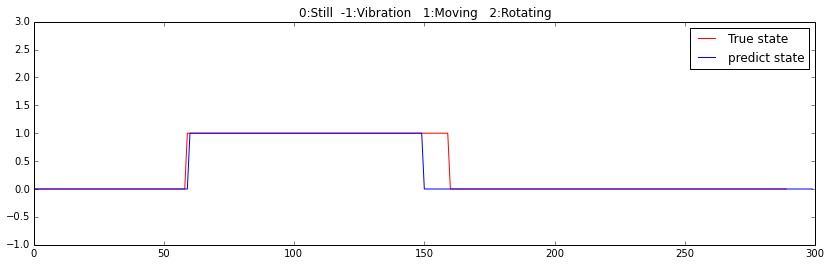

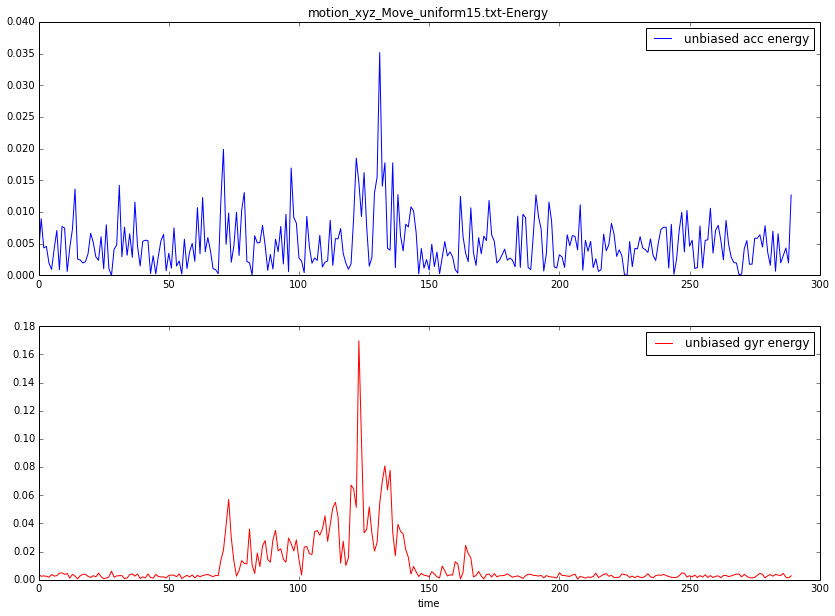

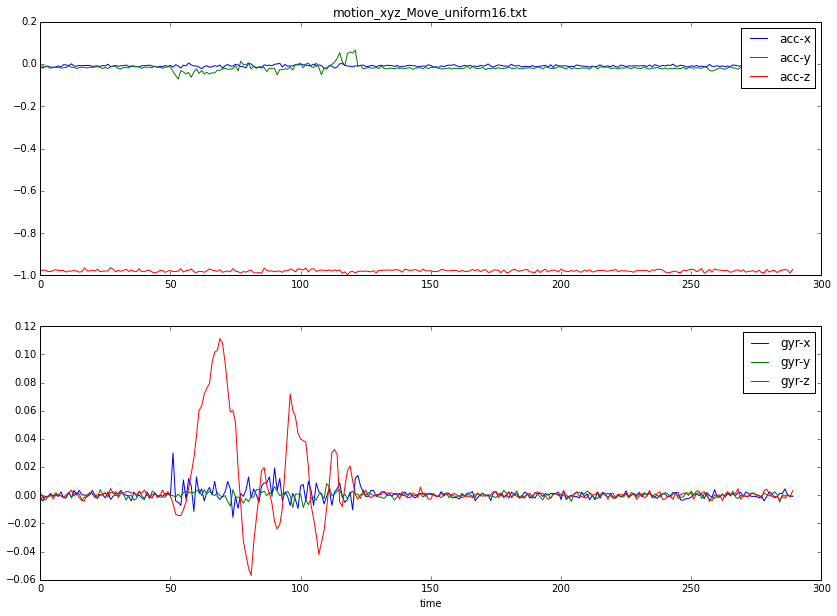

vibration:  1 entrophy gyr: 2.9619767012 entrophy acc: 3.14040616713
vibration:  15 entrophy gyr: 3.18828089774 entrophy acc: 3.17710164964
vibration:  8 entrophy gyr: 3.24726649318 entrophy acc: 3.10946899049
vibration:  0 entrophy gyr: 3.10928066792 entrophy acc: 3.0937185189


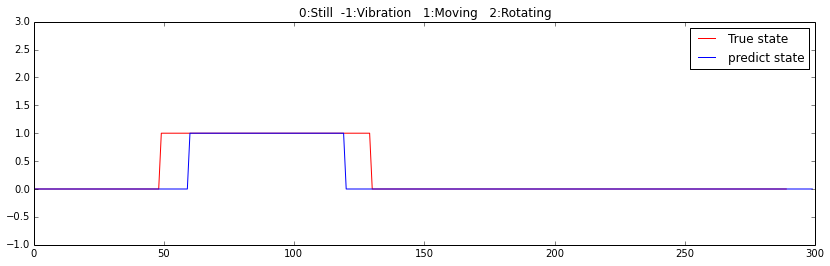

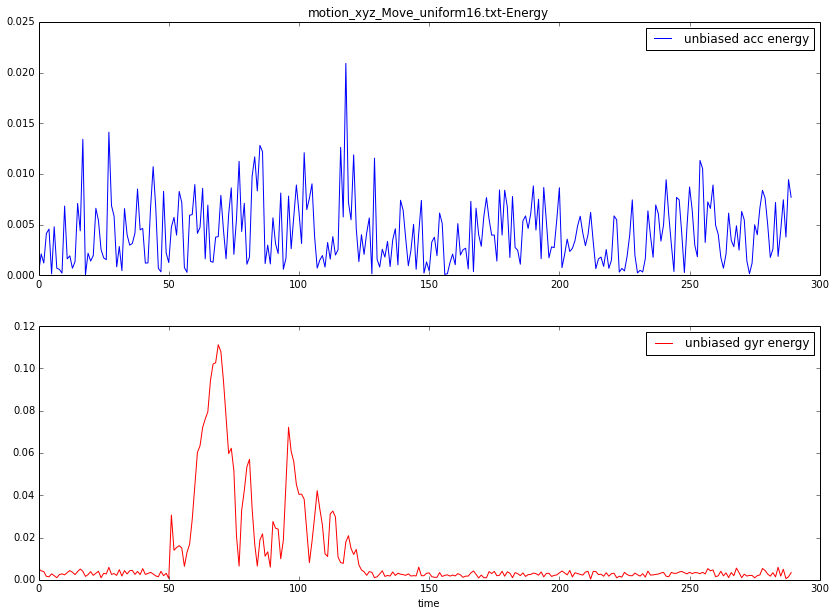

In [3046]:
if __name__=='__main__':
    dir = '../data/'
    
    for i in range(1, 17):
        fileName = 'motion_xyz_Move_uniform' + str(i) + '.txt'
    
        test(fileName)

#motion_xyz_Move_speedup: 沿着任意方向加速移动
* 加速移动也会引起gyr的变化，但是这种变化暂时<1，而且时间较短，比加速旋转的幅度小一个量级
* 这里同时有个point：就算加速移动时间变长以后（这种情况暂时受实验条件限制），gyr震荡时间变长，但是因为算法中考虑到了过零率，所以不会识别有旋转成分的存在

#motion_xRotate_uniform_anticlock: 绕着x轴逆时针匀速转动,速度较快

* acc-y,acc-z发生变化是因为绕x转动过程中重力加速在y,z上h会发生变化；斜率不变可能因为就是匀速
* 逆时针转动时，gyr-x的值为正值
* 从energy的图来看，gyr-energy在转动时的特征最为明显，而acc-energy跟匀速移动相似

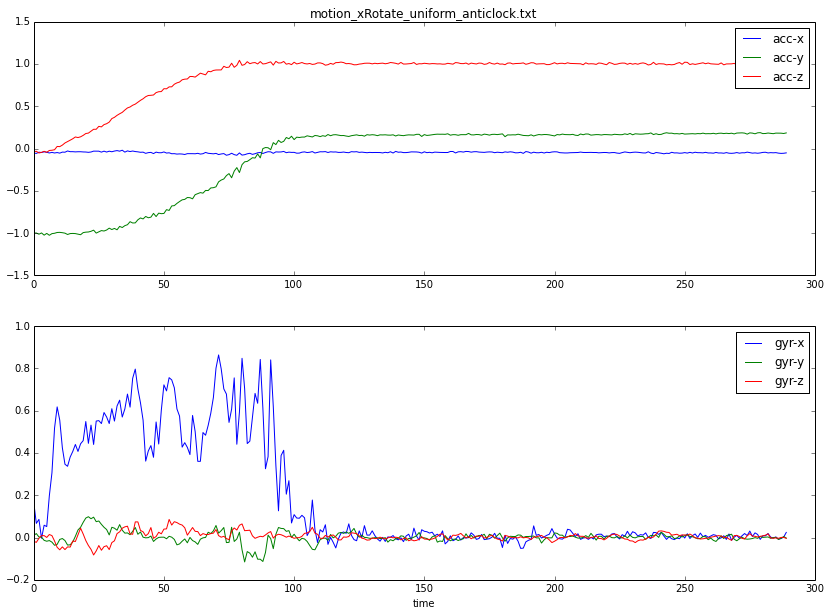

vibration:  21 entrophy gyr: 3.25562178216 entrophy acc: 3.15105394893
vibration:  13 entrophy gyr: 3.37891304216 entrophy acc: 3.14387245083
vibration:  25 entrophy gyr: 3.36904726292 entrophy acc: 2.95964580855
vibration:  3 entrophy gyr: 2.86215057413 entrophy acc: 3.17177404852
vibration:  4 entrophy gyr: 3.22780476488 entrophy acc: 3.25902968606
vibration:  5 entrophy gyr: 3.32511599244 entrophy acc: 3.31620324948
vibration:  3 entrophy gyr: 3.21271457836 entrophy acc: 3.266458805
vibration:  8 entrophy gyr: 3.2920377669 entrophy acc: 3.17980383459
vibration:  5 entrophy gyr: 3.29577574501 entrophy acc: 3.19796822278
vibration:  1 entrophy gyr: 2.81793191176 entrophy acc: 2.82725301879


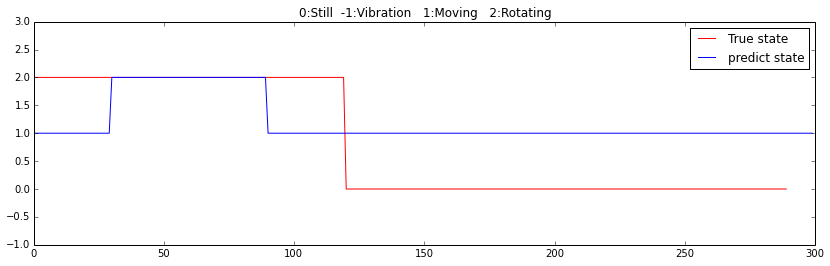

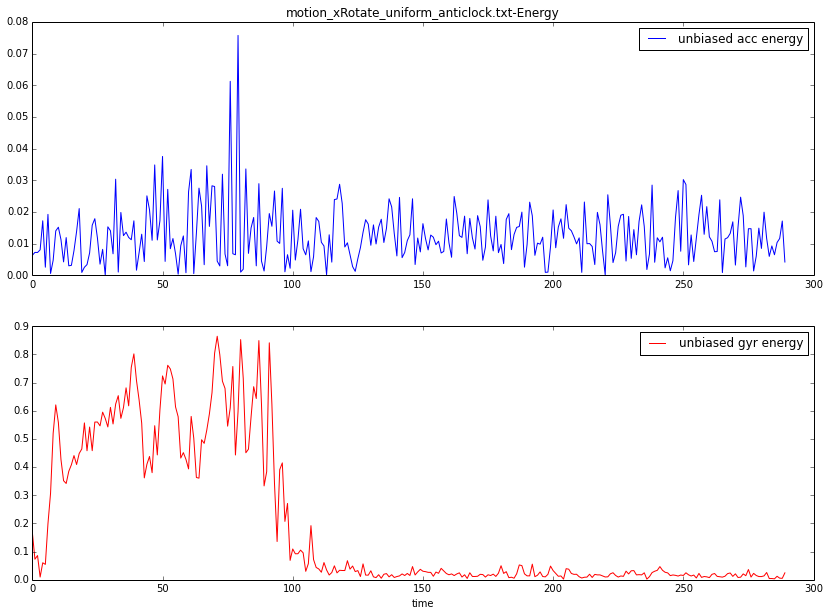

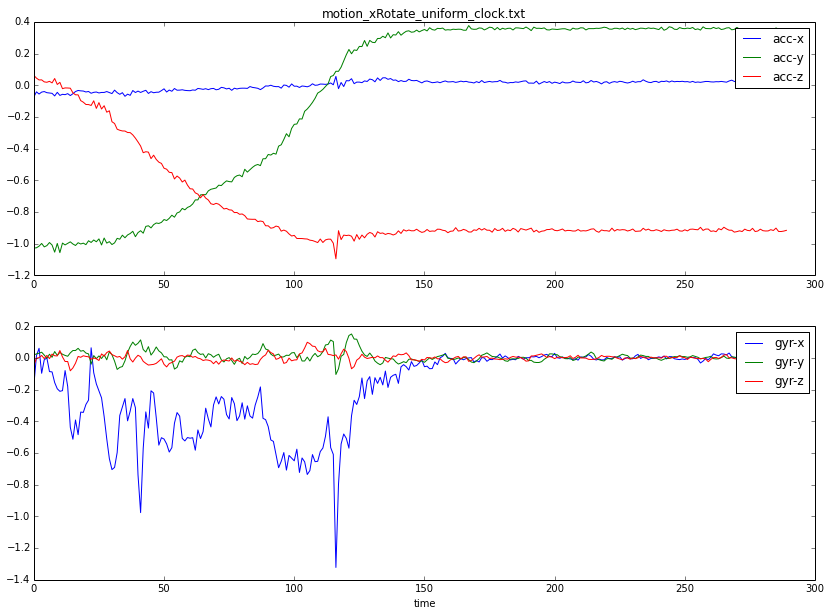

vibration:  6 entrophy gyr: 3.15200898491 entrophy acc: 3.14250611642
vibration:  6 entrophy gyr: 3.33986752818 entrophy acc: 3.24961003567
vibration:  10 entrophy gyr: 3.36789660272 entrophy acc: 3.35709319447
vibration:  3 entrophy gyr: 3.37488117602 entrophy acc: 3.300509603
vibration:  5 entrophy gyr: 3.12855243421 entrophy acc: 3.34383025517
vibration:  4 entrophy gyr: 3.24563694292 entrophy acc: 3.37401632883
vibration:  13 entrophy gyr: 3.28286035066 entrophy acc: 3.37904976274
vibration:  3 entrophy gyr: 3.23082386343 entrophy acc: 3.3869057653
vibration:  4 entrophy gyr: 3.29433121181 entrophy acc: 3.37911615466
vibration:  1 entrophy gyr: 2.91321228565 entrophy acc: 2.97812110668


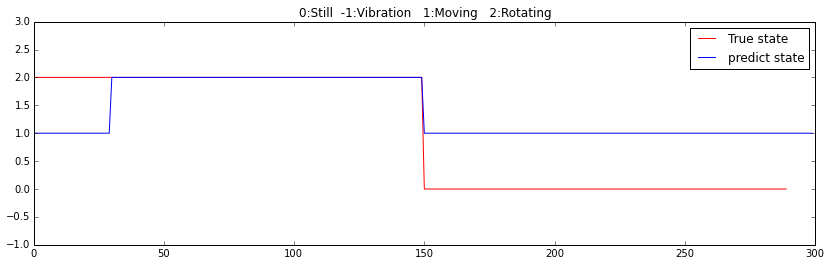

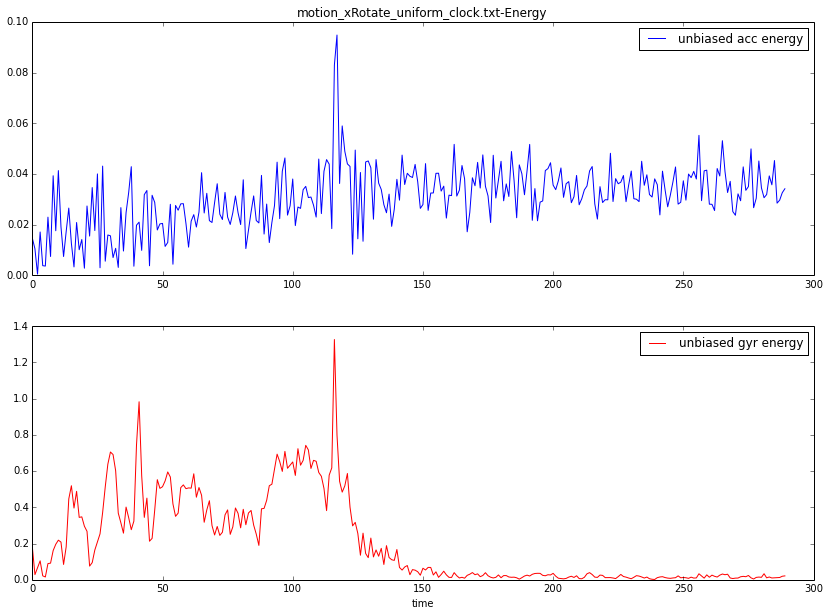

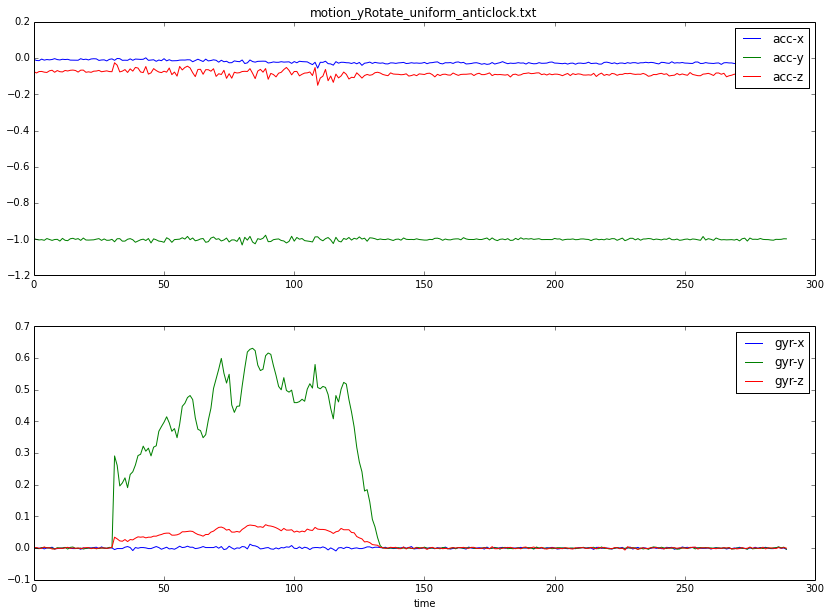

vibration:  21 entrophy gyr: 3.33966580491 entrophy acc: 3.09751467021
vibration:  29 entrophy gyr: 3.38628390015 entrophy acc: 3.09793179517
vibration:  29 entrophy gyr: 3.39711777464 entrophy acc: 3.1861275174
vibration:  6 entrophy gyr: 2.45963443715 entrophy acc: 3.06436909304


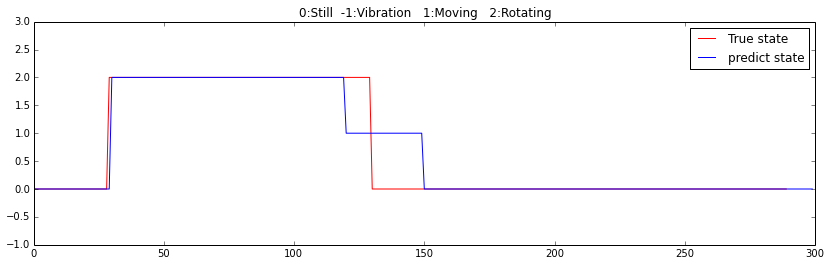

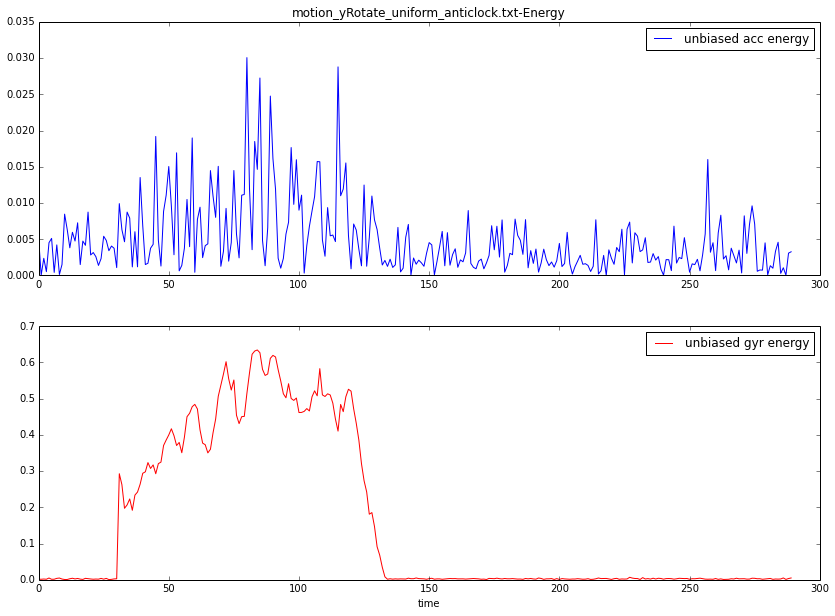

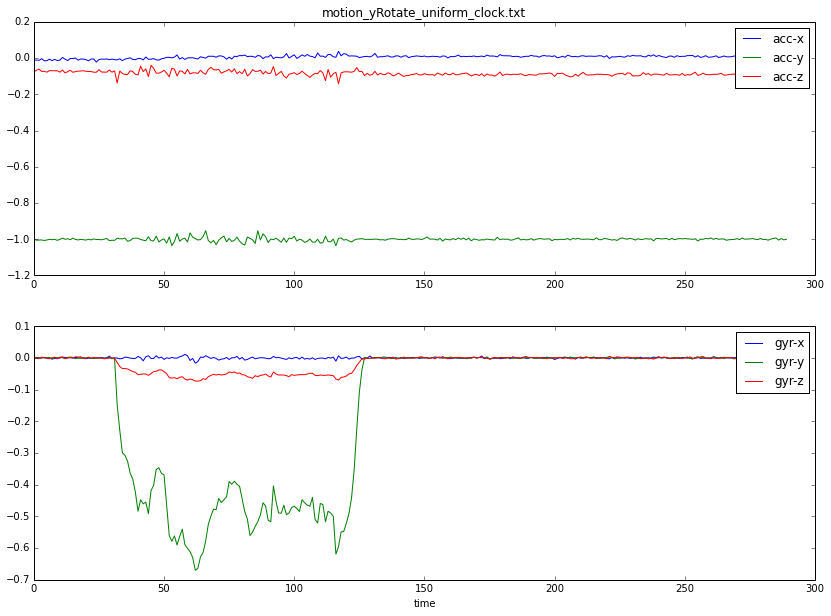

vibration:  25 entrophy gyr: 3.29748906174 entrophy acc: 3.0978792337
vibration:  29 entrophy gyr: 3.38837246668 entrophy acc: 3.05321983067
vibration:  29 entrophy gyr: 3.39739585609 entrophy acc: 3.04992943441
vibration:  4 entrophy gyr: 1.90331532894 entrophy acc: 2.97779849329


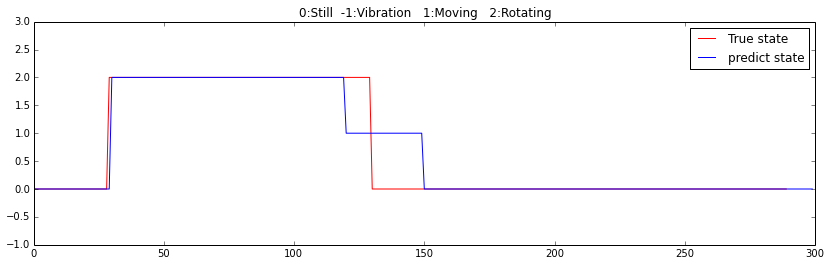

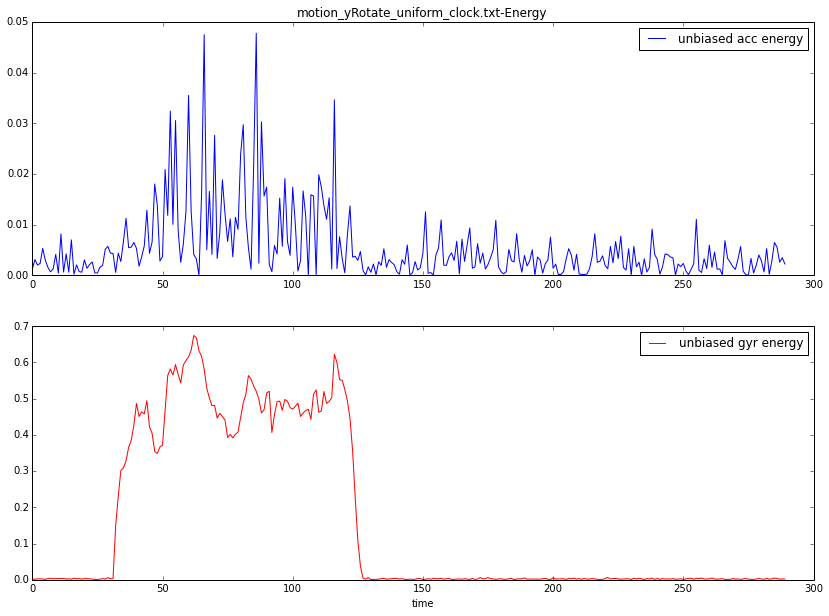

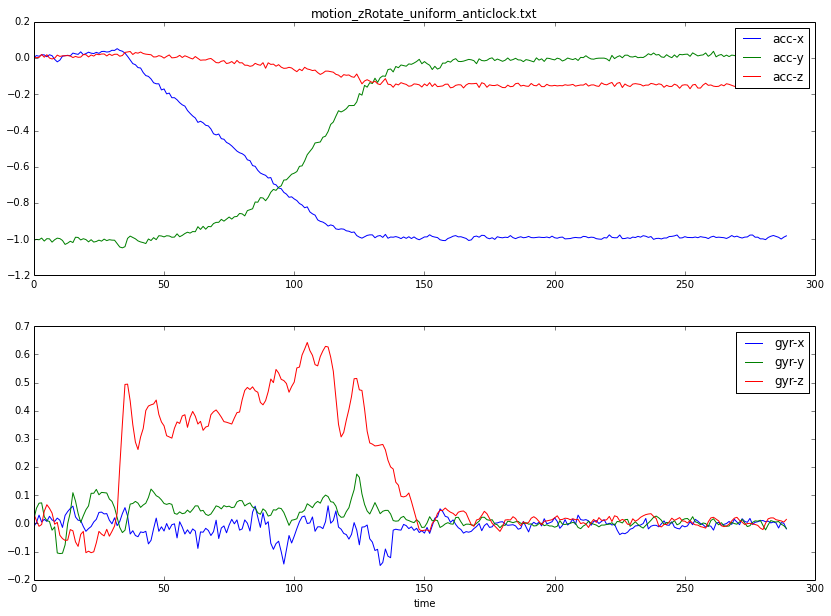

vibration:  10 entrophy gyr: 3.31470831065 entrophy acc: 3.05971879885
vibration:  25 entrophy gyr: 3.33038989832 entrophy acc: 2.97127217059
vibration:  29 entrophy gyr: 3.39494542088 entrophy acc: 3.15233253505
vibration:  28 entrophy gyr: 3.38717844145 entrophy acc: 3.22738715048
vibration:  16 entrophy gyr: 3.19677157827 entrophy acc: 3.09133976765
vibration:  8 entrophy gyr: 3.30703353659 entrophy acc: 3.12724796309
vibration:  4 entrophy gyr: 3.33790067229 entrophy acc: 3.00580378716
vibration:  8 entrophy gyr: 3.31395706111 entrophy acc: 3.10630242853
vibration:  2 entrophy gyr: 3.3341761929 entrophy acc: 3.12300200938
vibration:  6 entrophy gyr: 2.9172924728 entrophy acc: 2.68477470156


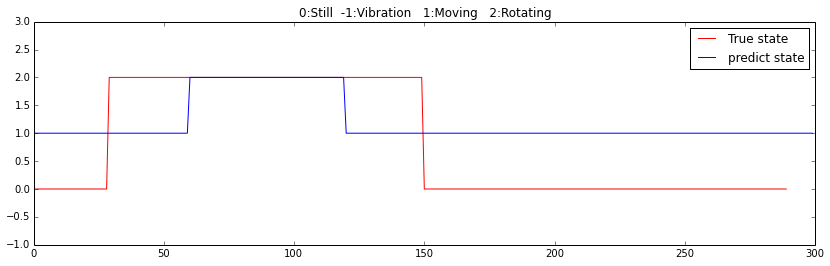

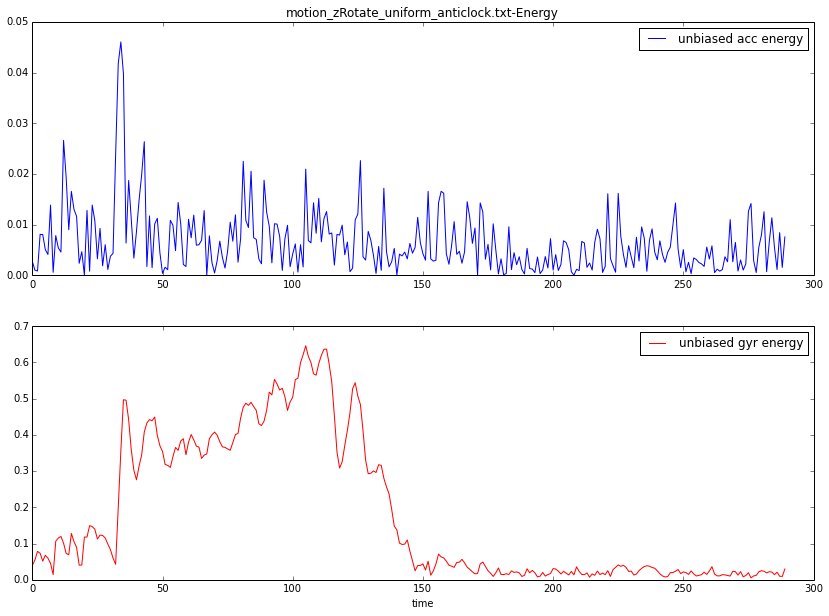

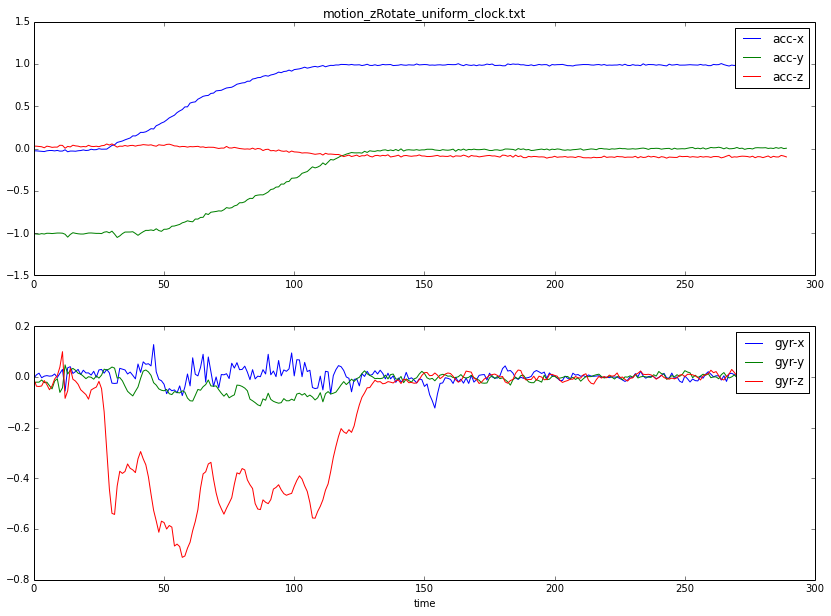

vibration:  1 entrophy gyr: 3.02404707062 entrophy acc: 2.96662544422
vibration:  16 entrophy gyr: 3.36582852846 entrophy acc: 3.15261449286
vibration:  29 entrophy gyr: 3.38687319707 entrophy acc: 3.14947582914
vibration:  26 entrophy gyr: 3.37645437577 entrophy acc: 3.23429387322
vibration:  6 entrophy gyr: 2.98978600475 entrophy acc: 3.31021766111
vibration:  4 entrophy gyr: 3.14764575864 entrophy acc: 3.2895992964
vibration:  6 entrophy gyr: 3.29867252385 entrophy acc: 3.20863955964
vibration:  2 entrophy gyr: 3.26234916394 entrophy acc: 3.30499792281
vibration:  4 entrophy gyr: 3.34919619895 entrophy acc: 3.30300879893
vibration:  5 entrophy gyr: 2.92353049824 entrophy acc: 2.94730424241


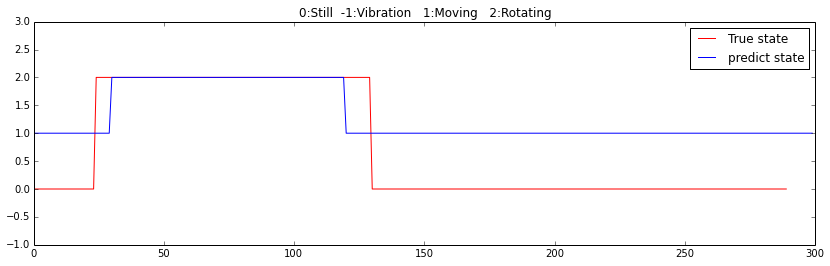

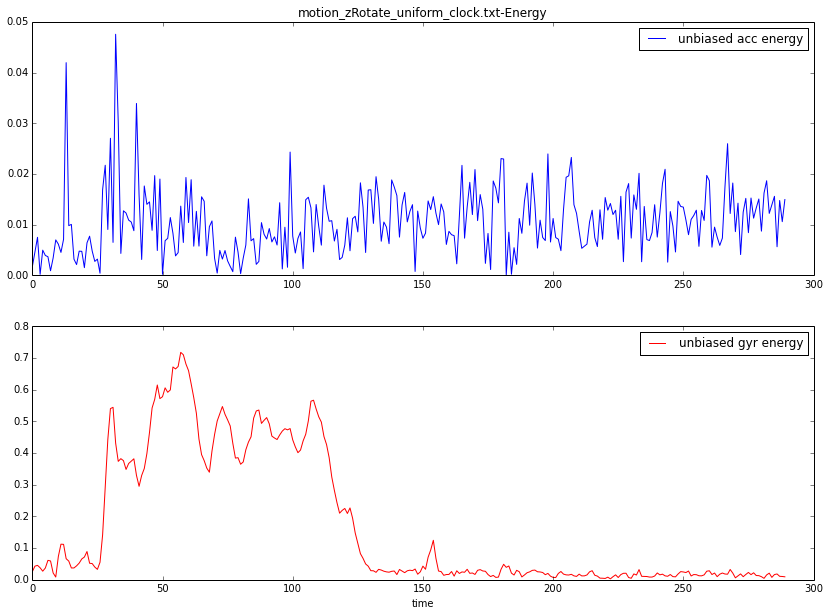

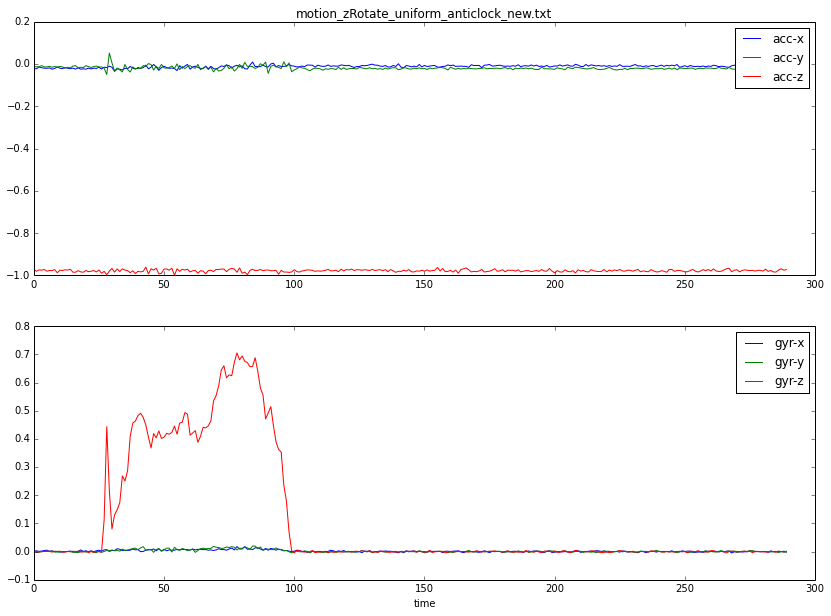

vibration:  2 entrophy gyr: 1.49866947792 entrophy acc: 3.012877151
vibration:  25 entrophy gyr: 3.34600591054 entrophy acc: 3.18416157303
vibration:  29 entrophy gyr: 3.38354405852 entrophy acc: 3.03815636807
vibration:  6 entrophy gyr: 2.23687490349 entrophy acc: 3.0251810482


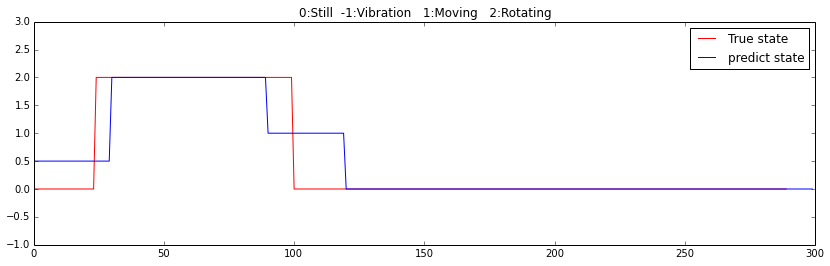

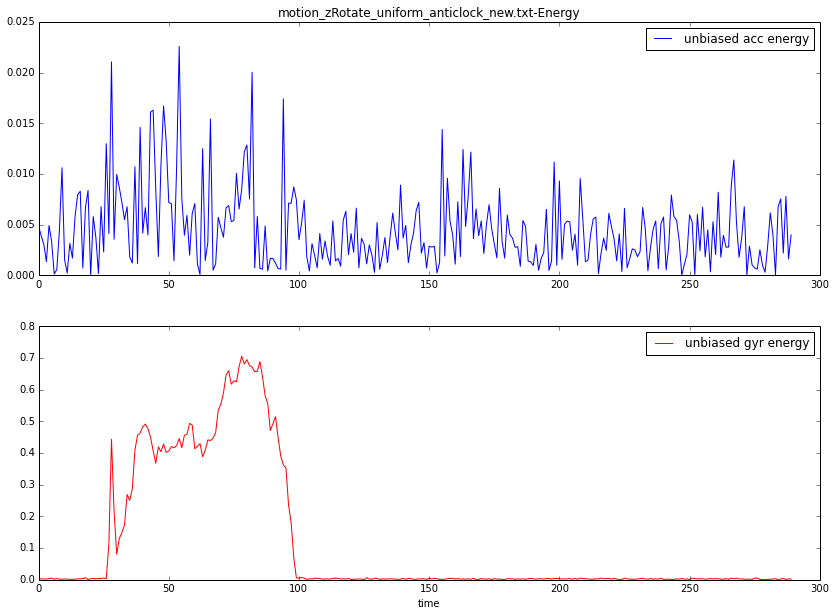

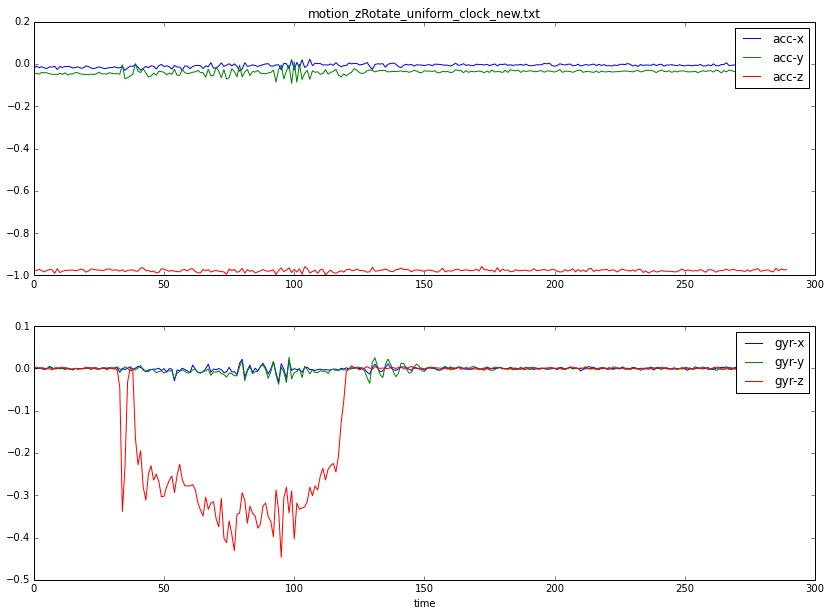

vibration:  20 entrophy gyr: 3.17965610078 entrophy acc: 3.08328901152
vibration:  29 entrophy gyr: 3.3950075624 entrophy acc: 3.17720314093
vibration:  27 entrophy gyr: 3.36429562804 entrophy acc: 3.14163627525
vibration:  2 entrophy gyr: 3.14680413544 entrophy acc: 3.06481889258


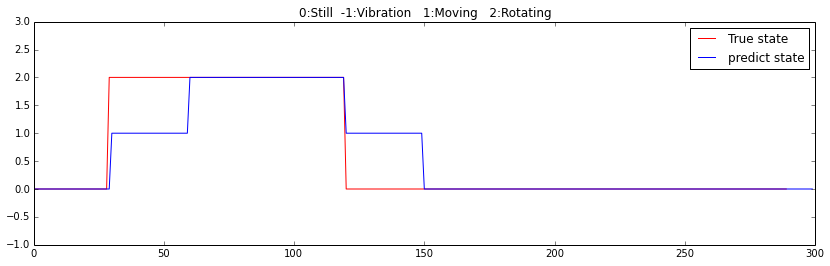

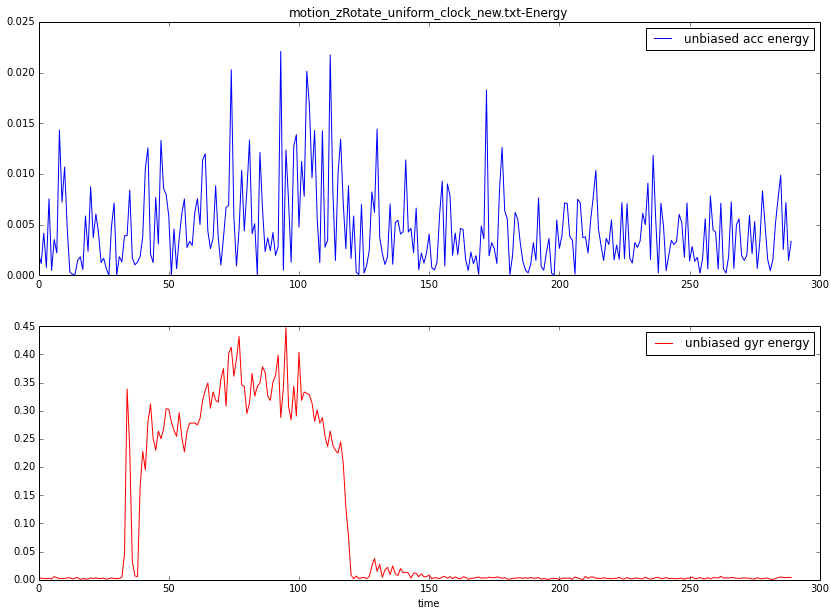

In [3048]:
if __name__=='__main__':
    dir = '../data/'
    rotateQuickUniform_fileNames = ['motion_xRotate_uniform_anticlock.txt', 'motion_xRotate_uniform_clock.txt',\
                 'motion_yRotate_uniform_anticlock.txt', 'motion_yRotate_uniform_clock.txt',\
                 'motion_zRotate_uniform_anticlock.txt', 'motion_zRotate_uniform_clock.txt',\
                 'motion_zRotate_uniform_anticlock_new.txt', 'motion_zRotate_uniform_clock_new.txt']
    
    for fileName in rotateQuickUniform_fileNames:
        
        test(fileName)
    
    
    

#multiStates.txt  匀速旋转，低速
* 旋转的时候，mag-energy会有很大的变化，而在移动时，似乎没有这种现象发生

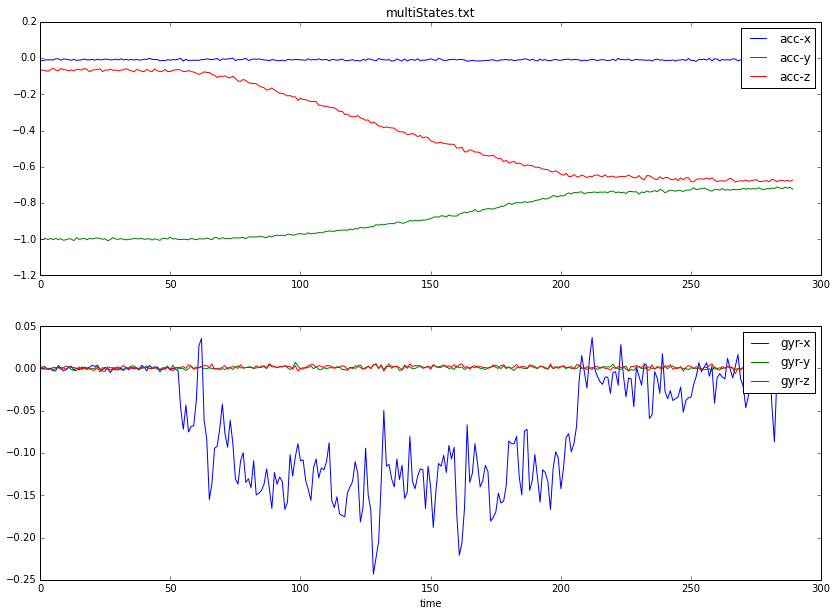

vibration:  5 entrophy gyr: 2.3766843334 entrophy acc: 3.17682112302
vibration:  15 entrophy gyr: 3.3233957956 entrophy acc: 3.15013900264
vibration:  29 entrophy gyr: 3.38370061076 entrophy acc: 3.21906193658
vibration:  6 entrophy gyr: 3.36157690901 entrophy acc: 3.27346271839
vibration:  11 entrophy gyr: 3.36792345853 entrophy acc: 3.30816483563
vibration:  15 entrophy gyr: 3.30066167313 entrophy acc: 3.34387714491
vibration:  2 entrophy gyr: 3.11848254966 entrophy acc: 3.30867987402
vibration:  6 entrophy gyr: 3.15232961721 entrophy acc: 3.29284975181
vibration:  2 entrophy gyr: 2.59024977241 entrophy acc: 2.96535782761


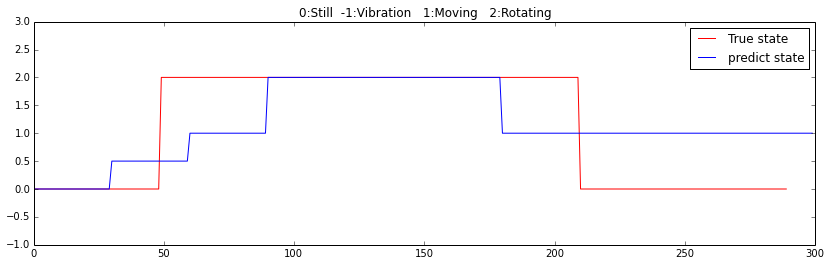

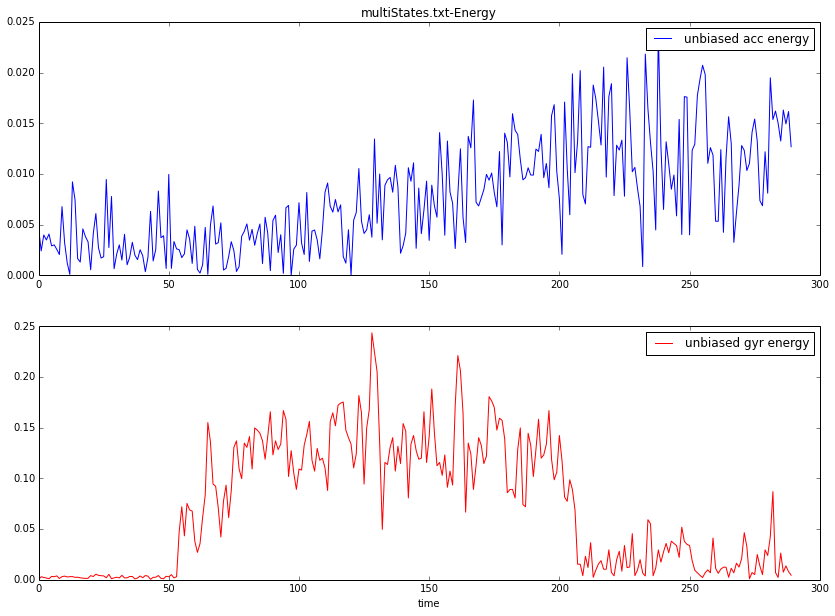

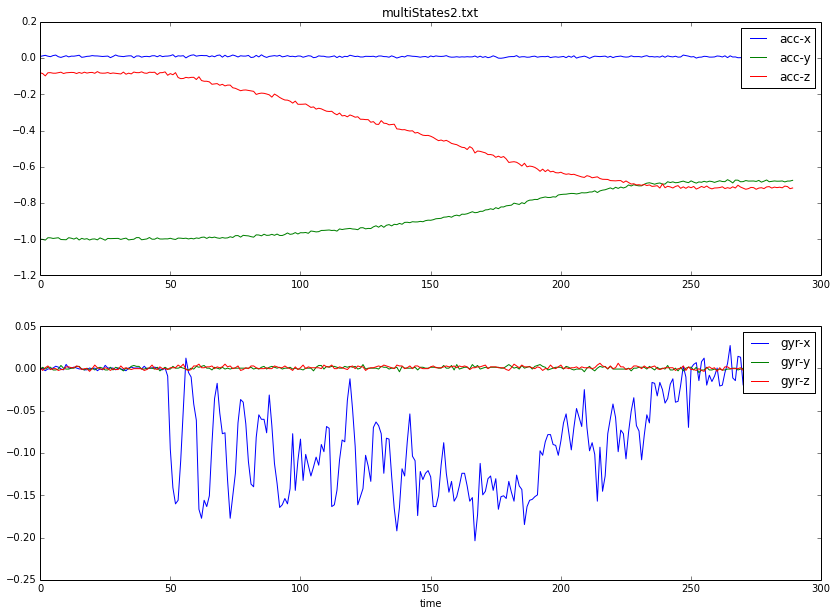

vibration:  5 entrophy gyr: 2.27229388631 entrophy acc: 3.14920659461
vibration:  7 entrophy gyr: 3.26672874408 entrophy acc: 3.21392299728
vibration:  12 entrophy gyr: 3.33687059974 entrophy acc: 3.20043492964
vibration:  7 entrophy gyr: 3.34877904893 entrophy acc: 3.16162229484
vibration:  23 entrophy gyr: 3.38994768493 entrophy acc: 3.30326777276
vibration:  14 entrophy gyr: 3.32413867201 entrophy acc: 3.33095449406
vibration:  8 entrophy gyr: 3.27735415993 entrophy acc: 3.35516545105
vibration:  2 entrophy gyr: 3.12732547729 entrophy acc: 3.32349872057
vibration:  0 entrophy gyr: 2.78243919207 entrophy acc: 2.96282650609


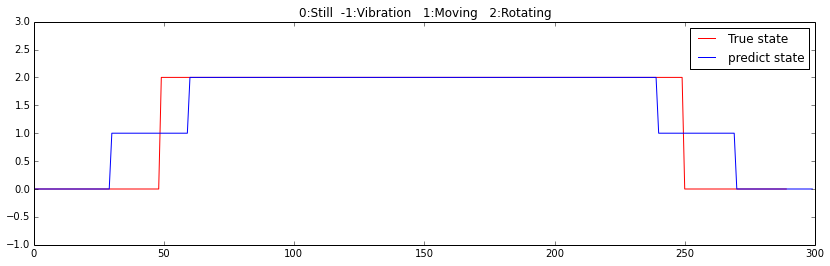

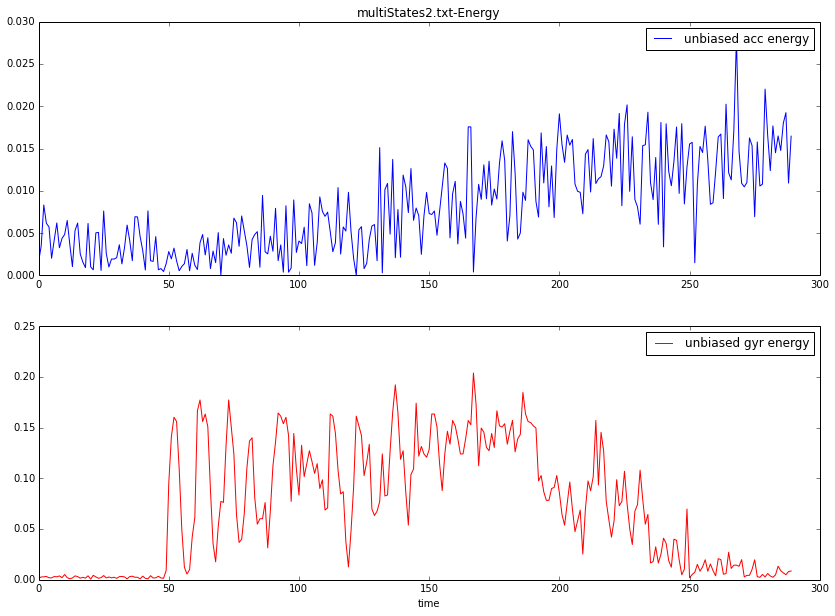

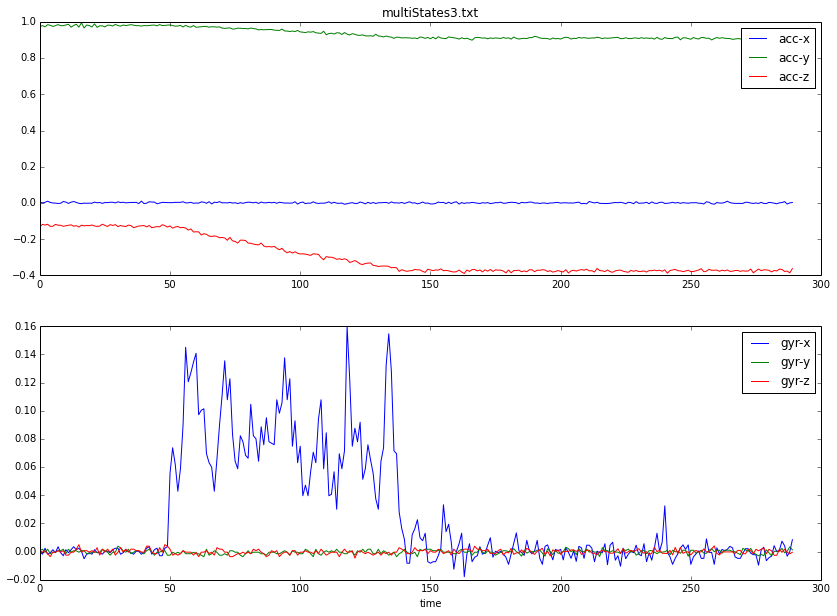

vibration:  4 entrophy gyr: 2.50041438201 entrophy acc: 3.134678474
vibration:  6 entrophy gyr: 3.36674230453 entrophy acc: 3.22428149422
vibration:  7 entrophy gyr: 3.32295710553 entrophy acc: 3.09365534978
vibration:  4 entrophy gyr: 3.10121471317 entrophy acc: 3.1866781855
vibration:  1 entrophy gyr: 3.08081877451 entrophy acc: 3.13030040203
vibration:  0 entrophy gyr: 3.23102032739 entrophy acc: 3.21676318649
vibration:  0 entrophy gyr: 3.25066348331 entrophy acc: 3.04670868337
vibration:  1 entrophy gyr: 3.02941152305 entrophy acc: 3.17696609104
vibration:  0 entrophy gyr: 2.88741755925 entrophy acc: 2.87575539009


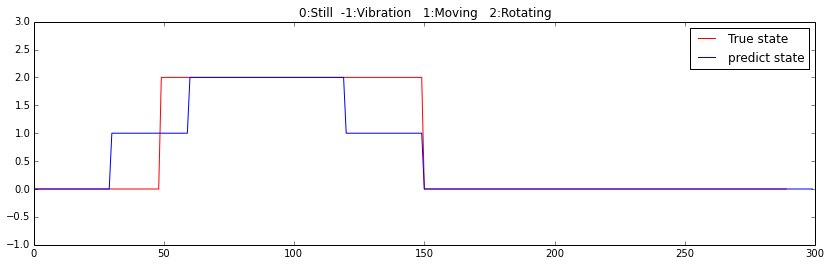

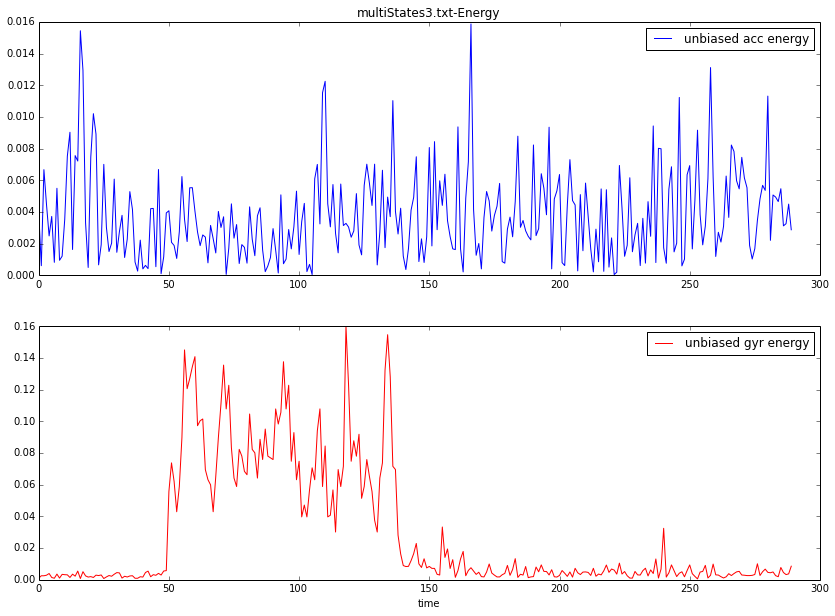

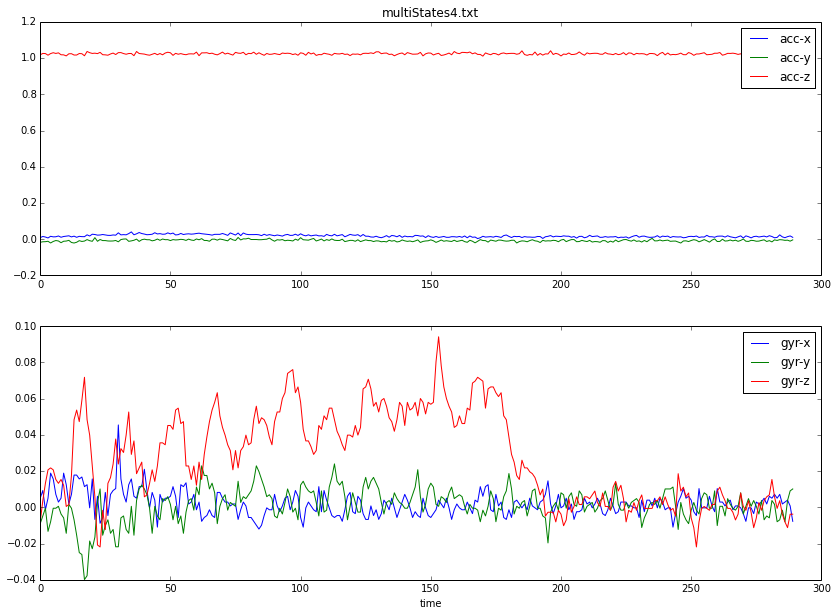

vibration:  7 entrophy gyr: 3.21397377405 entrophy acc: 3.19138367361
vibration:  11 entrophy gyr: 3.32636110474 entrophy acc: 3.11375351863
vibration:  11 entrophy gyr: 3.35825163404 entrophy acc: 3.189958711
vibration:  13 entrophy gyr: 3.36884996675 entrophy acc: 3.13750509276
vibration:  29 entrophy gyr: 3.39037179191 entrophy acc: 3.08452953133
vibration:  16 entrophy gyr: 3.38481315735 entrophy acc: 3.14747712478
vibration:  3 entrophy gyr: 3.22930875098 entrophy acc: 3.0134598531
vibration:  0 entrophy gyr: 3.28764170931 entrophy acc: 3.11061499612
vibration:  2 entrophy gyr: 3.27351912321 entrophy acc: 3.23778230319
vibration:  0 entrophy gyr: 2.91692431765 entrophy acc: 2.80956691474


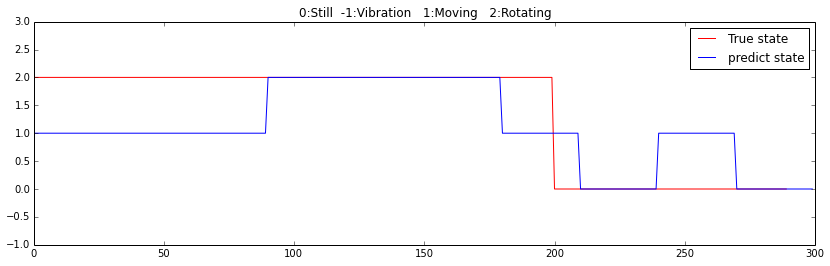

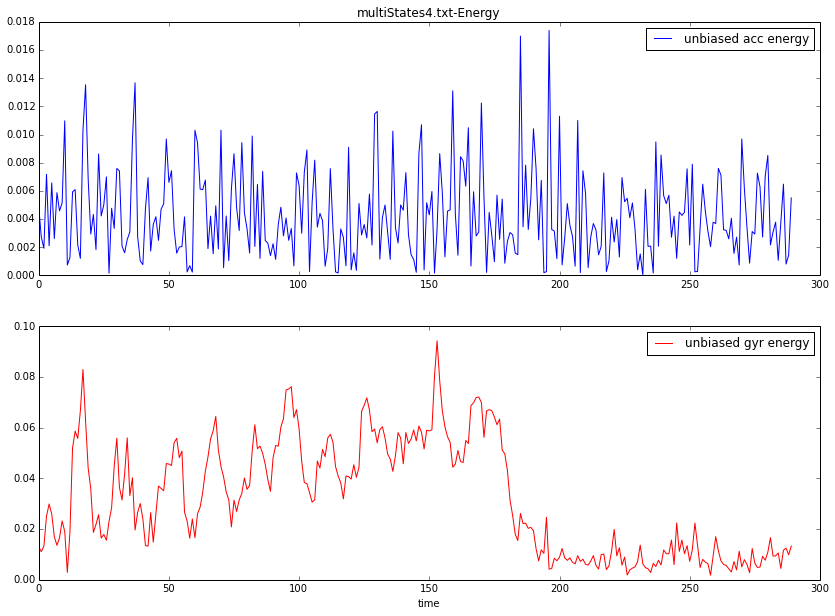

In [3049]:
if __name__=='__main__':
    dir = '../data/'
    rotateSlowUniform_fileNames = ['multiStates.txt', 'multiStates2.txt', 'multiStates3.txt', 'multiStates4.txt']
    for fileName in rotateSlowUniform_fileNames:
        #fileName = dir + fileName
        test(fileName)
    

#motion_rotate_move 移动和旋转都有
* 低匀速移动->低匀速旋转

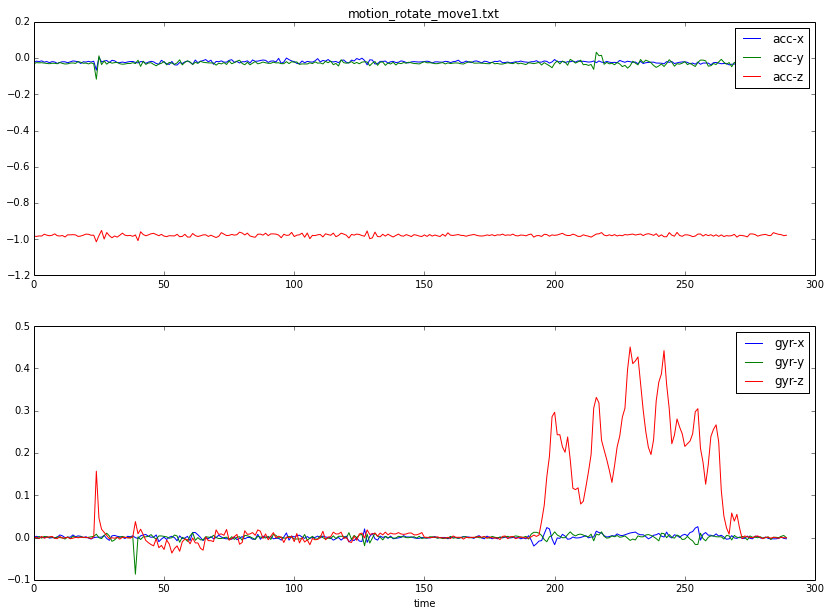

vibration:  1 entrophy gyr: 2.18226866699 entrophy acc: 2.79111485902
vibration:  1 entrophy gyr: 3.00041549602 entrophy acc: 3.05325803975
vibration:  2 entrophy gyr: 3.26805405026 entrophy acc: 3.14588592179
vibration:  0 entrophy gyr: 3.26725900524 entrophy acc: 3.11485987332
vibration:  3 entrophy gyr: 3.31709404209 entrophy acc: 3.05569581769
vibration:  10 entrophy gyr: 2.76659275541 entrophy acc: 3.08894596141
vibration:  12 entrophy gyr: 3.31962539479 entrophy acc: 3.1601120027
vibration:  10 entrophy gyr: 3.25475253144 entrophy acc: 3.19309233761
vibration:  1 entrophy gyr: 2.33043269642 entrophy acc: 2.68129545929


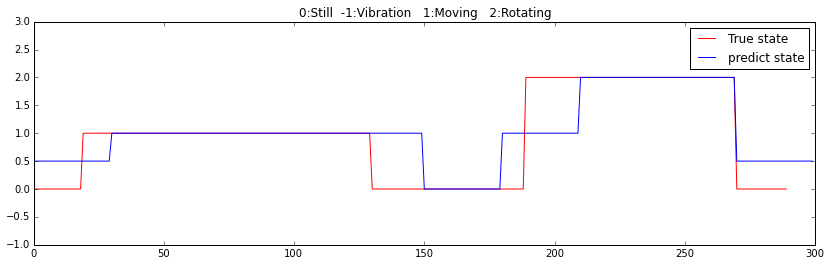

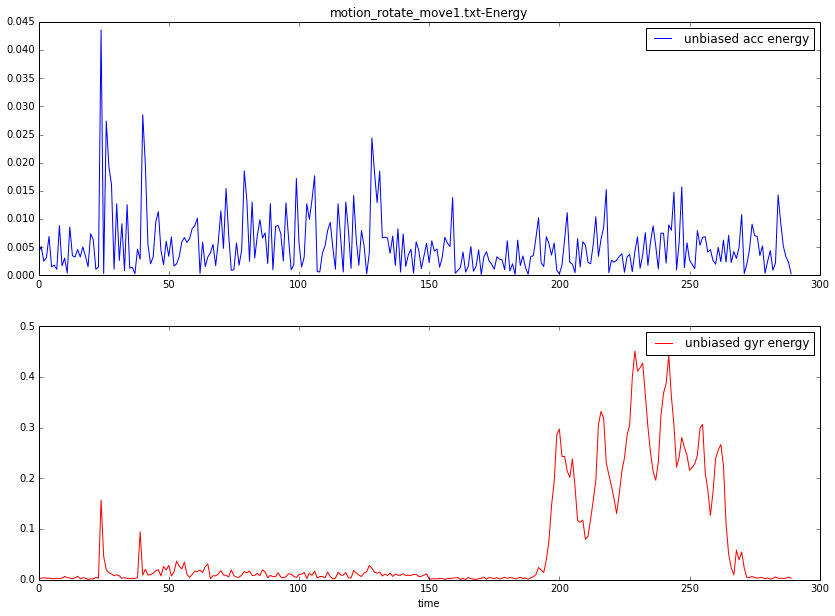

In [3051]:
if __name__=='__main__':
    dir = '../data/'
    
    fileName = 'motion_rotate_move1.txt'
    
    test(fileName)
    

* 快匀速移动->低匀速转动

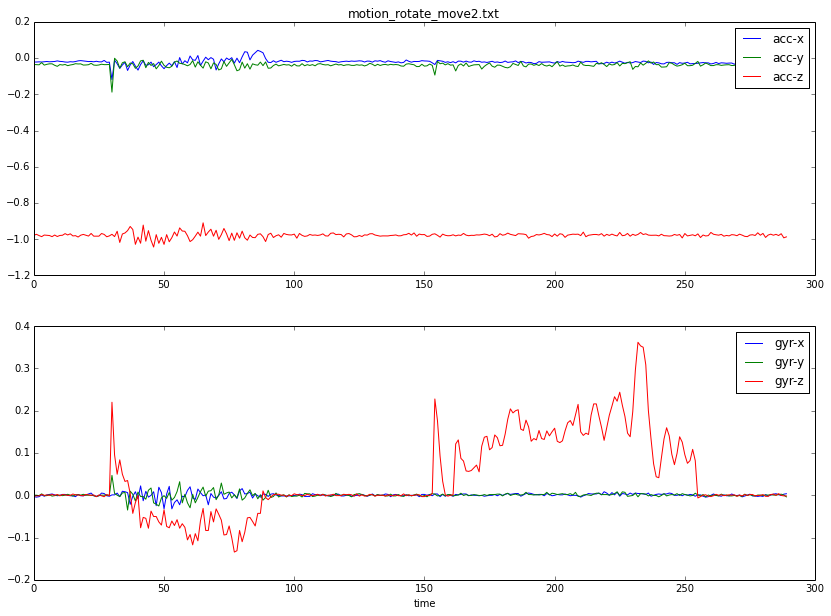

vibration:  1 entrophy gyr: 3.27756795636 entrophy acc: 3.16465144429
vibration:  9 entrophy gyr: 3.29683178809 entrophy acc: 3.11495507699
vibration:  0 entrophy gyr: 3.23794381445 entrophy acc: 3.14181726778
vibration:  4 entrophy gyr: 3.0530086136 entrophy acc: 3.10286779857
vibration:  29 entrophy gyr: 3.38716956301 entrophy acc: 3.15464860558
vibration:  8 entrophy gyr: 3.32874430029 entrophy acc: 3.00393492795
vibration:  6 entrophy gyr: 2.79419534235 entrophy acc: 3.11295918665


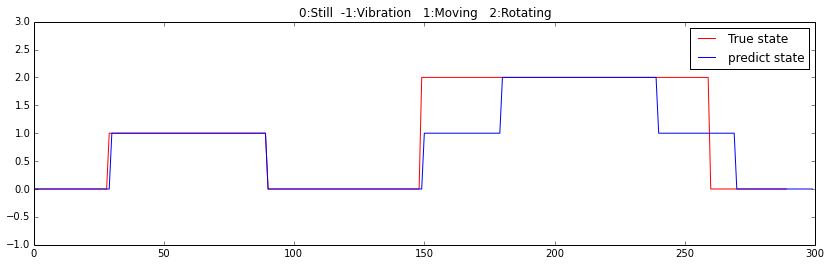

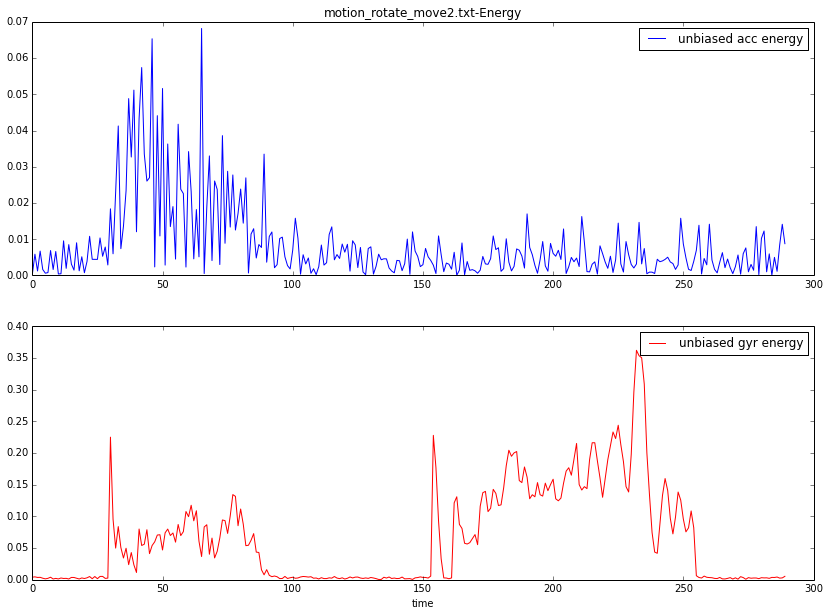

In [3052]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_rotate_move2.txt'
    
    test(fileName)
    

* 加速运动->匀速转动,可以发现加速运动会长生较大的角速度gyr-z

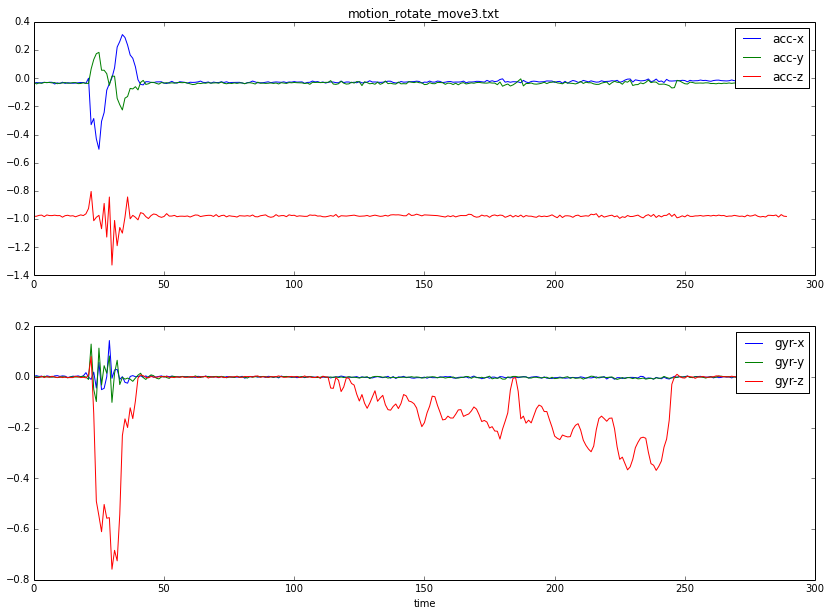

vibration:  5 entrophy gyr: 2.14198357337 entrophy acc: 2.44005165383
vibration:  4 entrophy gyr: 2.20677680787 entrophy acc: 2.40133377762
vibration:  2 entrophy gyr: 2.53163166766 entrophy acc: 3.17552303876
vibration:  7 entrophy gyr: 3.28129164109 entrophy acc: 3.05117108995
vibration:  14 entrophy gyr: 3.37184663605 entrophy acc: 3.17196500579
vibration:  14 entrophy gyr: 3.29182528305 entrophy acc: 3.13059262143
vibration:  17 entrophy gyr: 3.36797517577 entrophy acc: 3.16029232254
vibration:  4 entrophy gyr: 1.94719892773 entrophy acc: 3.04337507522


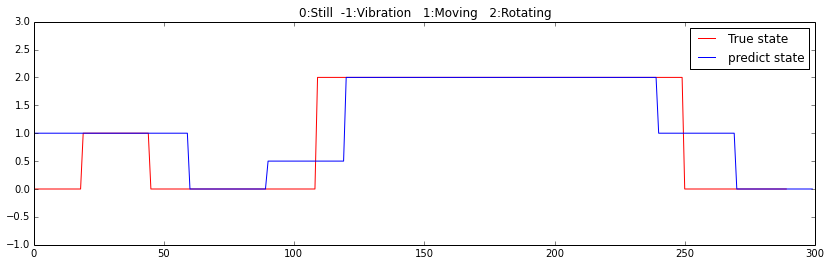

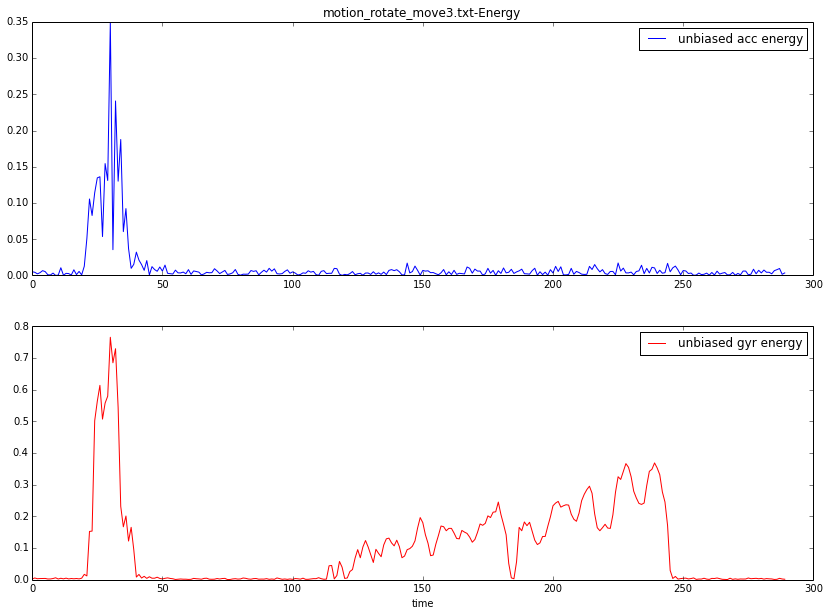

In [3053]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_rotate_move3.txt'
    
    test(fileName)
    

* 加速运动->加速转动，这里应为转动过程太快，导致无法识别，其实因为gyr能量很高，可以单独使用能量区别，而不需要使用过零率

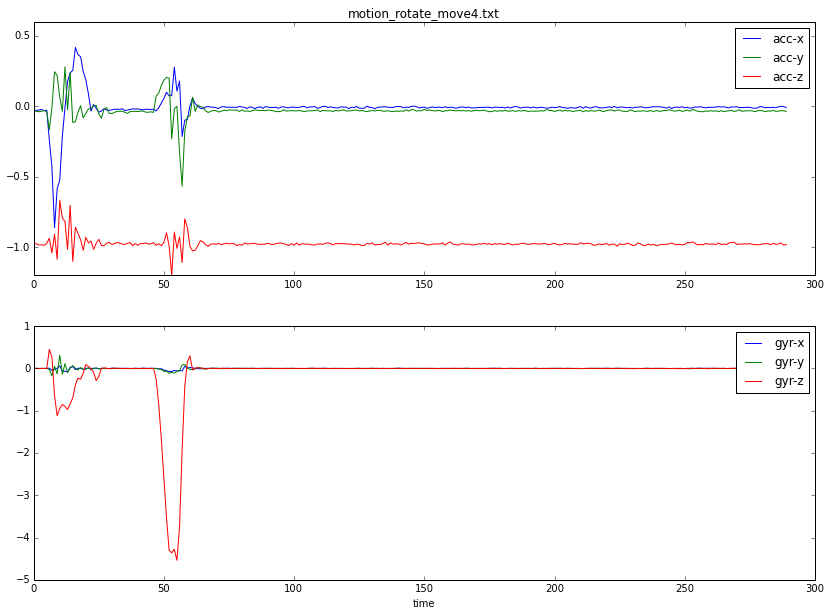

vibration:  8 entrophy gyr: 2.72705410921 entrophy acc: 3.207717063
vibration:  8 entrophy gyr: 2.31720872466 entrophy acc: 3.2869998316
vibration:  1 entrophy gyr: 1.89420778129 entrophy acc: 3.37550692567


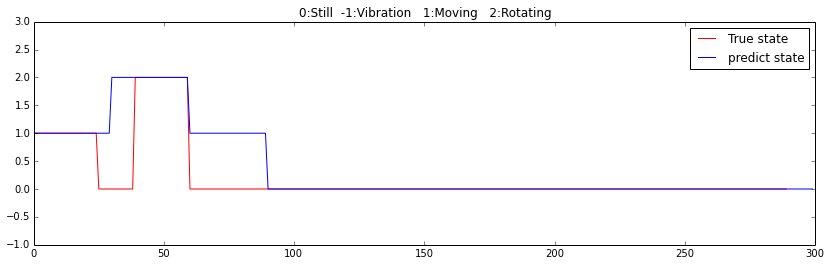

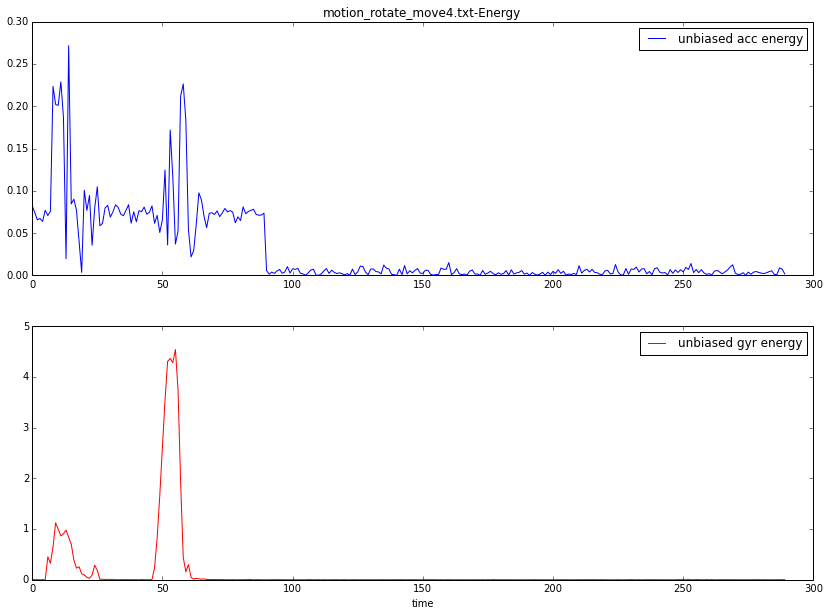

In [3054]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_rotate_move4.txt'
    
    test(fileName)

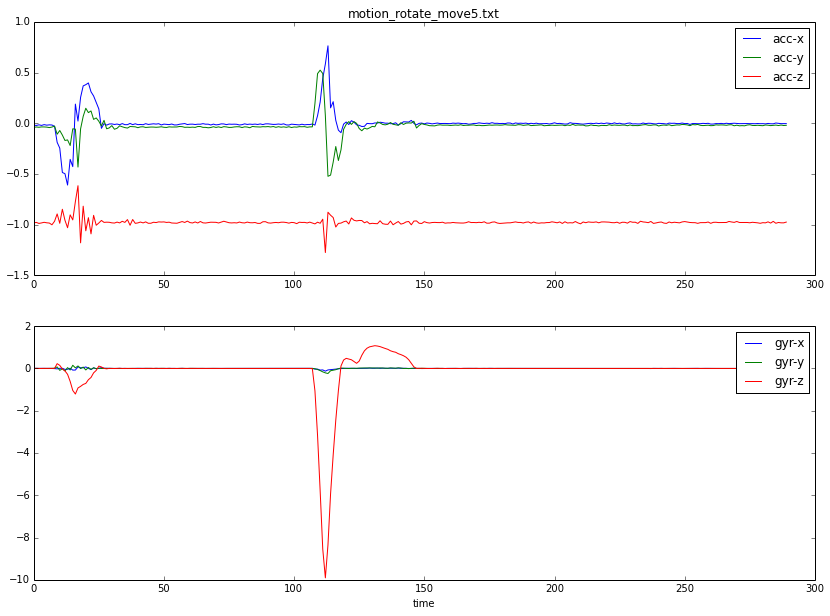

vibration:  8 entrophy gyr: 2.62784510056 entrophy acc: 2.70724185222
vibration:  0 entrophy gyr: 3.32835804915 entrophy acc: 2.99172039529
vibration:  5 entrophy gyr: 2.15616308668 entrophy acc: 2.28181525853
vibration:  17 entrophy gyr: 3.19867532139 entrophy acc: 3.27762118415


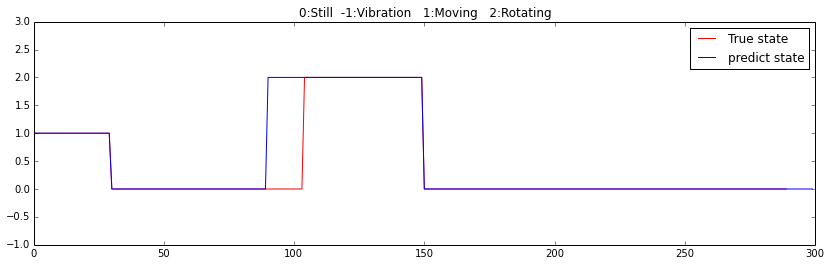

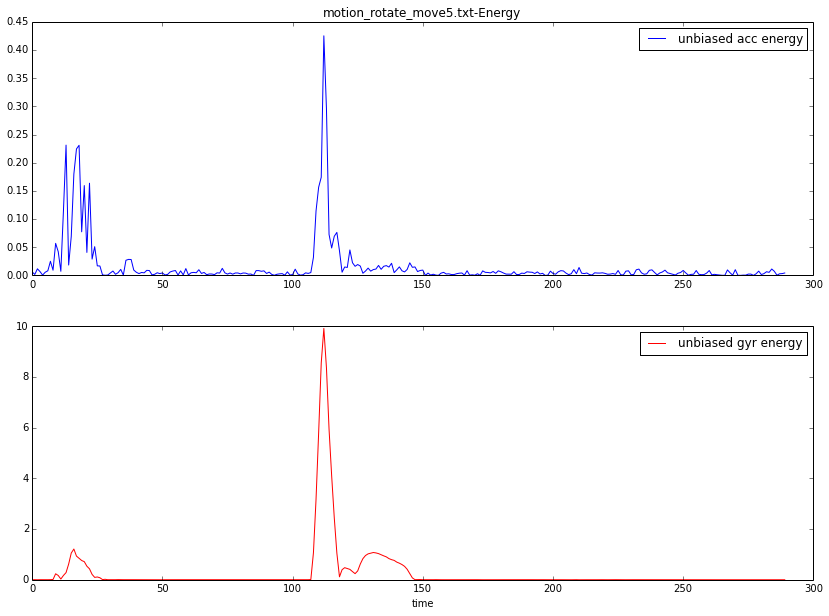

In [3055]:
if __name__=='__main__':
    dir = '../data/'
    fileName = 'motion_rotate_move5.txt'
    
    test(fileName)
    

* 匀速移动，匀速转动同时进行

In [ ]:
if __name__=='__main__':
    dir = '../data/'
    fileName = dir + 'motion_rotate_move6.txt'
    
    #test(fileName)

* 加速转动，加速移动同时进行

In [ ]:
if __name__=='__main__':
    dir = '../data/'
    fileName = dir + 'motion_rotate_move7.txt'
    
    #test(fileName)

In [ ]:
if __name__=='__main__':
    dir = '../data/'
    fileName = dir + 'motion_rotate_move8.txt'
    
    #test(fileName)

#motion_vibration: 震动

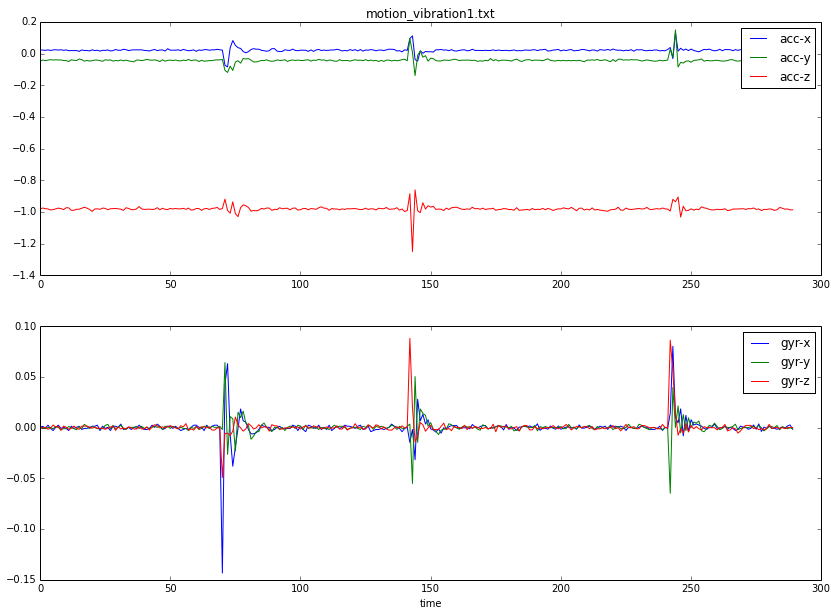

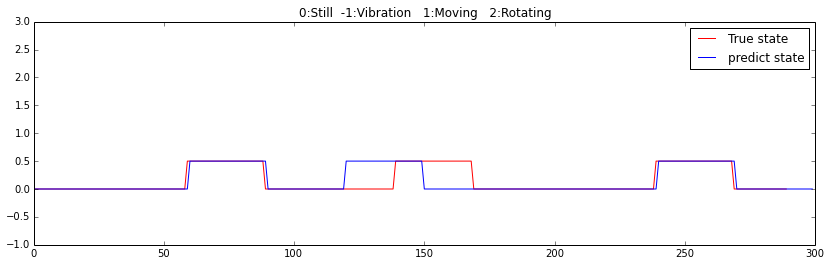

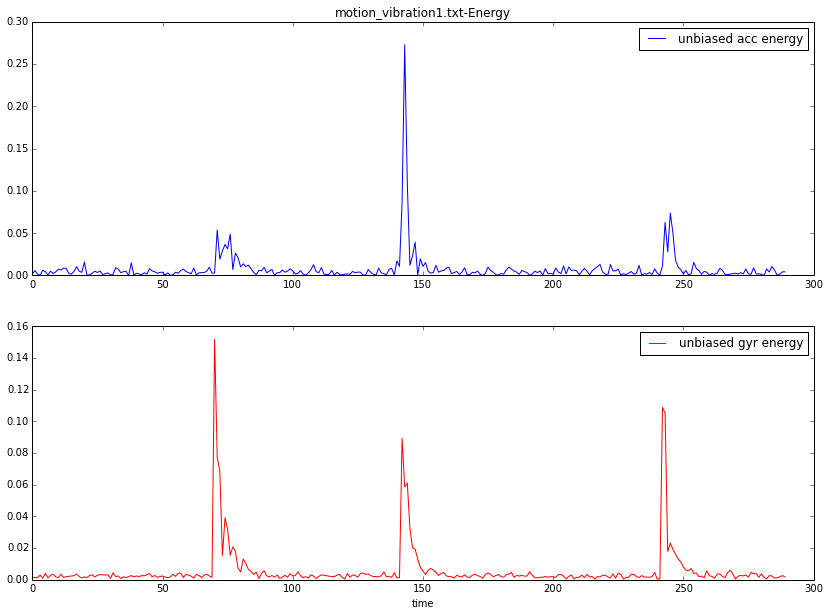

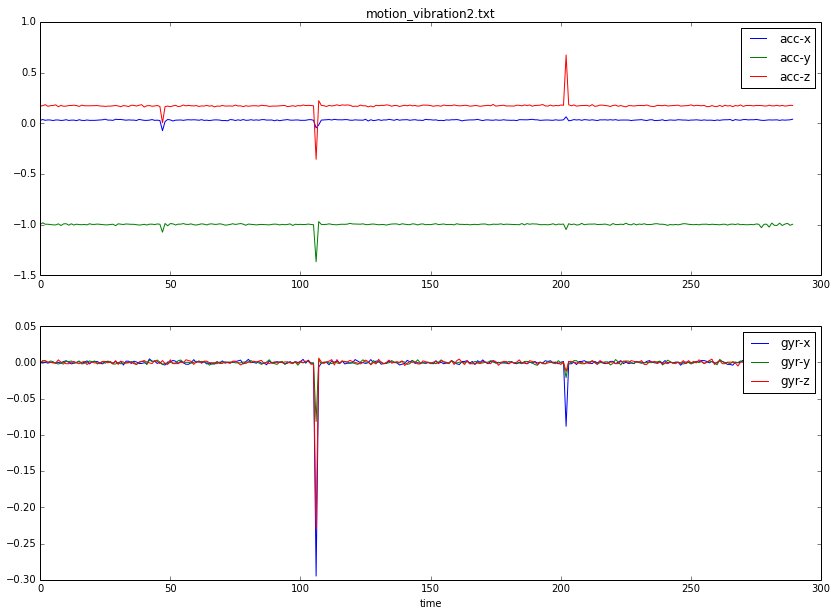

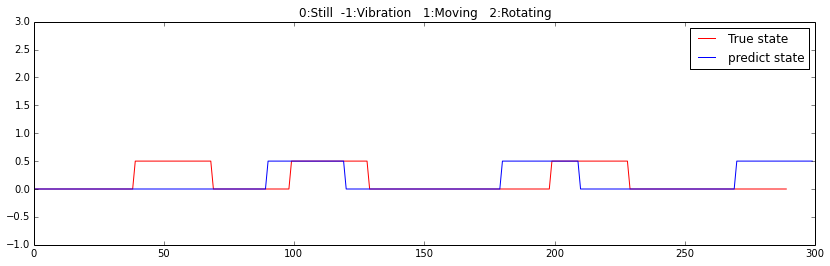

...

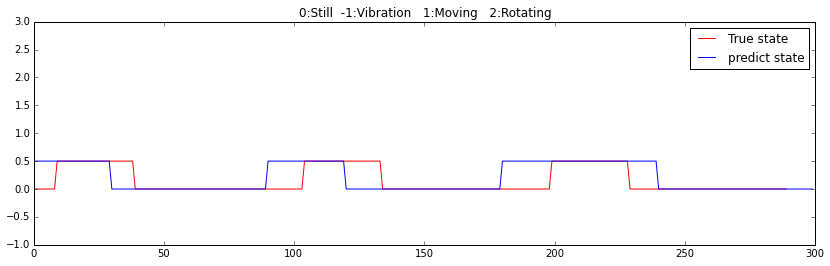

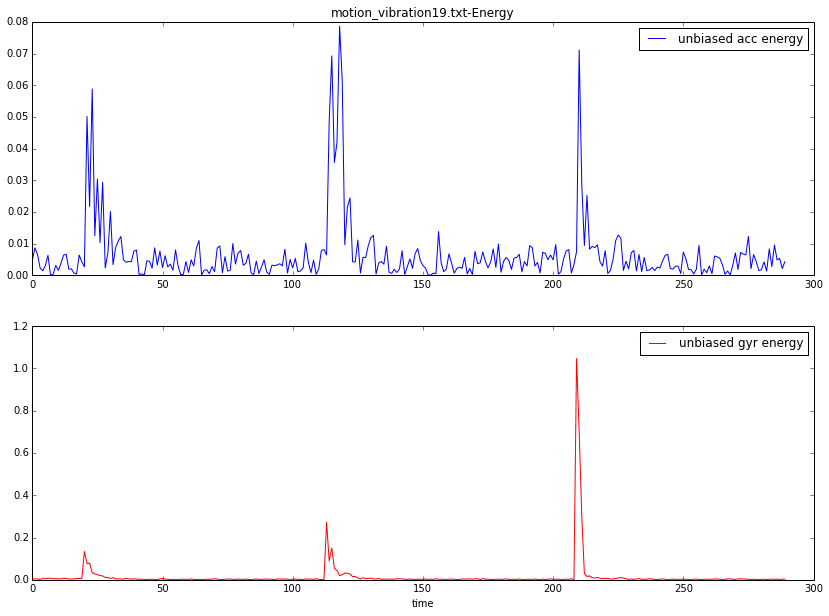

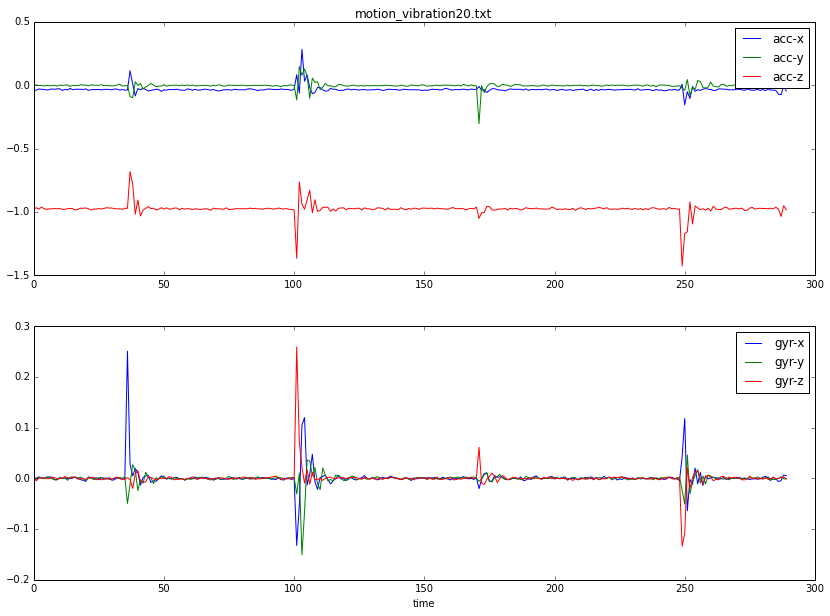

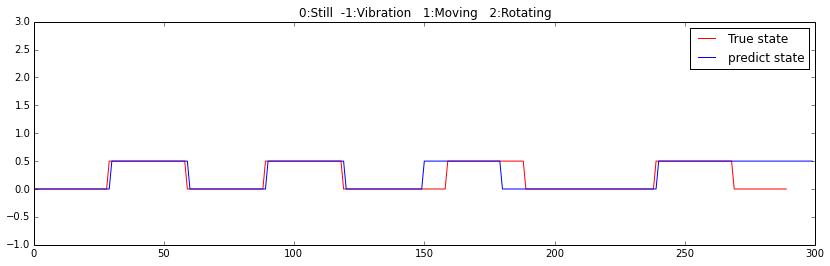

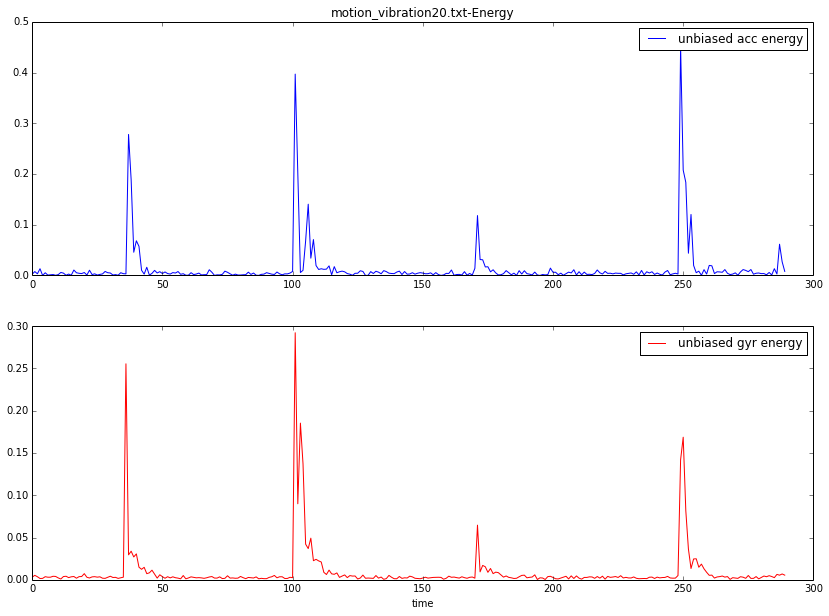

In [3078]:
if __name__=='__main__':
    dir = '../data/'
    
    for i in range(1, 21):
        fileName = 'motion_vibration' + str(i) + '.txt'
    
        test(fileName)

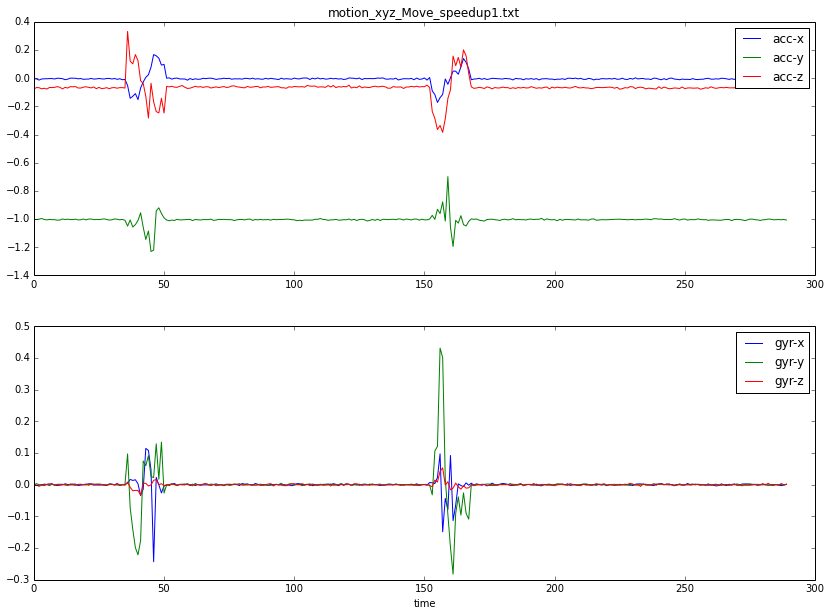

vibration:  4 entrophy gyr: 2.65681569695 entrophy acc: 2.53225981311
vibration:  3 entrophy gyr: 2.48866319042 entrophy acc: 2.35422095438


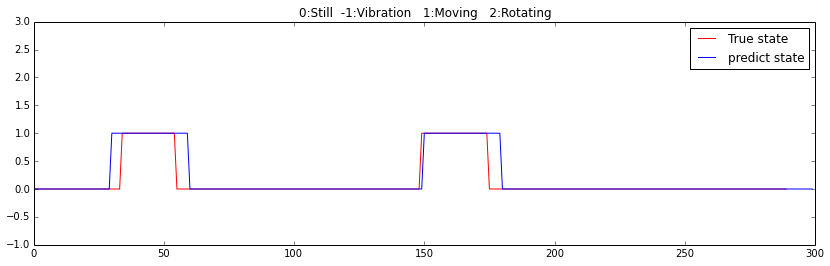

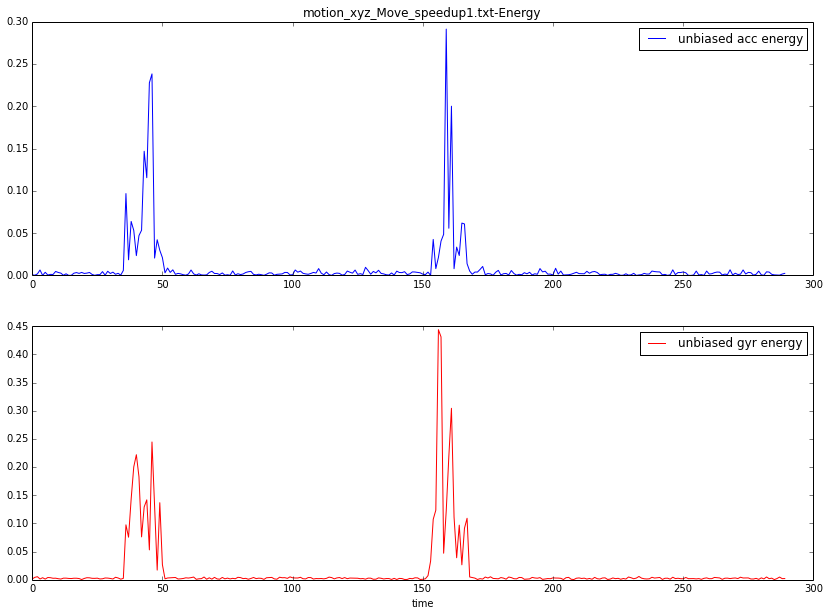

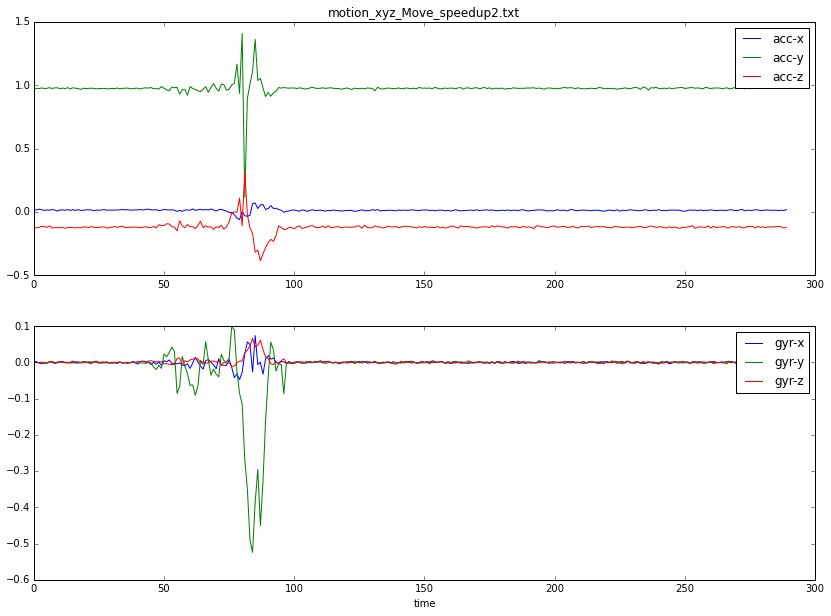

vibration:  3 entrophy gyr: 2.80276856041 entrophy acc: 2.6797443548
vibration:  9 entrophy gyr: 2.85249722055 entrophy acc: 2.50837188593
vibration:  2 entrophy gyr: 2.43688165936 entrophy acc: 2.79255236733


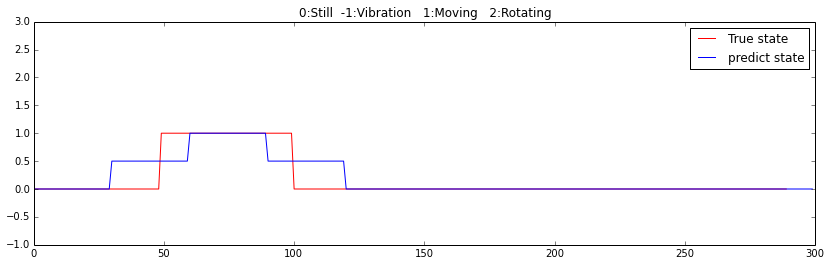

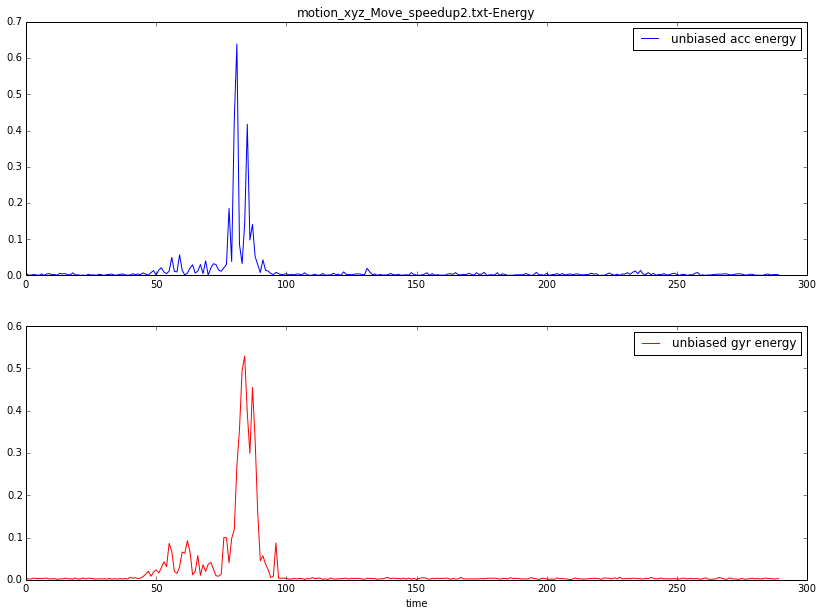

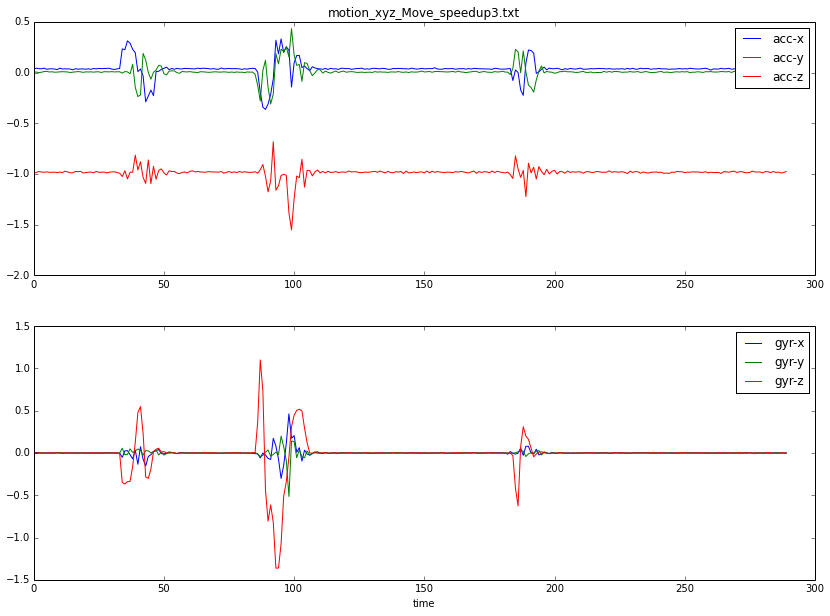

vibration:  4 entrophy gyr: 2.65896066814 entrophy acc: 2.82729175154
vibration:  3 entrophy gyr: 1.46808056219 entrophy acc: 2.3990068255
vibration:  4 entrophy gyr: 2.69336448991 entrophy acc: 2.64251954684
vibration:  3 entrophy gyr: 2.24379278734 entrophy acc: 2.67541838151


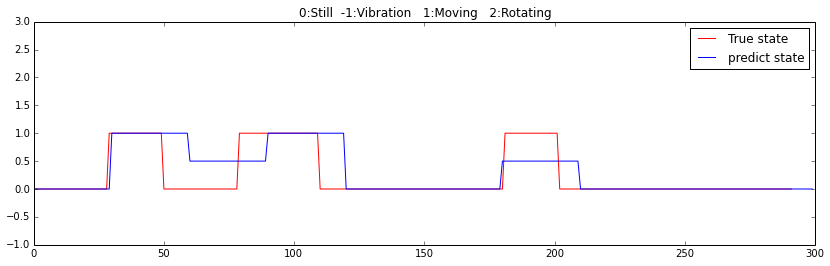

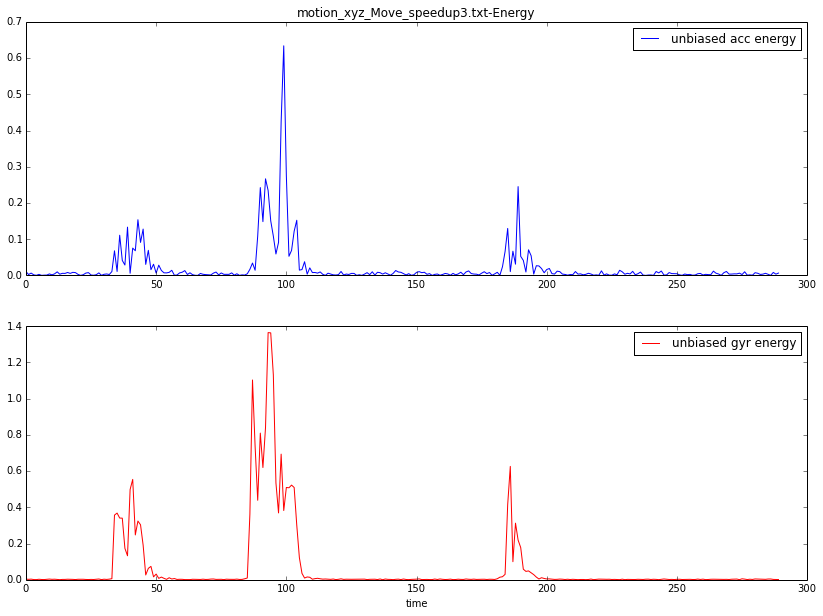

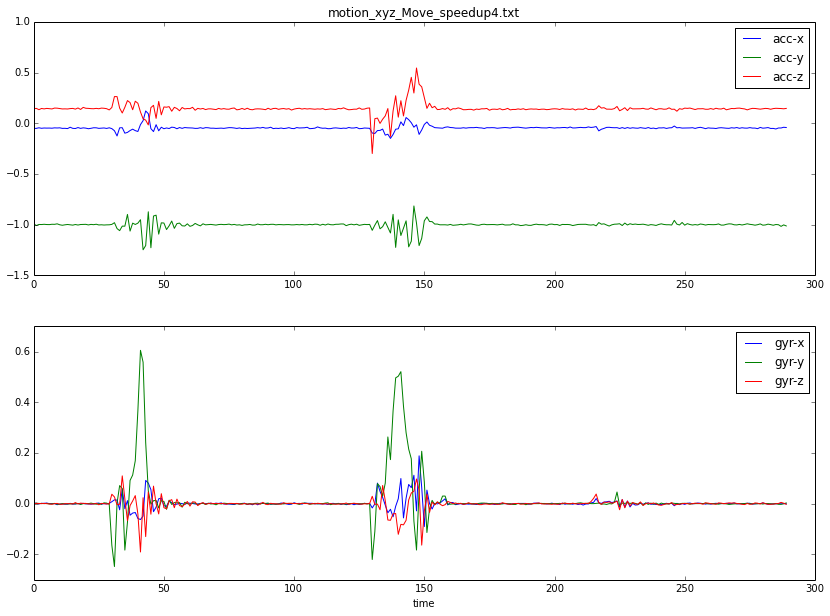

vibration:  4 entrophy gyr: 2.79235693811 entrophy acc: 2.86985815166
vibration:  6 entrophy gyr: 2.86885628379 entrophy acc: 2.72697167069
vibration:  2 entrophy gyr: 2.33734108992 entrophy acc: 2.52398374899
vibration:  2 entrophy gyr: 3.0354885977 entrophy acc: 3.06706660047
vibration:  0 entrophy gyr: 3.23113236457 entrophy acc: 2.97861271577


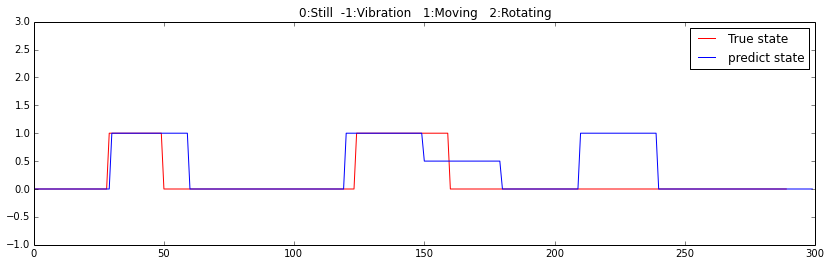

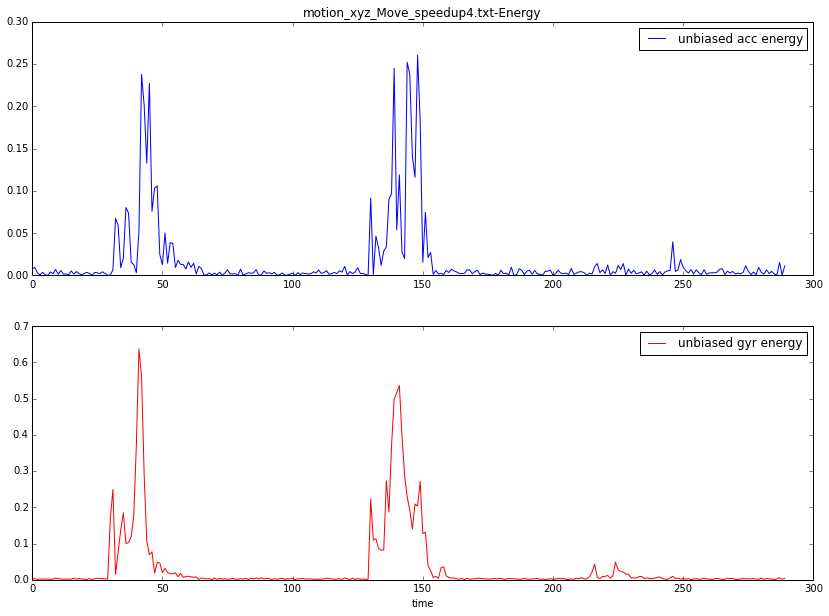

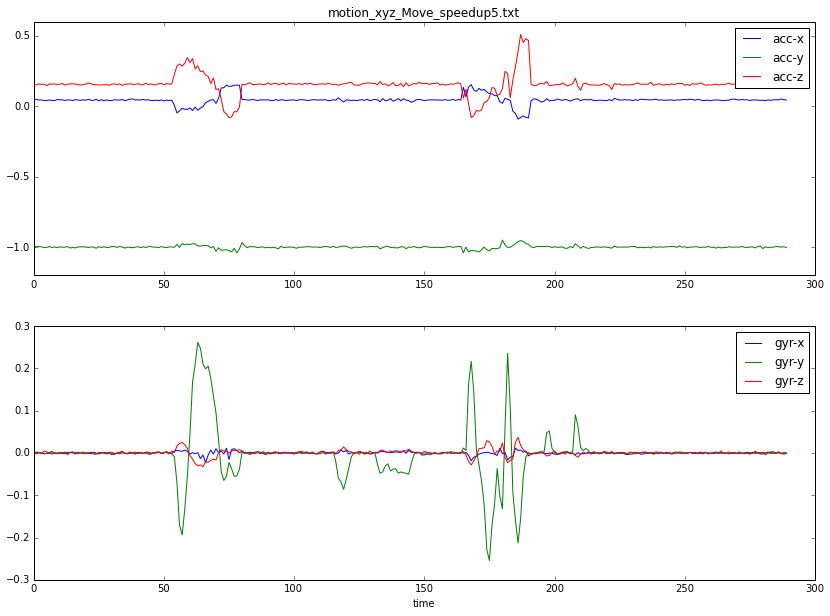

vibration:  4 entrophy gyr: 2.02114667669 entrophy acc: 2.82386596689
vibration:  10 entrophy gyr: 2.81984844343 entrophy acc: 2.94914792798
vibration:  3 entrophy gyr: 2.27068403062 entrophy acc: 3.02505645084
vibration:  9 entrophy gyr: 2.96698644388 entrophy acc: 3.05995995643
vibration:  4 entrophy gyr: 2.5360605409 entrophy acc: 2.90114753838
vibration:  4 entrophy gyr: 2.64137433137 entrophy acc: 2.61341964918
vibration:  0 entrophy gyr: 3.20414401403 entrophy acc: 3.09772237978


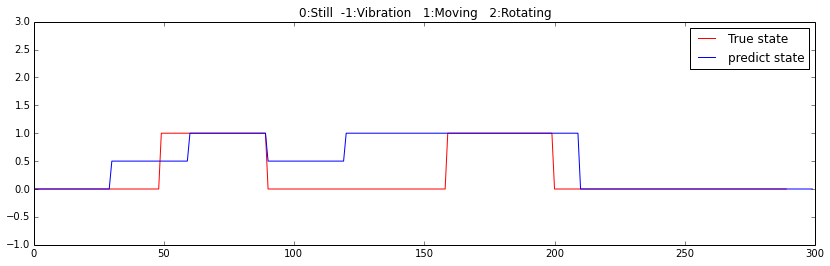

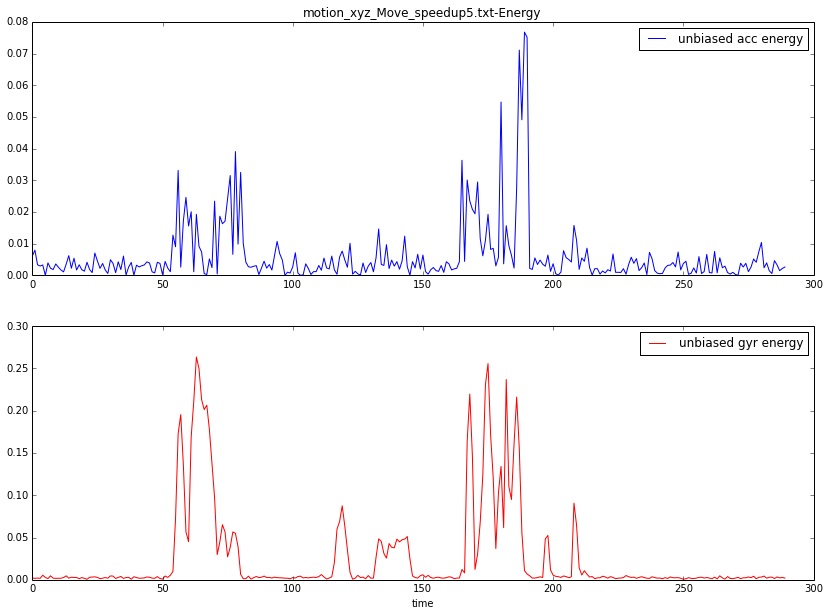

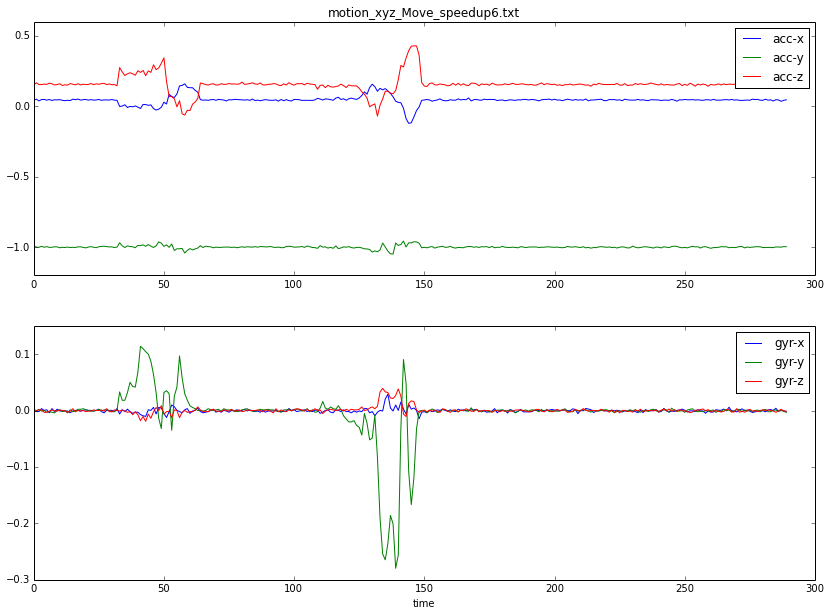

vibration:  7 entrophy gyr: 3.15638180014 entrophy acc: 3.05506977546
vibration:  0 entrophy gyr: 3.2540517355 entrophy acc: 2.98094219521
vibration:  0 entrophy gyr: 3.19359530528 entrophy acc: 3.1181528504
vibration:  9 entrophy gyr: 2.95701902592 entrophy acc: 3.03187145047


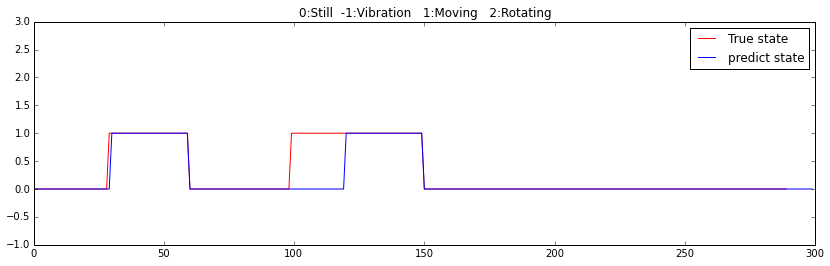

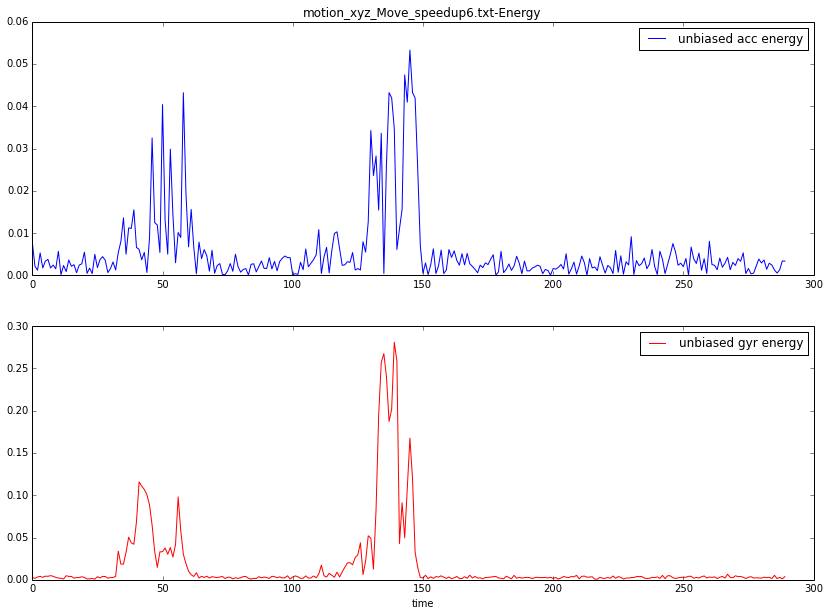

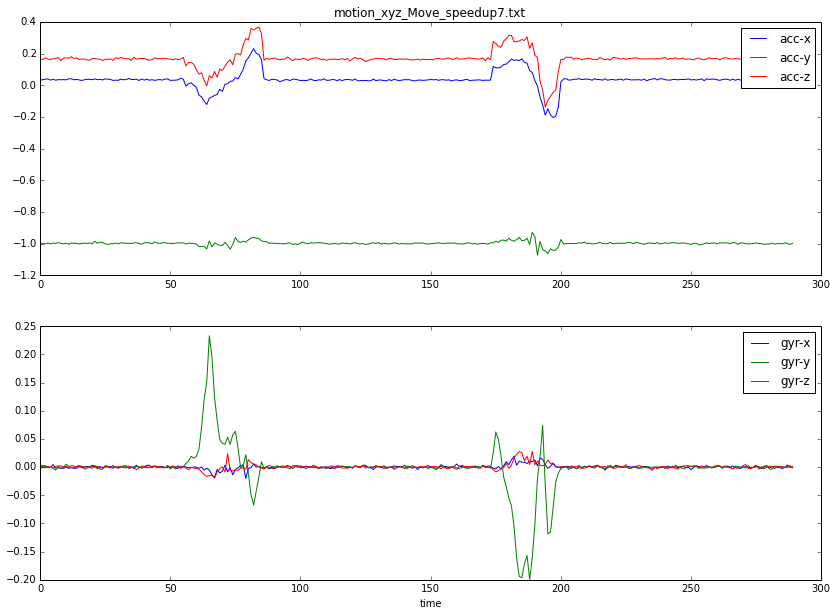

vibration:  0 entrophy gyr: 3.06169141211 entrophy acc: 3.03595267338
vibration:  5 entrophy gyr: 2.9532643931 entrophy acc: 3.05422501586
vibration:  3 entrophy gyr: 2.5816464956 entrophy acc: 2.77149100695
vibration:  9 entrophy gyr: 2.85591685411 entrophy acc: 2.99146226251


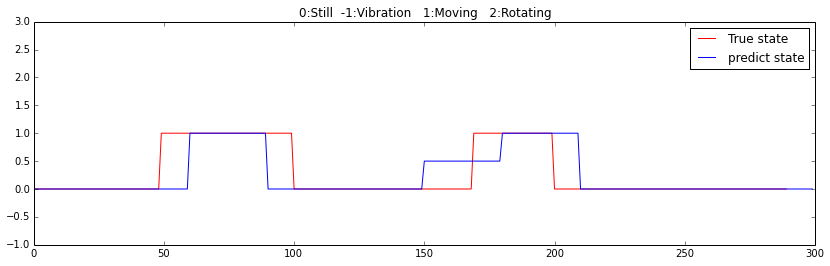

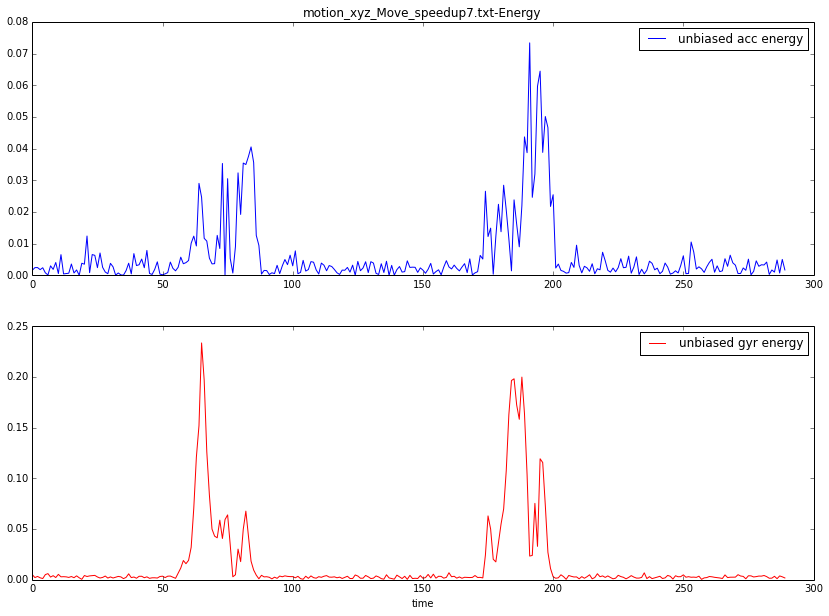

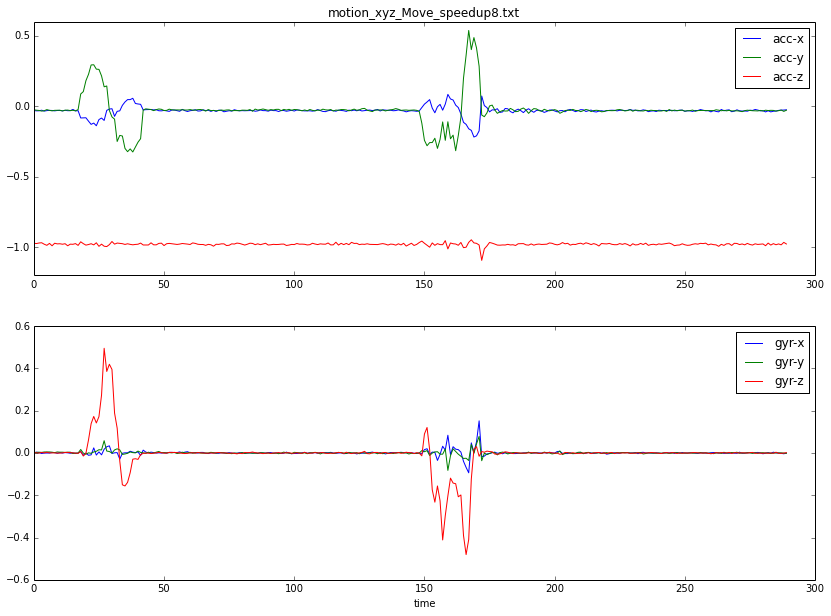

vibration:  4 entrophy gyr: 2.27057642997 entrophy acc: 2.85514193098
vibration:  1 entrophy gyr: 2.39246591851 entrophy acc: 2.85851490524
vibration:  0 entrophy gyr: 3.21226528265 entrophy acc: 3.05120431828
vibration:  4 entrophy gyr: 2.98437409813 entrophy acc: 3.03187481777
vibration:  0 entrophy gyr: 3.21172687866 entrophy acc: 3.07947182868


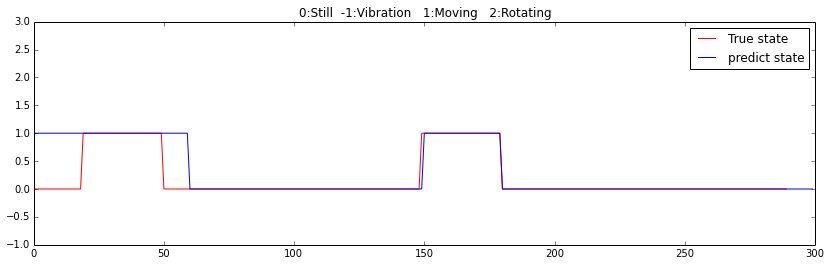

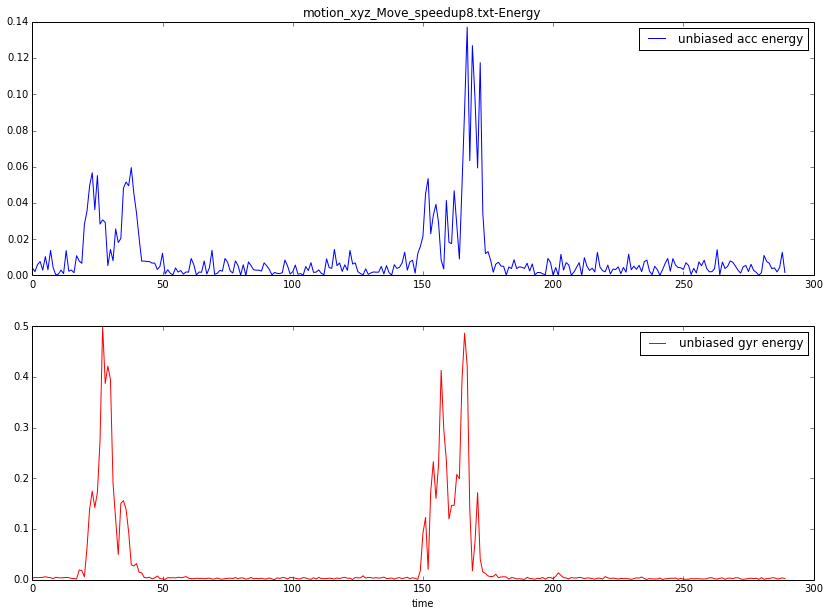

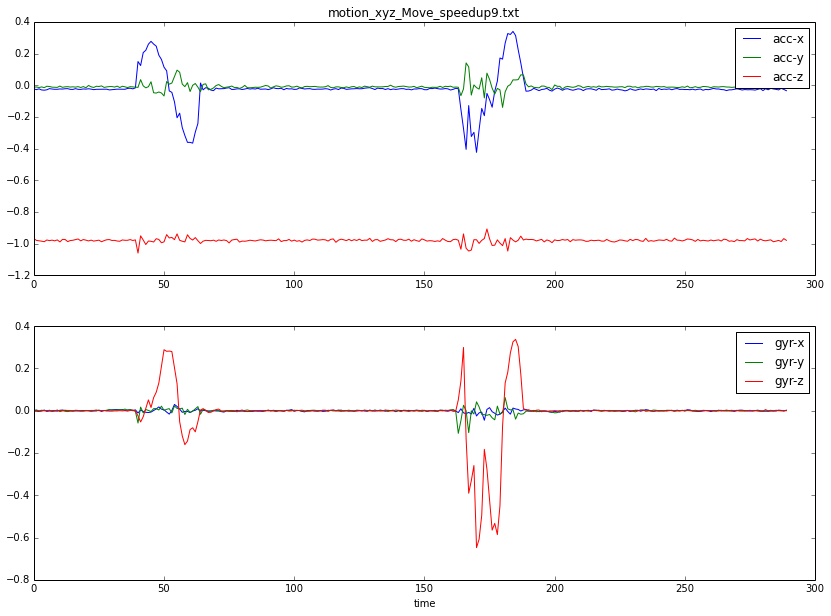

vibration:  7 entrophy gyr: 2.83951331584 entrophy acc: 2.93069010872
vibration:  4 entrophy gyr: 2.44675907695 entrophy acc: 2.57800072811
vibration:  5 entrophy gyr: 2.76055274734 entrophy acc: 2.71463457646
vibration:  6 entrophy gyr: 2.29812049576 entrophy acc: 2.5332130426


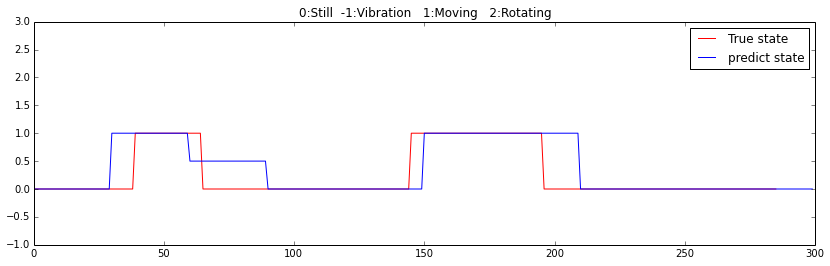

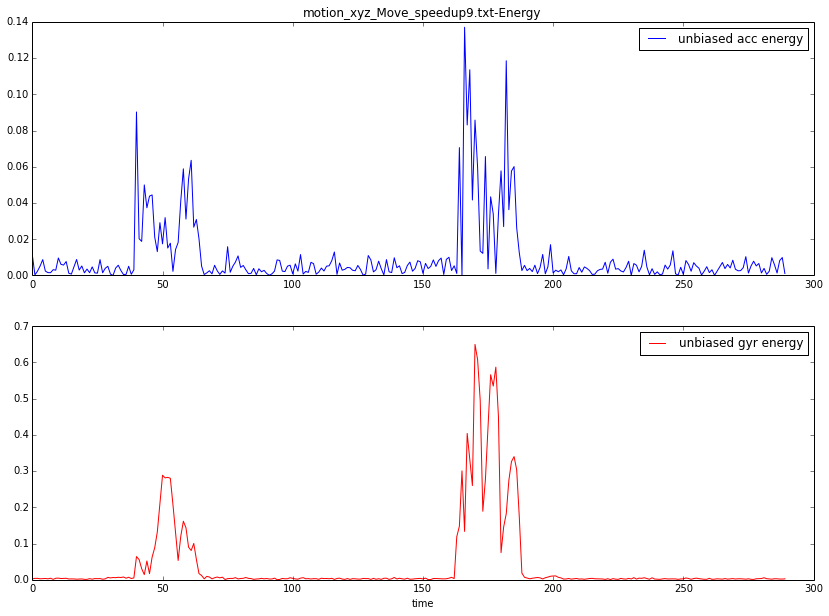

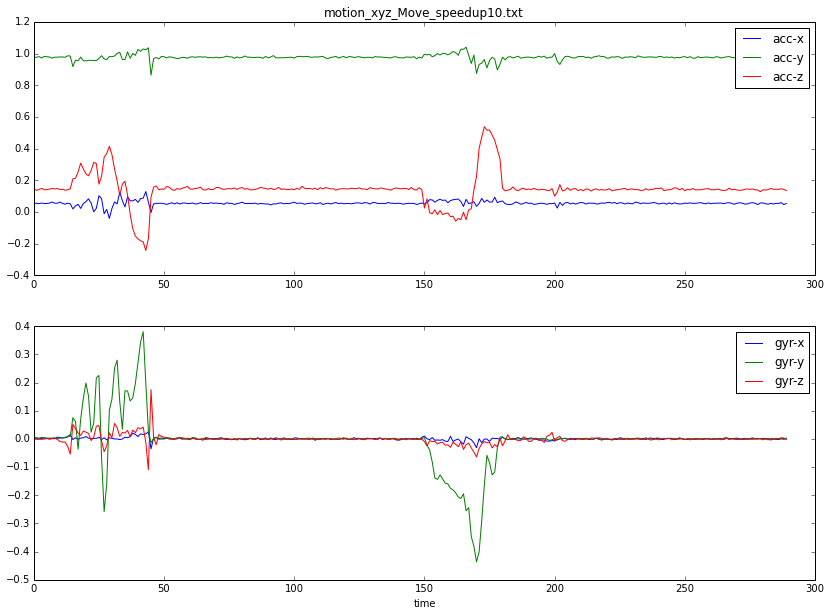

vibration:  3 entrophy gyr: 2.79356700293 entrophy acc: 2.57956355525
vibration:  6 entrophy gyr: 2.79996170965 entrophy acc: 2.81666300805
vibration:  8 entrophy gyr: 3.18395402947 entrophy acc: 2.92338771124
vibration:  1 entrophy gyr: 3.14392033067 entrophy acc: 2.72909580655


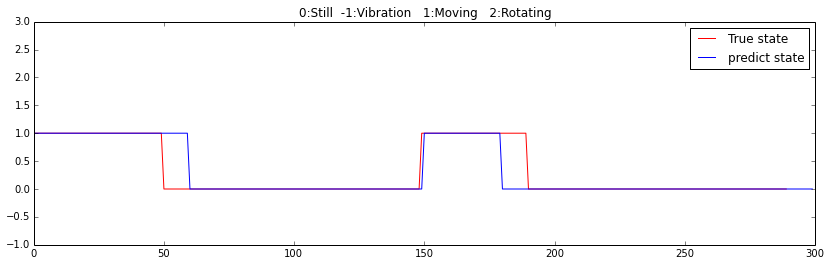

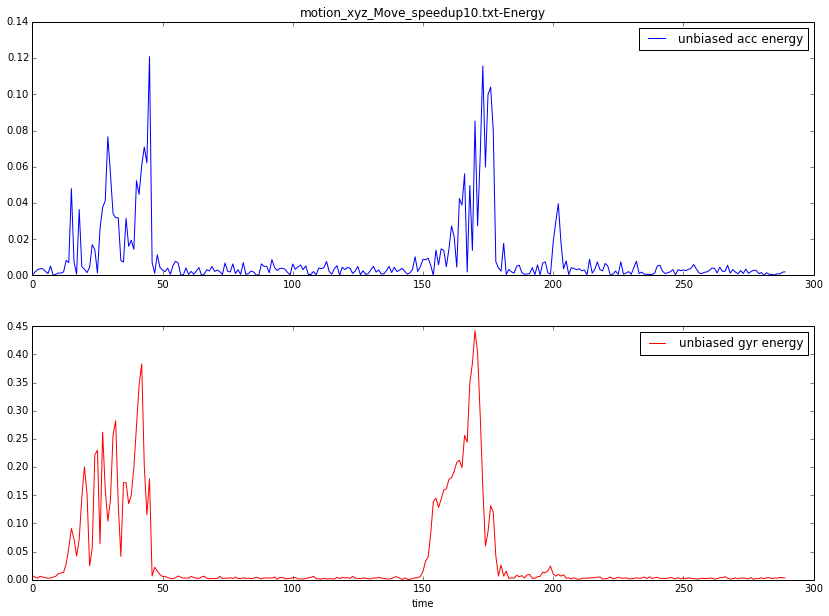

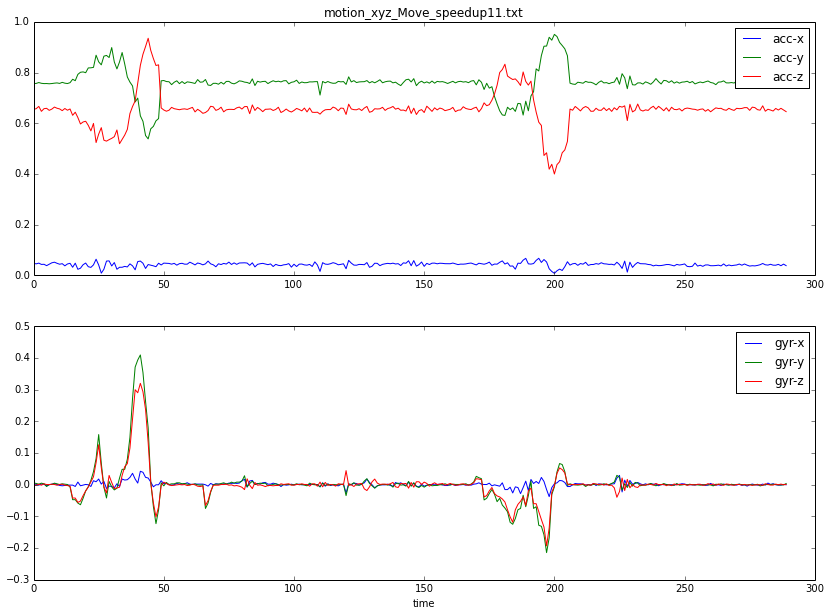

vibration:  3 entrophy gyr: 2.70951386924 entrophy acc: 3.05406250346
vibration:  7 entrophy gyr: 2.60090875747 entrophy acc: 2.8762005122
vibration:  2 entrophy gyr: 2.75255256116 entrophy acc: 3.17357570426
vibration:  0 entrophy gyr: 3.21544905659 entrophy acc: 2.80483864773
vibration:  1 entrophy gyr: 2.980586123 entrophy acc: 2.99508299615
vibration:  4 entrophy gyr: 2.77363552461 entrophy acc: 3.02543186644
vibration:  5 entrophy gyr: 3.07382865089 entrophy acc: 3.16674507118
vibration:  3 entrophy gyr: 2.82293608567 entrophy acc: 2.88997256605


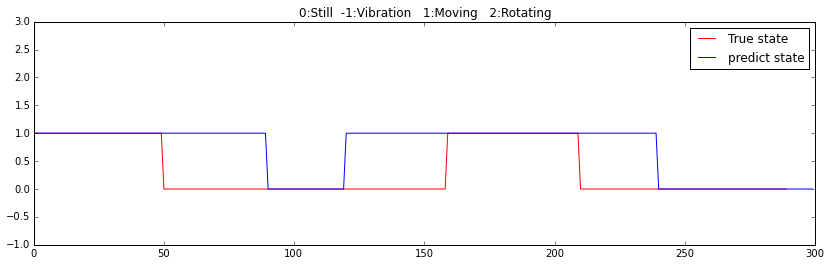

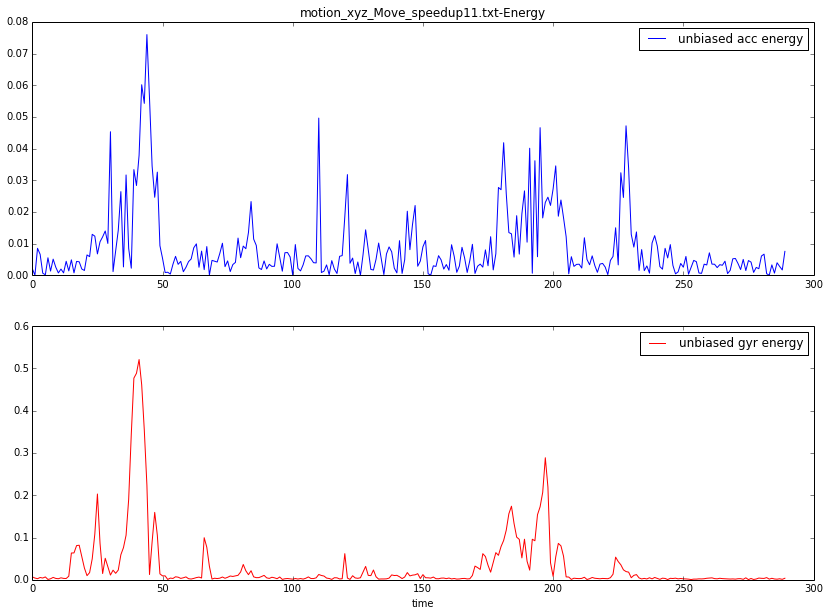

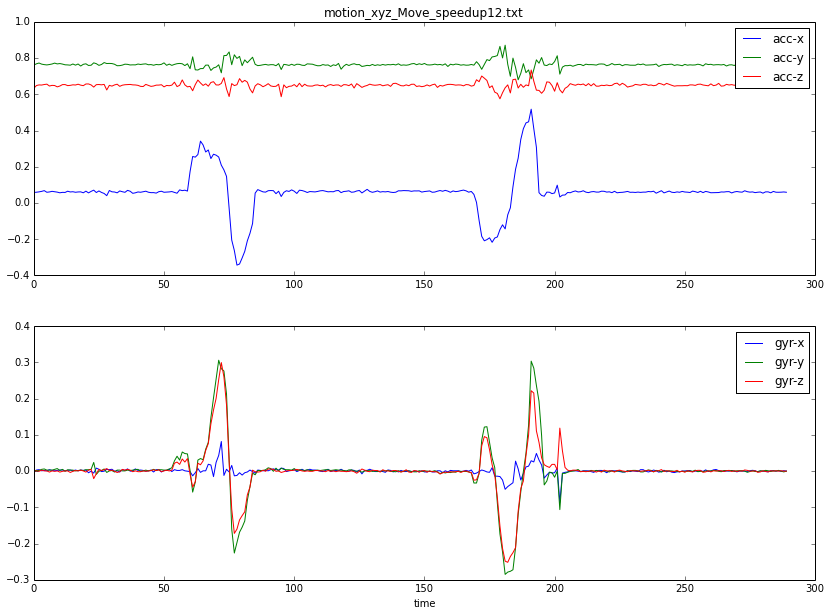

vibration:  1 entrophy gyr: 3.13106666937 entrophy acc: 3.05452996571
vibration:  5 entrophy gyr: 2.72614017619 entrophy acc: 2.95079192879
vibration:  6 entrophy gyr: 2.94789608894 entrophy acc: 3.05085266983
vibration:  0 entrophy gyr: 3.27072901222 entrophy acc: 2.71675265305
vibration:  0 entrophy gyr: 3.29992969245 entrophy acc: 3.14369980979
vibration:  3 entrophy gyr: 2.43329988027 entrophy acc: 2.70419373955
vibration:  6 entrophy gyr: 2.86545327312 entrophy acc: 2.96384982505


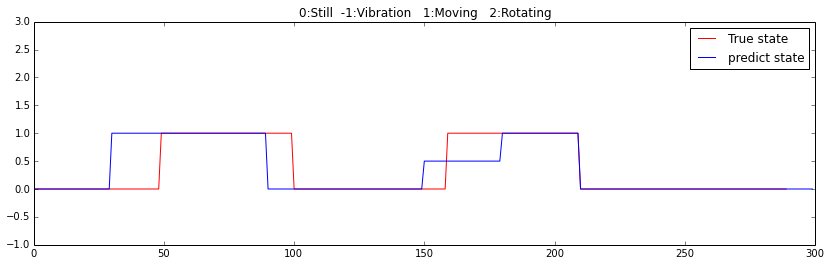

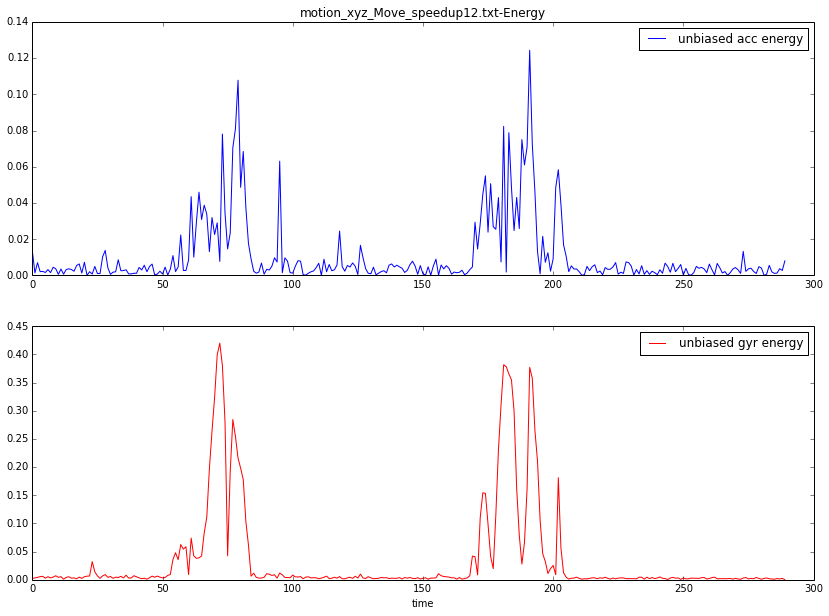

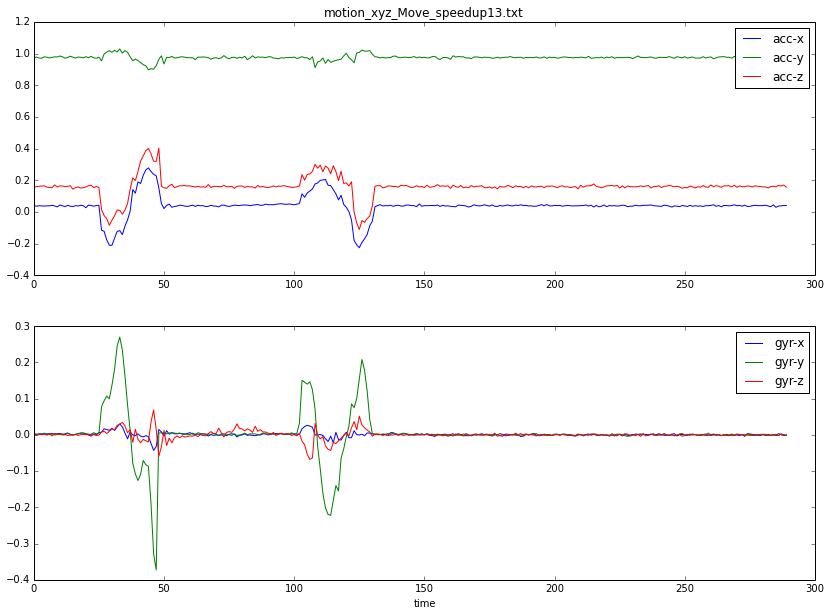

vibration:  3 entrophy gyr: 2.3109779685 entrophy acc: 2.6872949142
vibration:  4 entrophy gyr: 2.93527013297 entrophy acc: 2.94962793394
vibration:  3 entrophy gyr: 3.22981042403 entrophy acc: 2.99568782731
vibration:  7 entrophy gyr: 2.87627020871 entrophy acc: 2.9511568644
vibration:  4 entrophy gyr: 2.37912841082 entrophy acc: 2.64802802806


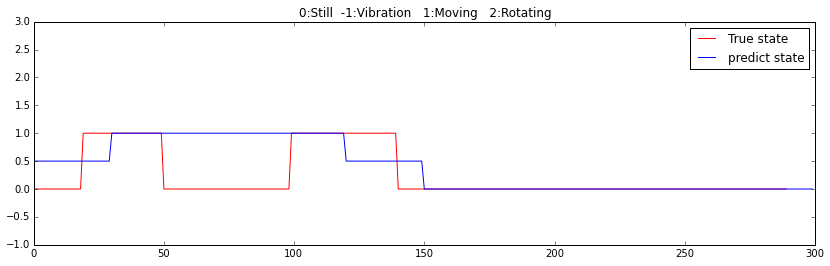

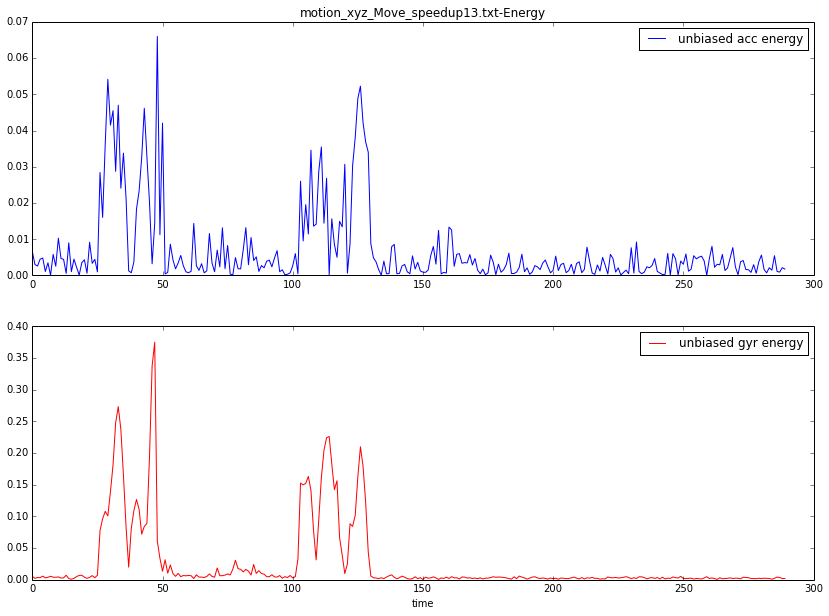

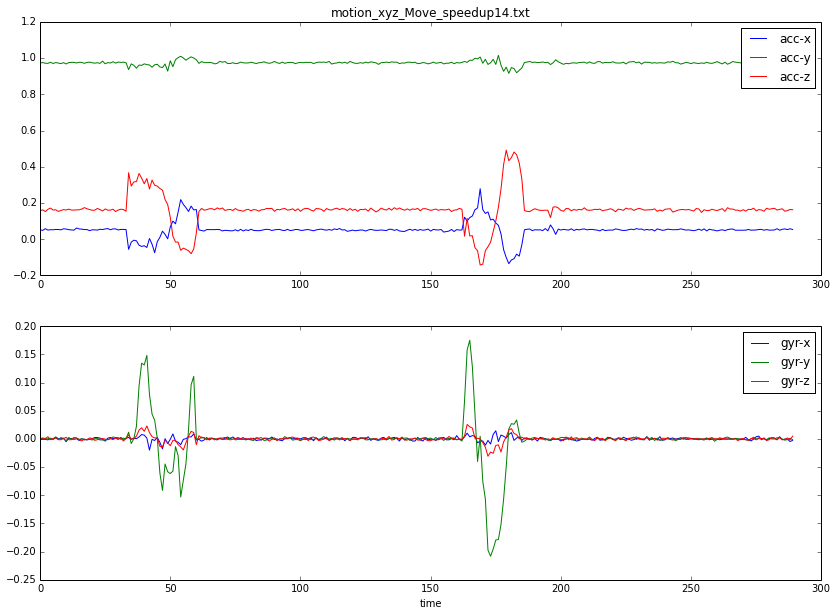

vibration:  6 entrophy gyr: 3.02455287334 entrophy acc: 3.13505461108
vibration:  0 entrophy gyr: 3.27307368523 entrophy acc: 3.04881075537
vibration:  9 entrophy gyr: 2.76632305726 entrophy acc: 2.68051707903
vibration:  4 entrophy gyr: 2.76255247297 entrophy acc: 2.5294380814


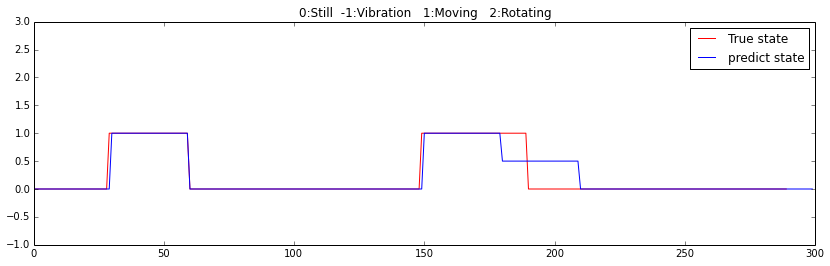

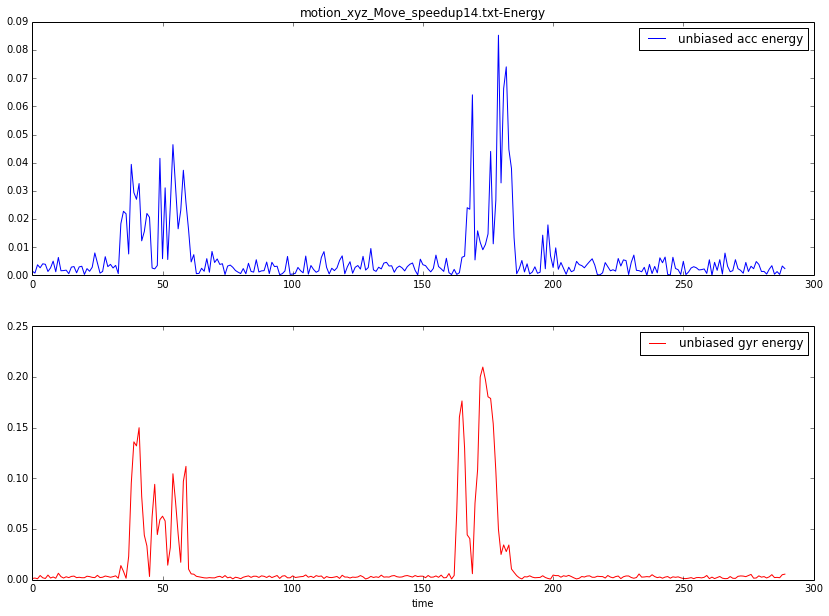

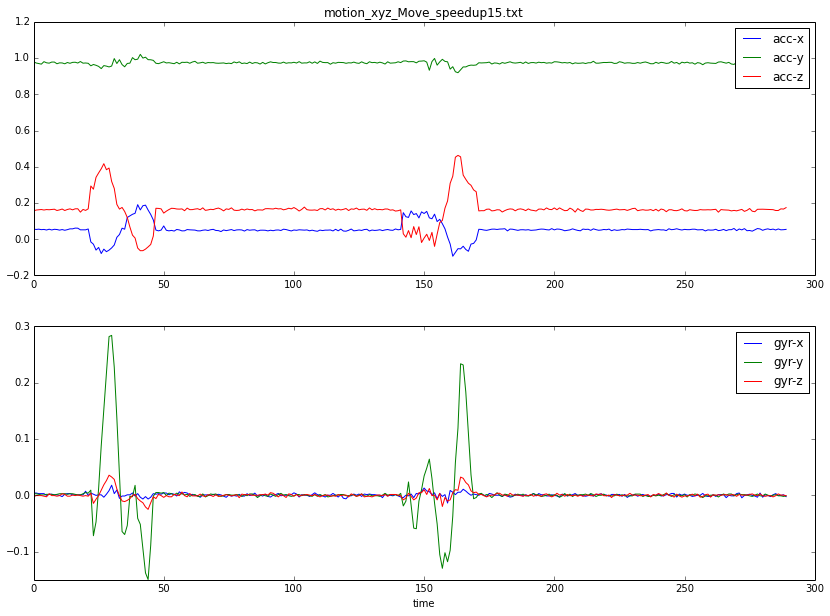

vibration:  3 entrophy gyr: 2.08892300615 entrophy acc: 2.64641792121
vibration:  2 entrophy gyr: 2.63679225767 entrophy acc: 2.86559201511
vibration:  2 entrophy gyr: 2.65322433956 entrophy acc: 3.22521113438
vibration:  4 entrophy gyr: 2.83518034196 entrophy acc: 2.89361763939


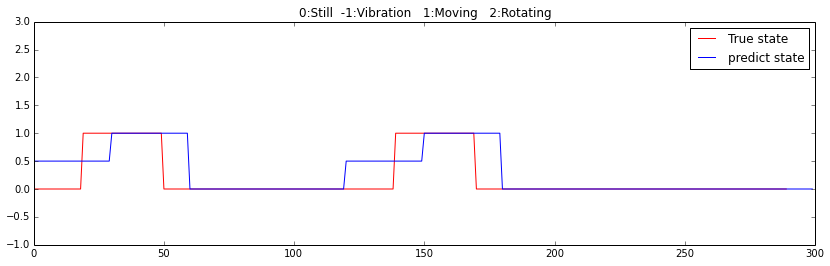

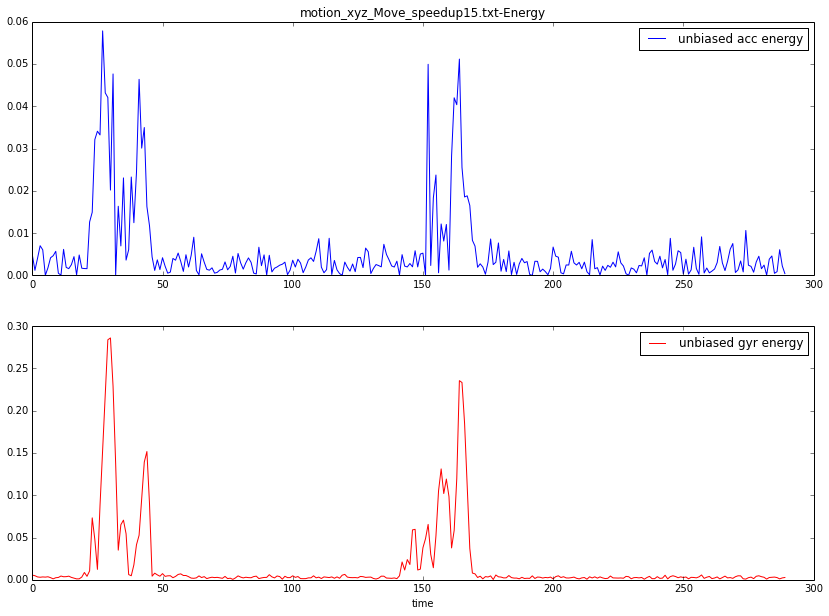

In [3057]:
if __name__=='__main__':
    dir = '../data/'
    
    for i in range(1, 16):
        fileName = 'motion_xyz_Move_speedup' + str(i) + '.txt'
    
        test(fileName)
    

In [16]:
def test2(fileName):
    sigFilePath, labelFilePath = getFilePath(fileName)
    #res_array = getSigs(fileName)
    res_array, true_label = extractSig(sigFilePath, labelFilePath)
    
    
    energy_array = energyXYZ(res_array)
    #correct gyr bias
    correctBias_gyr(res_array[:,3:6], energy_array[:,1])
    # res_array have been changed, so compute again
    energy_array = energyXYZ(res_array)
    
    # unbiased acc energy
    energy_array[:,0] = correctBias_accEnergy(energy_array[:,0], energy_array[:,1])
    
    
    predict_label = classifyState(energy_array, res_array)
    
    N1 = len(predict_label)
    N2 = len(true_label)
    
    if N2 < N1:
        predict_label = predict_label[:N2]
        
    return true_label, predict_label

def evaluation(true_label, predict_label):
    class_num = 4
    confused_matrix = np.zeros((class_num, class_num))
    
    for i in range(-1, 3):
        for j in range(-1, 3):
            confused_matrix[i,j] = sum((predict_label == i) & (true_label == j))
            print int(confused_matrix[i,j]),
        print '\n'
        
   




    
if __name__ == "__main__":
    
    still_fileNames = ['still_normal.txt', 'still_leftDown.txt', 'still_rightDown.txt', 'still_frontDown.txt',\
                 'still_backDown.txt', 'still_leftDownLean.txt', 'still_rightDownLean.txt',\
                 'still_frontDownLean.txt', 'still_backDownLean.txt']

    moveUniform_fileNames = ['motion_xMove_uniform.txt', 'motion_xMove_uniform_slow.txt',\
                             'motion_yMove_uniform.txt', 'motion_yMove_uniform_slow.txt',\
                             'motion_zMove_uniform.txt', 'motion_zMove_uniform_slow.txt']

    for i in range(1,17):
        tmp_str = 'motion_xyz_Move_uniform' + str(i) + '.txt'
        moveUniform_fileNames.append(tmp_str)


    rotateSlowUniform_fileNames = ['multiStates.txt', 'multiStates2.txt', 'multiStates3.txt', 'multiStates4.txt']

    rotateQuickUniform_fileNames = ['motion_xRotate_uniform_anticlock.txt', 'motion_xRotate_uniform_clock.txt',\
                 'motion_yRotate_uniform_anticlock.txt', 'motion_yRotate_uniform_clock.txt',\
                 'motion_zRotate_uniform_anticlock.txt', 'motion_zRotate_uniform_clock.txt',\
                 'motion_zRotate_uniform_anticlock_new.txt', 'motion_zRotate_uniform_clock_new.txt']


    vibration_fileNames = []
    for i in range(1, 21):
        tmp_str = 'motion_vibration' + str(i) + '.txt'
        vibration_fileNames.append(tmp_str)

    
    moveSpeedup_fileNames = []
    for i in range(1, 16):
        tmp_str = 'motion_xyz_Move_speedup' + str(i) + '.txt'
        moveSpeedup_fileNames.append(tmp_str)         
    
    fileNames = [still_fileNames, moveUniform_fileNames, rotateSlowUniform_fileNames,\
                 rotateQuickUniform_fileNames, vibration_fileNames, moveSpeedup_fileNames]
    
    
    true_labels = np.zeros(0)
    predict_labels = np.zeros(0)
    for tmp in fileNames:
        for fileName in tmp:
            true_label, predict_label = test2(fileName)
            true_labels = np.concatenate((true_labels,true_label))
            predict_labels = np.concatenate((predict_labels, predict_label))
            
    evaluation(true_labels, predict_labels)
    

1365 1861 835 49 

478 12363 235 3 

43 1275 2575 427 

0 0 60 1050 



#展示 旋转

In [48]:
x = np.array([[1,2],[3,4]])
print x - np.mean(x, 0)

[[-1. -1.]
 [ 1.  1.]]


In [39]:
x = np.array([0.01,0.02,0.01, 0.2, 0.1, 0.001])
print calEntrophy(x)/len(x)

0.177187236322


In [40]:
x = np.array([0.01, 0.01,0.01, 0.01,0.02,0.01, 0.2, 0.1, 0.001, 0.01, 0.01,0.01])
print calEntrophy(x)/len(x)

0.132850496162


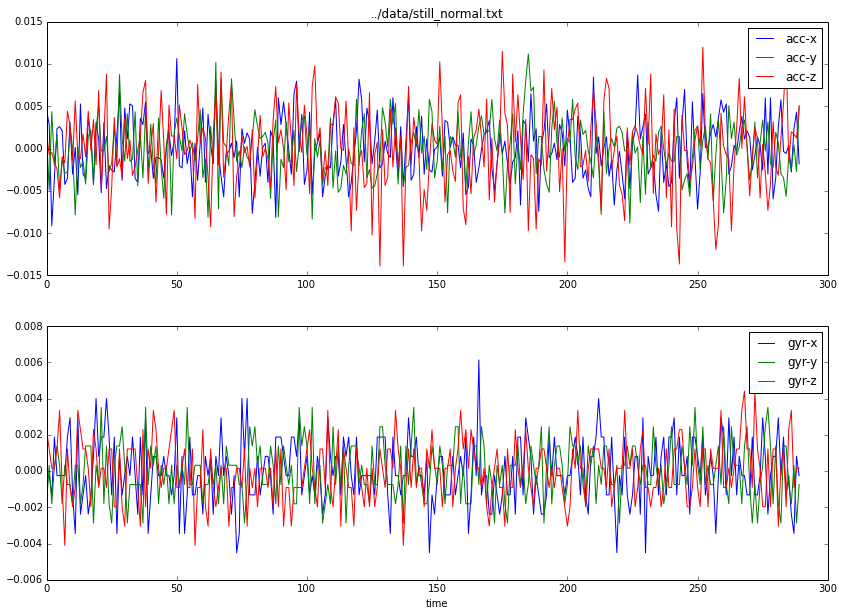

0.00631269318461
0.00259382589241


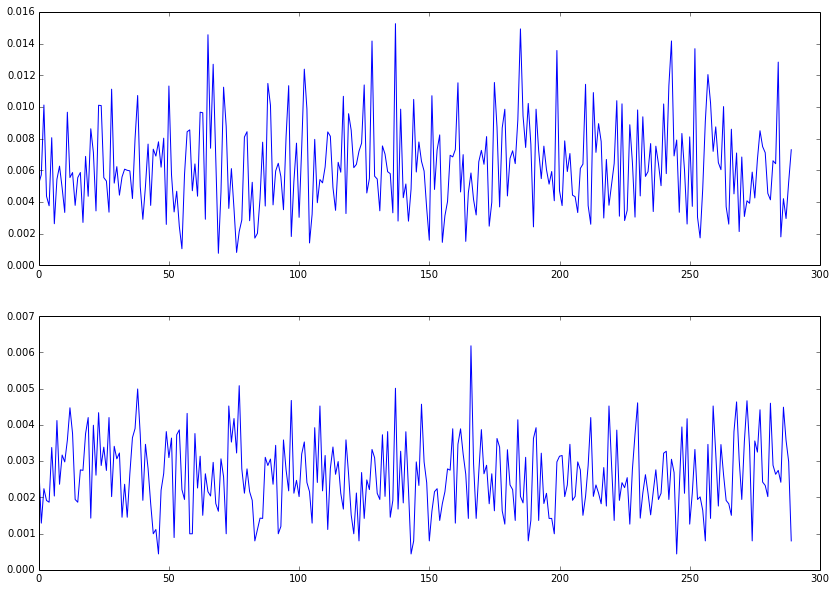

In [71]:
d = '../data/'
fileName = d+'still_normal.txt'
sig_arr = getSigs(fileName)




sig_arr = sig_arr - np.mean(sig_arr, 0)



plotSigs(sig_arr, fileName)

energy = energyXYZ(sig_arr)

print np.mean(energy[:,0])
print np.mean(energy[:,1])

fig, ax = plt.subplots(2)
ax[0].plot(energy[:,0])
ax[1].plot(energy[:,1])
plt.show()



0.00392017893608
0.0303940875511


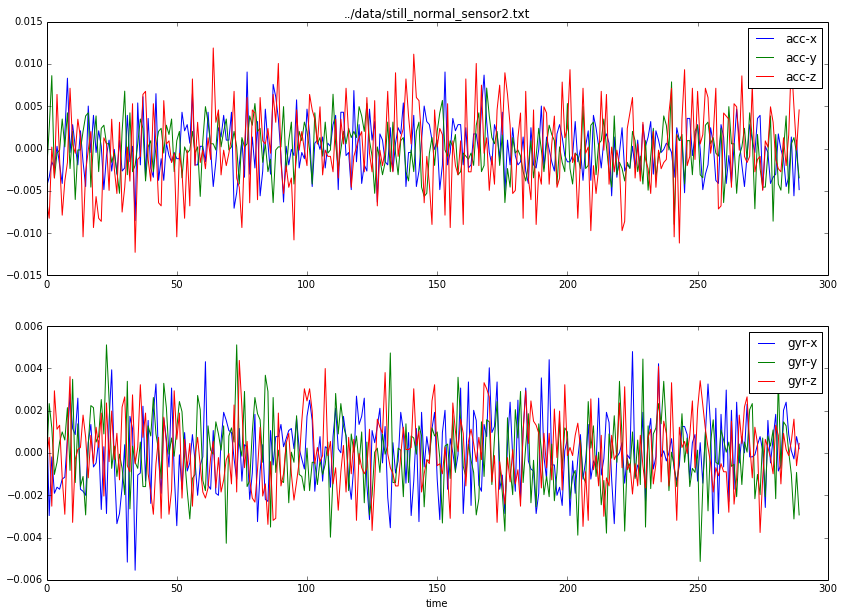

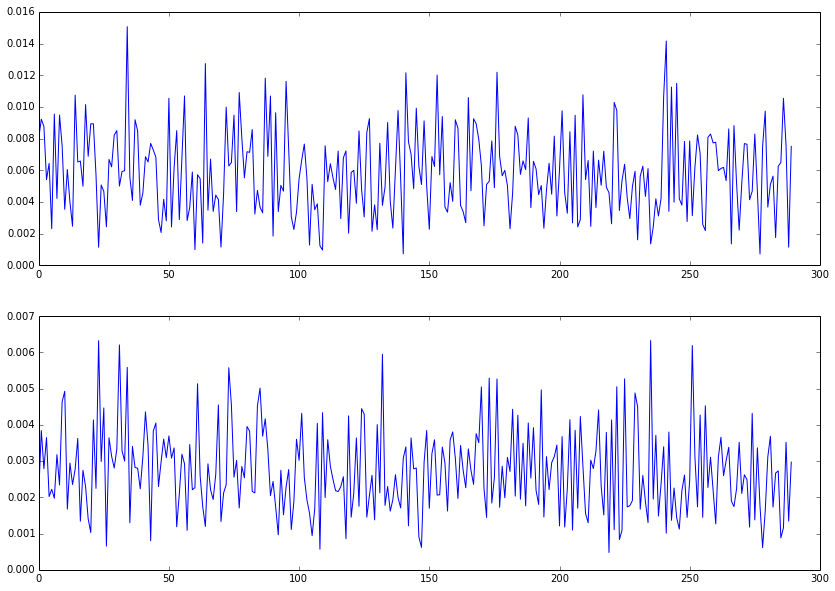

In [68]:
d = '../data/'
fileName = d+'still_normal_sensor2.txt'
sig_arr = getSigs(fileName)




sig_arr = sig_arr - np.mean(sig_arr, 0)
energy = energyXYZ(sig_arr)

#energy = energyXYZ(sig_arr)

print np.mean(energy[:,0])
print np.mean(energy[:,1])

sig_arr[:,0:3] = sig_arr[:,0:3]*0.006/0.004
sig_arr[:,3:6] = sig_arr[:,3:6]*0.0027/0.03


plotSigs(sig_arr, fileName)

energy = energyXYZ(sig_arr)


fig, ax = plt.subplots(2)
ax[0].plot(energy[:,0])
ax[1].plot(energy[:,1])
plt.show()

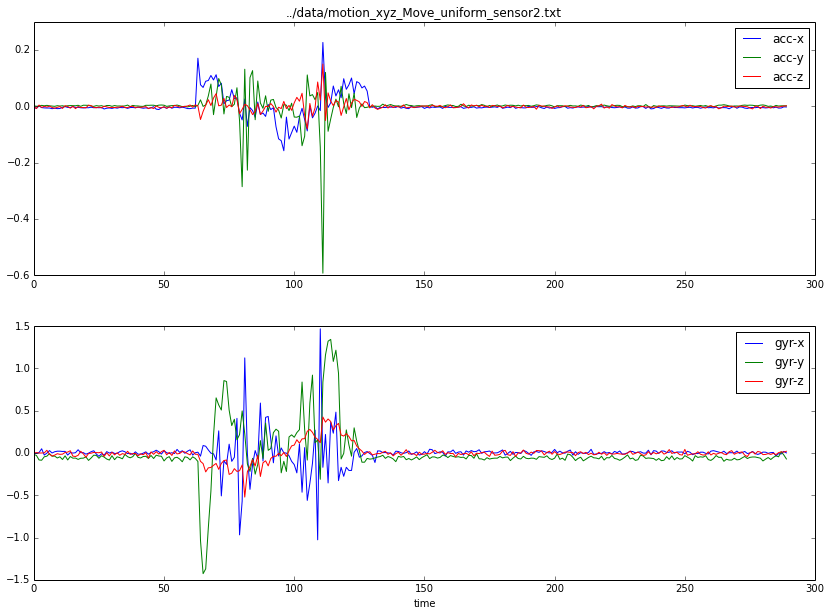

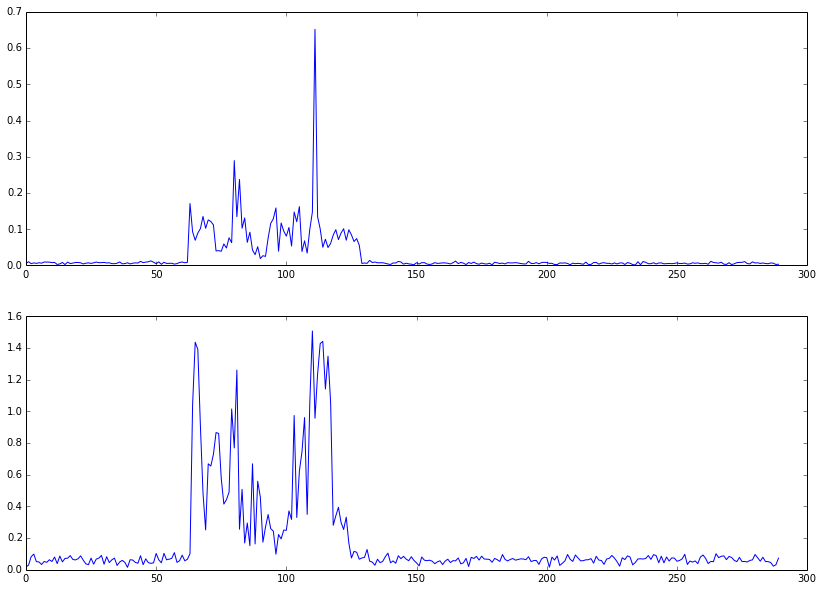

In [69]:
d = '../data/'
fileName = d+'motion_xyz_Move_uniform_sensor2.txt'
sig_arr = getSigs(fileName)
sig_arr = sig_arr - np.mean(sig_arr, 0)


#sig_arr[:,0:3] = sig_arr[:,0:3]*0.006/0.004
#sig_arr[:,3:6] = sig_arr[:,3:6]*0.0027/0.03

energy = energyXYZ(sig_arr)

plotSigs(sig_arr, fileName)

fig, ax = plt.subplots(2)
ax[0].plot(energy[:,0])
ax[1].plot(energy[:,1])
plt.show()

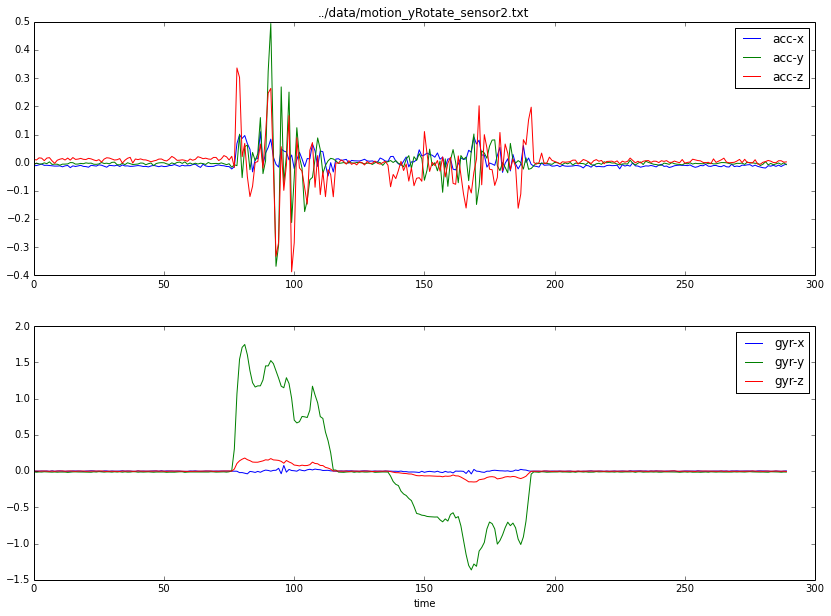

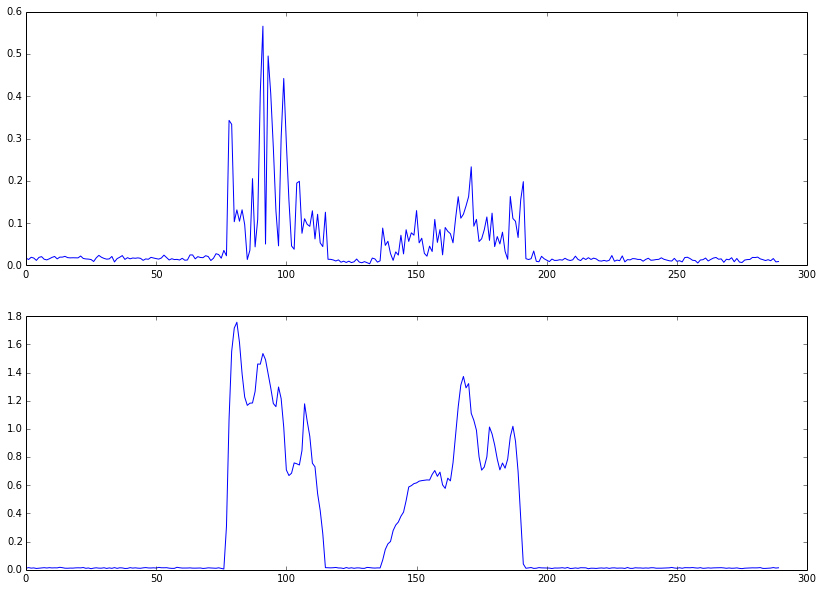

In [65]:
d = '../data/'
fileName = d+'motion_yRotate_sensor2.txt'
sig_arr = getSigs(fileName)
sig_arr = sig_arr - np.mean(sig_arr, 0)


sig_arr[:,0:3] = sig_arr[:,0:3]*0.006/0.004
sig_arr[:,3:6] = sig_arr[:,3:6]*0.0027/0.03

energy = energyXYZ(sig_arr)

plotSigs(sig_arr, fileName)

fig, ax = plt.subplots(2)
ax[0].plot(energy[:,0])
ax[1].plot(energy[:,1])
plt.show()

In [70]:
r1= 0.006/0.004
r2 = 0.0027/0.03
print r1, r2


1.5 0.09
